## Risk Assessment & Forecast on Loan Defaults
#### By: Hayden Allison | 2/11/2024
#### Highlights: Machine Learning Algorithms & Statistical Modelling & Hypothesis Testing
#### Population: Prosper Loan Batch (113,066 records)
### Main Research Question:
Are classifications or measurements evaluated by Prosper regarding loan applicants utilized in alotting them conditions?

##### Null Hypothesis: Uniform average/median for the class.
##### Alternate Hypothesis: The average/median of loan conditions (APR and amount) is relative to class members.

### Other Research Questions:
1. Of the quantitative attributes with a relationship, do any of them provide insight into an assortment of optimal loan conditions?
2. Does the occupation or income range of a customer affect their responsiveness towards marketing campaigns?
3. Are there certain customer demographics that are opportunistic towards loans?


In [1]:
alpha = .05
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from lightgbm import LGBMClassifier
from scipy.stats import levene, kruskal, f_oneway,  mannwhitneyu, ttest_ind
from scikit_posthocs import posthoc_dunn, posthoc_conover
import pandas as pd
import random
import pygwalker as pyg
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import math as m
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer
from sklearn.linear_model import LogisticRegression
from sklearn.multioutput import MultiOutputClassifier
from sklearn.compose import make_column_transformer as mct
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn import set_config
from matplotlib.font_manager import FontProperties
from itertools import chain
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.stats.proportion import proportions_ztest
from statsmodels.stats.weightstats import ztest
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.nonparametric.smoothers_lowess import lowess
from statsmodels.tools.tools import maybe_unwrap_results
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsforecast import StatsForecast 
from statsforecast.utils import ConformalIntervals
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from statsmodels.stats.diagnostic import acorr_ljungbox
from datasetsforecast.losses import mae, mase, rmse, mse
from statsforecast.models import GARCH, MSTL, AutoARIMA, AutoCES, AutoTheta, AutoETS
from statsforecast.arima import arima_string
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, RobustScaler, LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_predict, cross_val_score, KFold, StratifiedKFold
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from IPython.display import display_html
from typing import Type
from pylab import rcParams
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)
# warnings.filterwarnings("ignore", category=UserWarning)
# removes copy warning
pd.options.mode.chained_assignment = None
pd.set_option('display.precision', 3)

import pygwalker as pyg
''' walker = pyg.walk(
    roots,
    spec="./chart_meta_0.json",   this json file will save your chart state, you need to click save button in ui mannual when you finish a chart, 'autosave' will be supported in the future.
    use_kernel_calc=True,         set `use_kernel_calc=True`, supports bigger datasets (<=100GB).
)
'''
import sweetviz as sv
# advert_report = sv.analyze(roots)
# advert_report.show_html('Advertising.html')

# beautiful chart settings
style_options = ['seaborn-v0_8-darkgrid', 'fivethirtyeight', 'dark_background', 'ggplot']
palettes = ["https://seaborn.pydata.org/tutorial/color_palettes.html"]
plt.style.use('ggplot')
plt.rcParams['lines.linewidth'] = 1.5
dark_style = { 'figure.facecolor': '#212946', 'axes.facecolor': '#212946', 'savefig.facecolor':'#212946', 'grid.color': '#2A3459',
    'axes.grid': True,
    'axes.grid.which': 'both',
    'axes.spines.left': False,
    'axes.spines.right': False,
    'axes.spines.top': False,
    'axes.spines.bottom': False,
    'grid.linewidth': '1',
    'text.color': '.9',
    'axes.labelcolor': '.9',
    'xtick.color': '.9',
    'ytick.color': '.9',
    'lines.color': 'lime',
    'font.size': 11,
    'axes.titlesize': 14,
    'axes.titlepad': 20}
plt.rcParams.update(dark_style)
# rcParams['figure.figsize'] = (20,7)

class LinearRegDiagnostic():
    """
        (1) Added two more ways to compute the Cook's Distance (D) threshold:
            * 'baseR': D > 1 and D > 0.5 (default)
            * 'convention': D > 4/n
            * 'dof': D > 4 / (n - k - 1)
    """

    def __init__(self,
                 results: Type[sm.regression.linear_model.RegressionResultsWrapper]) -> None:

        if isinstance(results, sm.regression.linear_model.RegressionResultsWrapper) is False:
            raise TypeError("result must be instance of statsmodels.regression.linear_model.RegressionResultsWrapper object")

        self.results = maybe_unwrap_results(results)

        self.y_true = self.results.model.endog
        self.y_predict = self.results.fittedvalues
        self.xvar = self.results.model.exog
        self.xvar_names = self.results.model.exog_names

        self.residual = np.array(self.results.resid)
        influence = self.results.get_influence()
        self.residual_norm = influence.resid_studentized_internal
        self.leverage = influence.hat_matrix_diag
        self.cooks_distance = influence.cooks_distance[0]
        self.nparams = len(self.results.params)
        self.nresids = len(self.residual_norm)

    def __call__(self, **kwargs):
        fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(16,10))
        self.residual_plot(ax=ax[0,2])
        self.QQ_plot(ax=ax[0,1])
        self.reg_plot(ax=ax[0,0])
        self.scale_location_plot(ax=ax[1,0])
        self.leverage_plot(
            ax=ax[1,1],
            high_leverage_threshold = kwargs.get('high_leverage_threshold'),
            cooks_threshold = kwargs.get('cooks_threshold'))
        self.ACF_plot(ax=ax[1,2])
        plt.tight_layout()
        plt.show()
        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20,6))
        self.residual_noise(ax=ax)
        plt.show()

        return self.vif_table(), fig, ax,

    def residual_noise(self, ax=None):
        return ax.plot(self.residual)

    def residual_plot(self, ax=None, color='#87ae73'):
        if ax is None:
            fig, ax = plt.subplots()

        sns.residplot(
            x=self.y_predict,
            y=self.residual,
            lowess=True,
            scatter_kws={'alpha': 0.5, 'color': '#87ae73'},
            line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        residual_abs = np.abs(self.residual)
        abs_resid = np.flip(np.argsort(residual_abs), 0)
        abs_resid_top_3 = abs_resid[:3]
        for i in abs_resid_top_3:
            ax.annotate(
                i,
                xy=(self.y_predict[i], self.residual[i]),
                color='#8d05e8')

        ax.set_title('Linearity (~horizontal line)', fontweight="bold")
        ax.set_xlabel('Fitted values')
        ax.set_ylabel('Residuals')
        return ax

    def reg_plot(self, ax=None):
        if ax is None:
            fig, ax = plt.subplots()

        plot_df = pd.DataFrame({'actual': self.y_true, 'predicted': self.y_predict})

        sns.regplot(data=plot_df, x='actual', y='predicted', color='#87ae73', marker="x",
                    line_kws={'color': '#8d05e8', 'lw': 2, 'ls': ':'}, ax=ax)

        ax.set_title('Actual vs Predicted', fontweight="bold")
        ax.set_xlabel('Actual Values')
        ax.set_ylabel('Predicted Values')
        return ax

    def scale_location_plot(self, ax=None, color='C4'):
        if ax is None:
            fig, ax = plt.subplots()

        residual_norm_abs_sqrt = np.sqrt(np.abs(self.residual_norm))

        ax.scatter(self.y_predict, residual_norm_abs_sqrt, alpha=0.5, color='#87ae73');
        sns.regplot(
            x=self.y_predict,
            y=residual_norm_abs_sqrt,
            scatter=False, ci=False,
            lowess=True,
            line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        abs_sq_norm_resid = np.flip(np.argsort(residual_norm_abs_sqrt), 0)
        abs_sq_norm_resid_top_3 = abs_sq_norm_resid[:3]
        for i in abs_sq_norm_resid_top_3:
            ax.annotate(
                i,
                xy=(self.y_predict[i], residual_norm_abs_sqrt[i]),
                color='#8d05e8')

        ax.set_title('Homoscedasticity (~horizontal line)', fontweight="bold")
        ax.set_xlabel('Fitted values')
        ax.set_ylabel(r'$\sqrt{|\mathrm{Standardized\ Residuals}|}$');
        return ax

    def leverage_plot(self, ax=None, high_leverage_threshold=False, cooks_threshold='convention', color='#87ae73'):
        if ax is None:
            fig, ax = plt.subplots()

        ax.scatter(
            self.leverage,
            self.residual_norm,
            alpha=0.5,
            color='#87ae73');

        sns.regplot(
            x=self.leverage,
            y=self.residual_norm,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        leverage_top_3 = np.flip(np.argsort(self.cooks_distance), 0)[:3]
        for i in leverage_top_3:
            ax.annotate(
                i,
                xy=(self.leverage[i], self.residual_norm[i]),
                color = '#8d05e8')

        factors = []
        if cooks_threshold == 'baseR' or cooks_threshold is None:
            factors = [1, 0.5]
        elif cooks_threshold == 'convention':
            factors = [4/self.nresids]
        elif cooks_threshold == 'dof':
            factors = [4/ (self.nresids - self.nparams)]
        else:
            raise ValueError("threshold_method must be one of the following: 'convention', 'dof', or 'baseR' (default)")
        for i, factor in enumerate(factors):
            label = "Cook's distance" if i == 0 else None
            xtemp, ytemp = self.__cooks_dist_line(factor)
            ax.plot(xtemp, ytemp, label=label, lw=1.25, ls='--', color='#910951')
            ax.plot(xtemp, np.negative(ytemp), lw=1.25, ls='--', color='#910951')

        if high_leverage_threshold:
            high_leverage = 2 * self.nparams / self.nresids
            if max(self.leverage) > high_leverage:
                ax.axvline(high_leverage, label='High leverage', ls='-.', color='#8d05e8', lw=1)

        ax.axhline(0, ls='dotted', color='black', lw=1.25)
        ax.set_xlim(0, max(self.leverage)+0.01)
        ax.set_ylim(min(self.residual_norm)-0.1, max(self.residual_norm)+0.1)
        ax.set_title('Leverage (none outside cook\'s)', fontweight="bold")
        ax.set_xlabel('Leverage')
        ax.set_ylabel('Standardized Residuals')
        plt.legend(loc='best')
        return ax
        
    def QQ_plot(self, ax=None):
        stats.probplot(self.residual, dist='norm', plot=ax)
        ax.set_title('Normality (~on line)', fontweight="bold")
        return ax

    def ACF_plot(self, ax=None):
        plot_acf(self.residual, lags=60, ax=ax, color='orange', zero=False)
        ax.set_title('Noise (none significant)', fontweight="bold")
        return ax

    def vif_table(self):
        vif_df = pd.DataFrame()
        vif_df["Features"] = self.xvar_names
        vif_df["VIF Factor"] = [variance_inflation_factor(self.xvar, i) for i in range(self.xvar.shape[1])]

        return (vif_df
                .sort_values("VIF Factor")
                .round(2))


    def __cooks_dist_line(self, factor):
        """
        Helper function for plotting Cook's distance curves
        """
        p = self.nparams
        formula = lambda x: np.sqrt((factor * p * (1 - x)) / x)
        x = np.linspace(0.001, max(self.leverage), 50)
        y = formula(x)
        return x, y


    def __qq_top_resid(self, quantiles, top_residual_indices):
        """
        Helper generator function yielding the index and coordinates
        """
        offset = 0
        quant_index = 0
        previous_is_negative = None
        for resid_index in top_residual_indices:
            y = self.residual_norm[resid_index]
            is_negative = y < 0
            if previous_is_negative == None or previous_is_negative == is_negative:
                offset += 1
            else:
                quant_index -= offset
            x = quantiles[quant_index] if is_negative else np.flip(quantiles, 0)[quant_index]
            quant_index += 1
            previous_is_negative = is_negative
            yield resid_index, x, y

# level= is for KPSS. 'ct' or 'c' or none
# KPSS * ADF are p-values
def diagnostic_plots(x, predictions, residuals, level=None, lags=60):    
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 16))
    residuals.plot(ax=axes[0][0], title='Residuals')
    residuals.rolling(21).mean().plot(ax=axes[0][0], c='k', lw=1)
    probplot(residuals, plot=axes[0][1])
    mean, var, skew, kurtosis = moment(residuals, moment=[1, 2, 3, 4])
    s = f'Mean: {mean:>12.2f}\nSD: {np.sqrt(var):>16.2f}\nSkew: {skew:12.2f}\nKurtosis:{kurtosis:9.2f}'
    axes[0][1].text(x=.02, y=.75, s=s, transform=axes[0][1].transAxes)
    plot_acf(x=residuals, lags=lags, zero=False, ax=axes[1][0])
    plot_pacf(residuals, lags=lags, zero=False, ax=axes[1][1])
    # Plot for Linearity
    sns.residplot(x=predictions,
                  y=residuals,
                  lowess=True,
                  scatter_kws={'alpha': 0.5, 'color': '#87ae73'},
                  line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
                  ax=axes[2][0])
    # Plot for Homoscedasticity
    residual_norm_abs_sqrt = np.sqrt(np.abs(residuals))
    axes[2][1].scatter(predictions, residual_norm_abs_sqrt, alpha=0.5, color='#87ae73')
    sns.regplot(x=predictions,
                y=residual_norm_abs_sqrt,
                scatter=False, ci=False,
                lowess=True,
                line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
                ax=axes[2][1])
    axes[2][1].set_title('Homoscedasticity (~horizontal line)', fontweight="bold")
    axes[2][1].set_xlabel('Fitted values')
    axes[2][1].set_ylabel(r'$\sqrt{|\mathrm{Standardized\ Residuals}|}$')
    axes[2][0].set_title('Linearity (~horizontal line)')
    axes[2][0].set_xlabel('Fitted values')
    axes[2][0].set_ylabel('Residuals')
    axes[1][0].set_xlabel('Lag')
    axes[1][1].set_xlabel('Lag')
    KP = kpss(x, level)
    q_p = np.max(q_stat(acf(x, nlags=lags), len(x))[1])
    ljung = acorr_ljungbox(x, lags, boxpierce=True)
    ADF = adfuller(x)
    fig.suptitle(f'ADF: {np.max(q_p):.2f}  |  P: {ADF[1]:.2f}    &    '+f'KPSS: {KP[0]:.2f}  |  P: {KP[1]:.2f}\n'+f'Ljung: {ljung.iloc[:, 0].max():.2f}  |  P: {ljung.iloc[:, 1].max():.2f}    &    Box: {ljung.iloc[:, 2].max():.2f}  |  P: {ljung.iloc[:, 3].max():.2f}', fontsize=14)
    sns.despine()
    fig.tight_layout()
    plt.show()

C:\Users\tekre\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsforecast\core.py:26: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
def SSstandardize(df):
    SS = StandardScaler()
    if df.shape[1] > 1:
        single_df = SS.fit_transform(df)
        Sarray = np.array(single_df)
        return Sarray, SS
    else:
        single_df = SS.fit_transform(df)
        Sarray = np.array(single_df).reshape(-1)
        return Sarray, SS

def SSstandardizeII(df, HT):
    SS = StandardScaler()
    # Keep track of the original number of rows in df for later separation
    original_df_rows = df.shape[0]
        
    combined_df = pd.concat([df, HT], axis=0)
    scaled_combined = SS.fit_transform(combined_df)
        
    # Separate the scaled data back into its components
    scaled_df = scaled_combined[:original_df_rows, :]
    scaled_HT = scaled_combined[original_df_rows:, :]
    
    if df.shape[1] == HT.shape[1]:
        if df.shape[1] == 1 and HT.shape[1] == 1:
            return scaled_df.reshape(-1), scaled_HT.reshape(-1), SS
            
        elif df.shape[1] > 1 and HT.shape[1] > 1:
            return scaled_df, scaled_HT, SS

    else:
        print('dataframe don\'t have equal columns')
        return df, HT, SS

def RSstandardize(df):
    RS = RobustScaler()
    if df.shape[1] > 1:
        single_df = RS.fit_transform(df)
        Sarray = np.array(single_df)
        return Sarray, RS
    else:
        single_df = RS.fit_transform(df)
        Sarray = np.array(single_df).reshape(-1)
        return Sarray, RS

def RSstandardizeII(df, HT):
    RS = RobustScaler()
    # Keep track of the original number of rows in df for later separation
    original_df_rows = df.shape[0]
        
    combined_df = pd.concat([df, HT], axis=0)
    scaled_combined = RS.fit_transform(combined_df)
        
    # Separate the scaled data back into its components
    scaled_df = scaled_combined[:original_df_rows, :]
    scaled_HT = scaled_combined[original_df_rows:, :]
    
    if df.shape[1] == HT.shape[1]:
        if df.shape[1] == 1 and HT.shape[1] == 1:
            return scaled_df.reshape(-1), scaled_HT.reshape(-1), RS
            
        elif df.shape[1] > 1 and HT.shape[1] > 1:
            return scaled_df, scaled_HT, RS

    else:
        print('dataframe don\'t have equal columns')
        return df, HT, RS

def check_stationarity(**kwargs):
    result = adfuller(kwargs['test'].values)

    print(f'DF: {kwargs['df']}  |  COL: {kwargs['col']}')
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    if (result[1] <= 0.05) & (result[4]['5%'] > result[0]):
        print("\u001b[32mStationary\u001b[0m", "\n")
    else:
        print("\x1b[31mNon-stationary\x1b[0m", "\n")

def check_stationarityII(**kwargs):
    result = kpss(kwargs['test'].values)

    print(f'DF: {kwargs['df']}  |  COL: {kwargs['col']}')
    print('KPSS Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[3].items():
        print('\t%s: %.3f' % (key, value))

    if (result[1] <= 0.05) & (result[3]['5%'] > result[0]):
        print("\x1b[31mNon-stationary\x1b[0m", "\n")
    else:
        print("\u001b[32mStationary\u001b[0m", "\n")

# y_pred is the true y values along with results from the a model and it's confidence intervals
# accepts a list of each input to create a dataframe of metrics per model
# DON'T USE METRIC NAMES OUTSIDE OF FUNCTION (ex: mae), IT WILL BERAK THE CODE
def evaluate_performance(y_hist, y_pred, model, seasonality=1):
    evaluation = {}
    for c, mod in enumerate(model):
        evaluation[mod] = {}
        for metric in [mase, mae, mse, rmse]:
            metric_name = metric.__name__
            if metric_name =='mase':
                evaluation[mod][metric_name] = metric(y_pred[c]['y'].values, 
                                                    y_pred[c][mod].values, 
                                                    y_hist[c]['y'].values, seasonality)
            else:
                evaluation[mod][metric_name] = metric(y_pred[c]['y'].values, y_pred[c][mod].values)
            
        # solving for MAD
        deviations = []
        meanG = y_pred[c][mod].mean()
        for val in y_pred[c]['y'].values:
            ans = abs(val-meanG)
            deviations.append(ans)
        MAD = round(np.sum(np.array(deviations))/len(y_pred[c]), 2)
        evaluation[mod]['mad'] = MAD
    
    return pd.DataFrame(evaluation).T

def step_sequenceII(df, proportion_in, proportion_out):
    times = df['date'].copy()
    length = len(times)
    steps_in = int(m.ceil(length*proportion_in))
    steps_out = int(m.floor(length*proportion_out))
    slide_length = length-steps_in
    steps_frame = int(m.ceil(slide_length*proportion_out))-2
    return steps_in, steps_out, steps_frame

def step_sequence(df, proportion_in):
    times = df['ds'].copy()
    length = len(times)
    steps_size = int(m.ceil(length*proportion_in))
    steps_frame = int(m.ceil(length/steps_size))
    return steps_size, steps_frame

def plotSeasonalDecompose(
    x,
    model='additive',
    filt=None,
    period=None,
    two_sided=True,
    extrapolate_trend=0,
    title="Seasonal Decomposition"):

    result = seasonal_decompose(
            x, model=model, filt=filt, period=period,
            two_sided=two_sided, extrapolate_trend=extrapolate_trend)
    fig = make_subplots(
            rows=4, cols=1,
            subplot_titles=["Observed", "Trend", "Seasonal", "Residuals"])
    for idx, col in enumerate(['observed', 'trend', 'seasonal', 'resid']):
        fig.add_trace(
            go.Scatter(x=result.observed.index, y=getattr(result, col), mode='lines'),
                row=idx+1, col=1,
            )
    return fig

## Data Preparation

In [3]:
# Importing tables from Part I Analysis
credit_df = pd.read_csv(r'C:\Users\tekre\OneDrive\Desktop\Job\Portfolio\Analysis Projects\2. 02172024 - Root Cause & Risk Analysis on Loans\Tables\credit_table.csv')
customer_df = pd.read_csv(r'C:\Users\tekre\OneDrive\Desktop\Job\Portfolio\Analysis Projects\2. 02172024 - Root Cause & Risk Analysis on Loans\Tables\customer_table.csv')
loan_df = pd.read_csv(r'C:\Users\tekre\OneDrive\Desktop\Job\Portfolio\Analysis Projects\2. 02172024 - Root Cause & Risk Analysis on Loans\Tables\loan_table.csv')
mega_df = pd.read_csv(r'C:\Users\tekre\OneDrive\Desktop\Job\Portfolio\Analysis Projects\2. 02172024 - Root Cause & Risk Analysis on Loans\Tables\mega_table.csv')

In [4]:
anova_df = mega_df[['IncomeRange', 'CreditScoreRangeLower', 'CreditScoreRangeUpper', 'LoanOriginalAmount', 'BorrowerAPR']]
anova_df.head(5)

,IncomeRange,CreditScoreRangeLower,CreditScoreRangeUpper,LoanOriginalAmount,BorrowerAPR
0,"$25,000-49,999",640.0,659.0,9425,0.165
1,"$50,000-74,999",680.0,699.0,10000,0.120
2,"$25,000-49,999",480.0,499.0,3001,0.283
3,"$100,000+",800.0,819.0,10000,0.125
4,"$100,000+",680.0,699.0,15000,0.246


The Credit Score columns need to be an ordinal qualitative variable so brackets are being implemented. This is done according to the FICO credit model instead of VantageScore since it wins in popularity - that documentation of variables doesn't clarify which model the scores are based from. Also note how there is 2 credit score features. A dervied variable is going into a single feature for use in testing thats the average between the 2 scores, for each customer.

In [5]:
# Creating a single derived variable
anova_df.loc[:, 'CreditScore'] = round((anova_df.loc[:, 'CreditScoreRangeUpper']+anova_df.loc[:, 'CreditScoreRangeLower'])/2, 0)
anova_df.drop(['CreditScoreRangeUpper', 'CreditScoreRangeLower'], axis=1, inplace=True)

In [6]:
# replacing scores into ratings
def credit_rates(df):
    edit_df = df.copy()
    ratings = []
    for score in df['CreditScore']:
        if score <= 579:
            ratings.append('Poor')
        elif score > 579 and score <= 669:
            ratings.append('Fair')
        elif score > 669 and score <= 739:
            ratings.append('Good')
        elif score > 739 and score <= 799:
            ratings.append('Very Good')
        else:
            ratings.append('Exceptional')
    edit_df.loc[:, 'CreditScore'] = ratings
    return edit_df

anova_df = credit_rates(anova_df)

# Establishing ordinal status for credit rating
credit_ranks = ['Poor', 'Fair', 'Good', 'Very Good', 'Exceptional']
credit_ratings = pd.CategoricalDtype(categories=credit_ranks, ordered=True)
anova_df['CreditScore'] = anova_df['CreditScore'].astype(credit_ratings)

# Establishing ordinal status for income range
income_ranks = ['$0', '$1-24,999', '$25,000-49,999', '$50,000-74,999', '$75,000-99,999', '$100,000+']
income_ranges = pd.CategoricalDtype(categories=income_ranks, ordered=True)
anova_df['IncomeRange'] = anova_df['IncomeRange'].astype(income_ranges)

In [7]:
anova_df.isna().sum()

IncomeRange           0
LoanOriginalAmount    0
BorrowerAPR           0
CreditScore           0
dtype: int64

## Research Question 1: Credit Rating Statistic Model

In [8]:
# Test 1: Credit Score by Loan Amount
test_1_poor = np.array(anova_df.loc[anova_df['CreditScore']=='Poor', 'LoanOriginalAmount'])
test_1_fair = np.array(anova_df.loc[anova_df['CreditScore']=='Fair', 'LoanOriginalAmount'])
test_1_good = np.array(anova_df.loc[anova_df['CreditScore']=='Good', 'LoanOriginalAmount'])
test_1_verygood = np.array(anova_df.loc[anova_df['CreditScore']=='Very Good', 'LoanOriginalAmount'])
test_1_exceptional = np.array(anova_df.loc[anova_df['CreditScore']=='Exceptional', 'LoanOriginalAmount'])

# Test 2: Credit Score by APR
test_2_poor = np.array(anova_df.loc[anova_df['CreditScore']=='Poor', 'BorrowerAPR'])
test_2_fair = np.array(anova_df.loc[anova_df['CreditScore']=='Fair', 'BorrowerAPR'])
test_2_good = np.array(anova_df.loc[anova_df['CreditScore']=='Good', 'BorrowerAPR'])
test_2_verygood = np.array(anova_df.loc[anova_df['CreditScore']=='Very Good', 'BorrowerAPR'])
test_2_exceptional = np.array(anova_df.loc[anova_df['CreditScore']=='Exceptional', 'BorrowerAPR'])

### Time to evaluate for normal distribution of dependent variables (Loan Amount & APR)

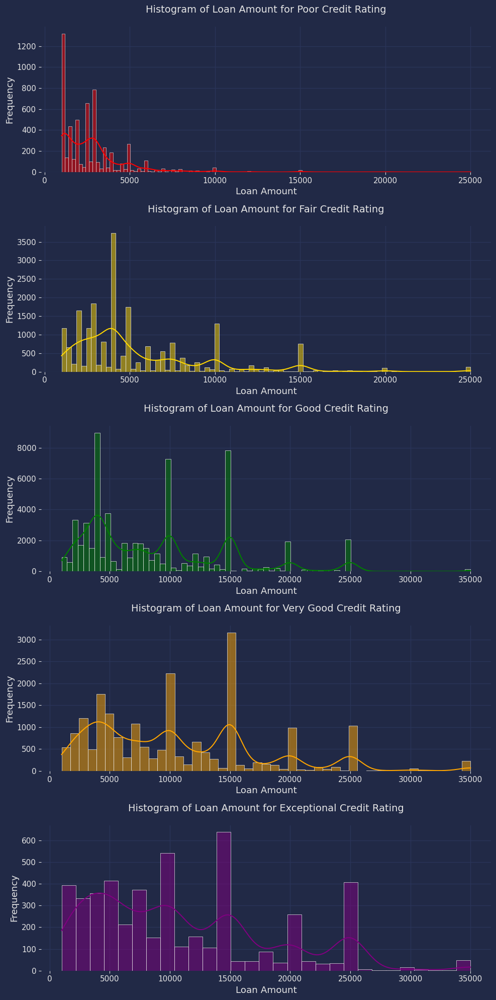

In [9]:
# initializing bins
bins_1_poor = np.histogram_bin_edges(test_1_poor, bins='auto')
bins_1_fair = np.histogram_bin_edges(test_1_fair, bins='auto')
bins_1_good = np.histogram_bin_edges(test_1_good, bins='auto')
bins_1_verygood = np.histogram_bin_edges(test_1_verygood, bins='auto')
bins_1_exceptional = np.histogram_bin_edges(test_1_exceptional, bins='auto')

fig, axs = plt.subplots(5, 1, figsize=(10, 20))

# PLot histrograms for each credit rating
sns.histplot(test_1_poor, bins=bins_1_poor, color='red', alpha=0.5, kde=True, ax=axs[0])
axs[0].set_title('Histogram of Loan Amount for Poor Credit Rating')
axs[0].set_xlabel('Loan Amount')
axs[0].set_ylabel('Frequency')

sns.histplot(test_1_fair, bins=bins_1_fair, color='gold', alpha=0.5, kde=True, ax=axs[1])
axs[1].set_title('Histogram of Loan Amount for Fair Credit Rating')
axs[1].set_xlabel('Loan Amount')
axs[1].set_ylabel('Frequency')

sns.histplot(test_1_good, bins=bins_1_good, color='green', alpha=0.5, kde=True, ax=axs[2])
axs[2].set_title('Histogram of Loan Amount for Good Credit Rating')
axs[2].set_xlabel('Loan Amount')
axs[2].set_ylabel('Frequency')

sns.histplot(test_1_verygood, bins=bins_1_verygood, color='orange', alpha=0.5, kde=True, ax=axs[3])
axs[3].set_title('Histogram of Loan Amount for Very Good Credit Rating')
axs[3].set_xlabel('Loan Amount')
axs[3].set_ylabel('Frequency')

sns.histplot(test_1_exceptional, bins=bins_1_exceptional, color='purple', alpha=0.5, kde=True, ax=axs[4])
axs[4].set_title('Histogram of Loan Amount for Exceptional Credit Rating')
axs[4].set_xlabel('Loan Amount')
axs[4].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

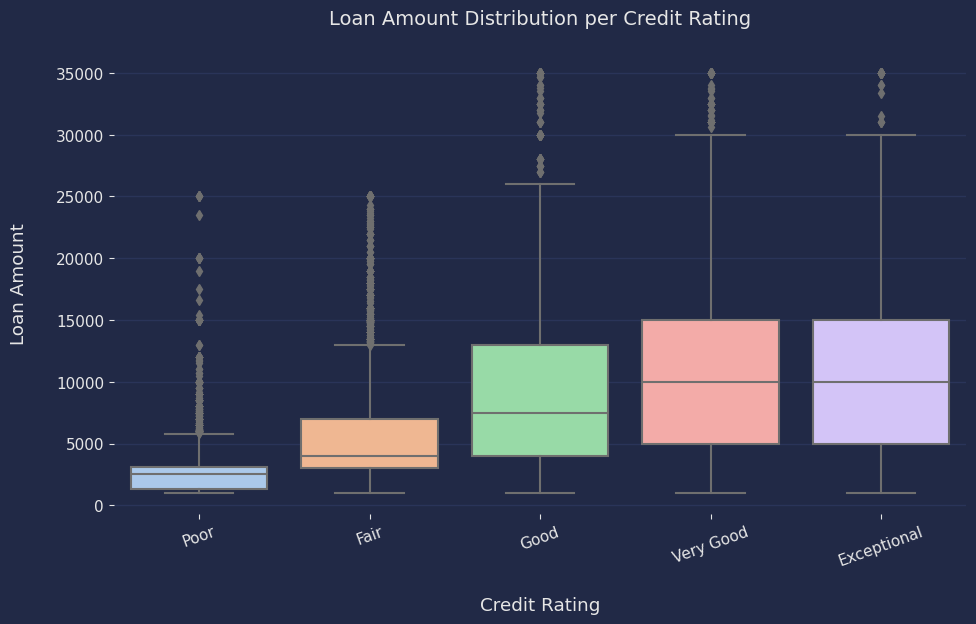

In [10]:
plt.figure(figsize=(11,6))
sns.boxplot(data=anova_df, x='CreditScore', y='LoanOriginalAmount', palette='pastel')
plt.xticks(rotation=20)
plt.title('Loan Amount Distribution per Credit Rating')
plt.xlabel('Credit Rating', labelpad=20)
plt.ylabel('Loan Amount', labelpad=20)
plt.show()

These distributions are positively skewed and don't follow empiricule rule which indicates tests with condition of Guassian distributions can't be used - from the bottom side median and top side outliers in box plot and the shape & spread of histrogram.

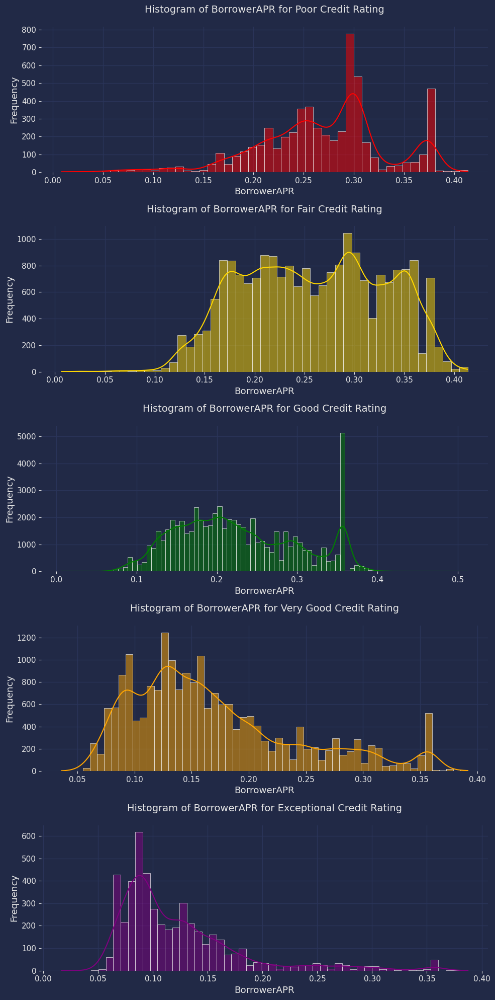

In [11]:
# initializing bins
bins_2_poor = np.histogram_bin_edges(test_2_poor, bins='auto')
bins_2_fair = np.histogram_bin_edges(test_2_fair, bins='auto')
bins_2_good = np.histogram_bin_edges(test_2_good, bins='auto')
bins_2_verygood = np.histogram_bin_edges(test_2_verygood, bins='auto')
bins_2_exceptional = np.histogram_bin_edges(test_2_exceptional, bins='auto')

fig, axs = plt.subplots(5, 1, figsize=(10, 20))

# Plot histograms for each credit rating
sns.histplot(test_2_poor, bins=bins_2_poor, color='red', alpha=0.5, kde=True, ax=axs[0])
axs[0].set_title('Histogram of BorrowerAPR for Poor Credit Rating')
axs[0].set_xlabel('BorrowerAPR')
axs[0].set_ylabel('Frequency')

sns.histplot(test_2_fair, bins=bins_2_fair, color='gold', alpha=0.5, kde=True, ax=axs[1])
axs[1].set_title('Histogram of BorrowerAPR for Fair Credit Rating')
axs[1].set_xlabel('BorrowerAPR')
axs[1].set_ylabel('Frequency')

sns.histplot(test_2_good, bins=bins_2_good, color='green', alpha=0.5, kde=True, ax=axs[2])
axs[2].set_title('Histogram of BorrowerAPR for Good Credit Rating')
axs[2].set_xlabel('BorrowerAPR')
axs[2].set_ylabel('Frequency')

sns.histplot(test_2_verygood, bins=bins_2_verygood, color='orange', alpha=0.5, kde=True, ax=axs[3])
axs[3].set_title('Histogram of BorrowerAPR for Very Good Credit Rating')
axs[3].set_xlabel('BorrowerAPR')
axs[3].set_ylabel('Frequency')

sns.histplot(test_2_exceptional, bins=bins_2_exceptional, color='purple', alpha=0.5, kde=True, ax=axs[4])
axs[4].set_title('Histogram of BorrowerAPR for Exceptional Credit Rating')
axs[4].set_xlabel('BorrowerAPR')
axs[4].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

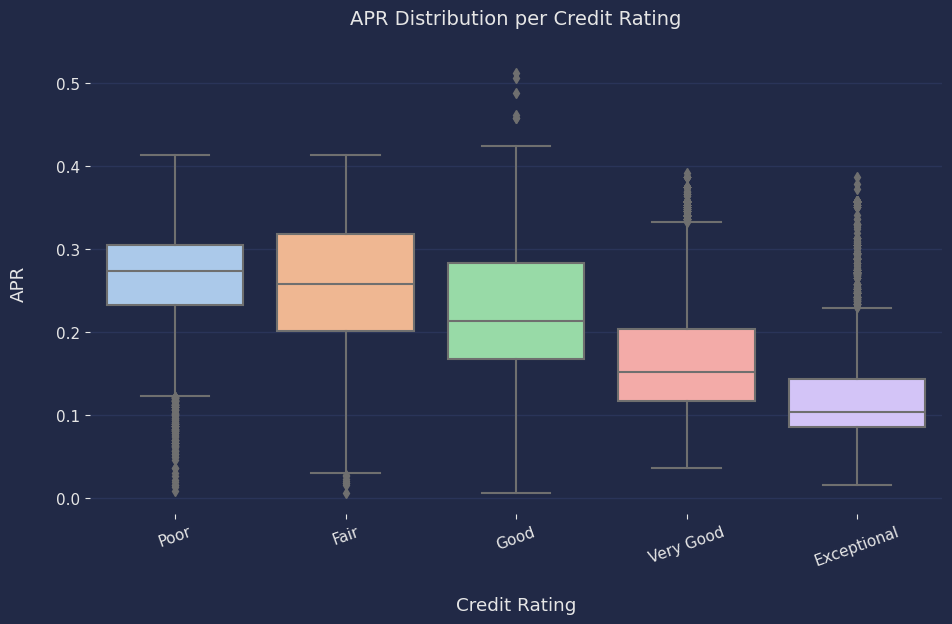

In [12]:
plt.figure(figsize=(11,6))
sns.boxplot(data=anova_df, x='CreditScore', y='BorrowerAPR', palette='pastel')
plt.xticks(rotation=20)
plt.title('APR Distribution per Credit Rating')
plt.xlabel('Credit Rating', labelpad=20)
plt.ylabel('APR', labelpad=20)
plt.show()

Poor, Very Good, and Excellent are positively skewed in box plot and no category follows empiricul rule which indicates tests with conditions of normal distributions can't be used - from the shape & spread of histrogram.

### Creating Test 1 & 2 Samples for Statistical Modelling

In [13]:
# Since Credit Score isn't depdenent on Amount/APR, tests 1 and 2 have groups of equal size
print('Sizes (N) of Loan Amount/APR by Credit Rating')
print('Poor:', len(test_1_poor))
print('Fair:', len(test_1_fair))
print('Good:', len(test_1_good))
print('Very Good:', len(test_1_verygood))
print('Exceptional:', len(test_1_exceptional))

Sizes (N) of Loan Amount/APR by Credit Rating
Poor: 5641
Fair: 20997
Good: 61195
Very Good: 20384
Exceptional: 4849


In [14]:
# Original groups are being filtered to eliminate outliers
test_groups = [test_1_poor, test_1_fair, test_1_good, test_1_verygood, test_1_exceptional]
test_groups_filtered = [list(filter(lambda x: x <= 14999, group)) for group in test_groups]
test_group_poor, test_group_fair, test_group_good, test_group_verygood, test_group_exceptional = test_groups_filtered

A loan amount for 14,999 was chosen as the cut off. This preserves the deviation of higher ranked categories more when compared to 10,000. 14,999 avoids the few 15,000 outliers in Poor - who's outliers don't disrupt the model's median analysis and reflect genuine values so leaving them included is preferred over introducing sampling bias. The box plot's relationships & median accurately reflect the population.

In [15]:
# Test 1 samples
np.random.seed(22)
test_sample_p = np.random.choice(test_group_poor, size=4845)
test_sample_f = np.random.choice(test_group_fair, size=4845)
test_sample_g = np.random.choice(test_group_good, size=4845)
test_sample_vg = np.random.choice(test_group_verygood, size=4845)
test_sample_e = np.random.choice(test_group_exceptional, size=4845)

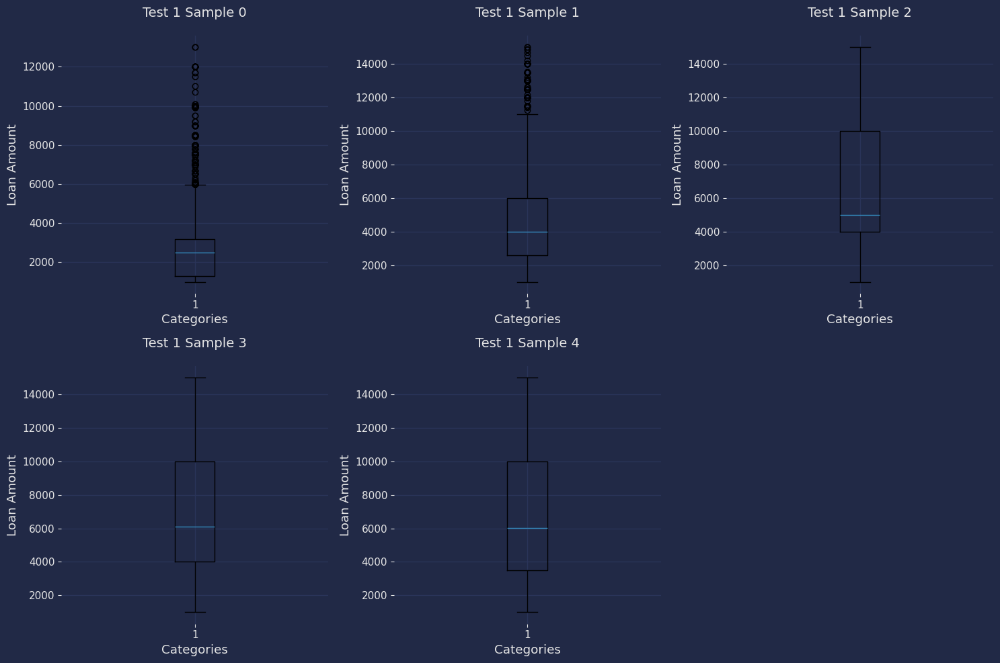

In [16]:
# Box plots for estimating variance and no outliers validation
test_samples = [test_sample_p, test_sample_f, test_sample_g, test_sample_vg, test_sample_e]

fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Flatten the axs array to iterate easily
axs = axs.flatten()

for i, (sample, ax) in enumerate(zip(test_samples, axs)):
    ax.boxplot(sample)
    ax.set_title(f'Test 1 Sample {i}')
    ax.set_ylabel('Loan Amount')
    ax.set_xlabel('Categories')

fig.delaxes(axs[-1])
plt.tight_layout()
plt.show()

In [17]:
# Original groups are being filtered to eliminate outliers
test2_groups = [test_2_poor, test_2_fair, test_2_good, test_2_verygood, test_2_exceptional]
test2_groups_filtered = [list(filter(lambda x: x <= .4, group)) for group in test2_groups]
test2_group_poor, test2_group_fair, test2_group_good, test2_group_verygood, test2_group_exceptional = test2_groups_filtered

An APR for 0.4 was chosen as the cut off. This eliminates noise from outliers while preserving the original deviation. These outliers reflect genuine values and don't disrupt the model's median analysis. The box plot's relationships & median accurately reflect the population.

In [18]:
# Test 2 samples
np.random.seed(23)
test2_sample_p = np.random.choice(test2_group_poor, size=4845)
test2_sample_f = np.random.choice(test2_group_fair, size=4845)
test2_sample_g = np.random.choice(test2_group_good, size=4845)
test2_sample_vg = np.random.choice(test2_group_verygood, size=4845)
test2_sample_e = np.random.choice(test2_group_exceptional, size=4845)

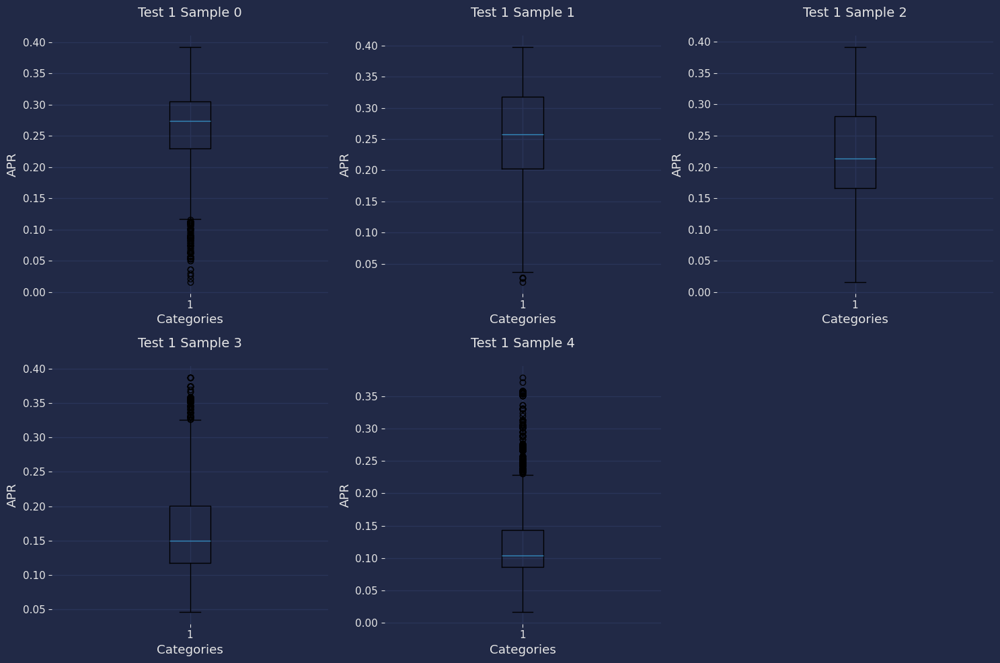

In [19]:
# Box plots for estimating variance and no outliers validation
test2_samples = [test2_sample_p, test2_sample_f, test2_sample_g, test2_sample_vg, test2_sample_e]

fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Flatten the axs array to iterate easily
axs = axs.flatten()

for i, (sample, ax) in enumerate(zip(test2_samples, axs)):
    ax.boxplot(sample)
    ax.set_title(f'Test 1 Sample {i}')
    ax.set_ylabel('APR')
    ax.set_xlabel('Categories')

fig.delaxes(axs[-1])
plt.tight_layout()
plt.show()

### Equal Variances Testing
To confirm the requirement of a non-parametric test, the variances of each model set are going to be tested for equality by Levene test. Brown-Forsythe was utilized for it's robustness against non-normality.

In [20]:
statistic_1, p_value_1 = levene(test_sample_p, test_sample_f, test_sample_g, test_sample_vg, test_sample_e, center='median')
print("statistic:", round(statistic_1, 3))
print("p-value:", round(p_value_1, 10))

if p_value_1 > alpha:
    print("Variances are not significantly different.")
else:
    print("Variances are significantly different.")

statistic: 862.677
p-value: 0.0
Variances are significantly different.


In [21]:
statistic_2, p_value_2 = levene(test2_sample_p, test2_sample_f, test2_sample_g, test2_sample_vg, test2_sample_e, center='median')
print("statistic:", round(statistic_2, 3))
print("p-value:", round(p_value_2, 10))

if p_value_2 > alpha:
    print("Variances are not significantly different.")
else:
    print("Variances are significantly different.")

statistic: 222.221
p-value: 0.0
Variances are significantly different.


This is confirmation of non-homoscedastic groups. Invalidates the option to run ANOVA tests. 
### Test 1 - Kursal Wallis

In [22]:
statistic, p_value = kruskal(test_sample_p, test_sample_f, test_sample_g, test_sample_vg, test_sample_e)
print("statistic:", round(statistic, 3))
print("P-value:", round(p_value, 2))

if p_value <= alpha:
    print("Reject the null hypothesis. There is a significant difference between at least two group medians.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference between group medians.")

statistic: 5526.157
P-value: 0.0
Reject the null hypothesis. There is a significant difference between at least two group medians.


### Results
The results indicate further testing with a Post Hoc test since there is statistical signficance detected. 
### Test 2 - Kursal Wallis

In [23]:
statistic, p_value = kruskal(test2_sample_p, test2_sample_f, test2_sample_g, test2_sample_vg, test2_sample_e)
print("statistic:", round(statistic, 3))
print("P-value:", round(p_value, 2))

if p_value <= alpha:
    print("Reject the null hypothesis. There is a significant difference between at least two group medians.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference between group medians.")

statistic: 10468.13
P-value: 0.0
Reject the null hypothesis. There is a significant difference between at least two group medians.


### Results
The results indicate further testing with a Post Hoc test since there is statistical signficance detected. Credit Rating by APR is quoted as having the more intense relationships from the higher statistic value in Test 2 compared to Test 1.
### Checking for similar distributions to determine between Dunn's and Conover Iman Tests

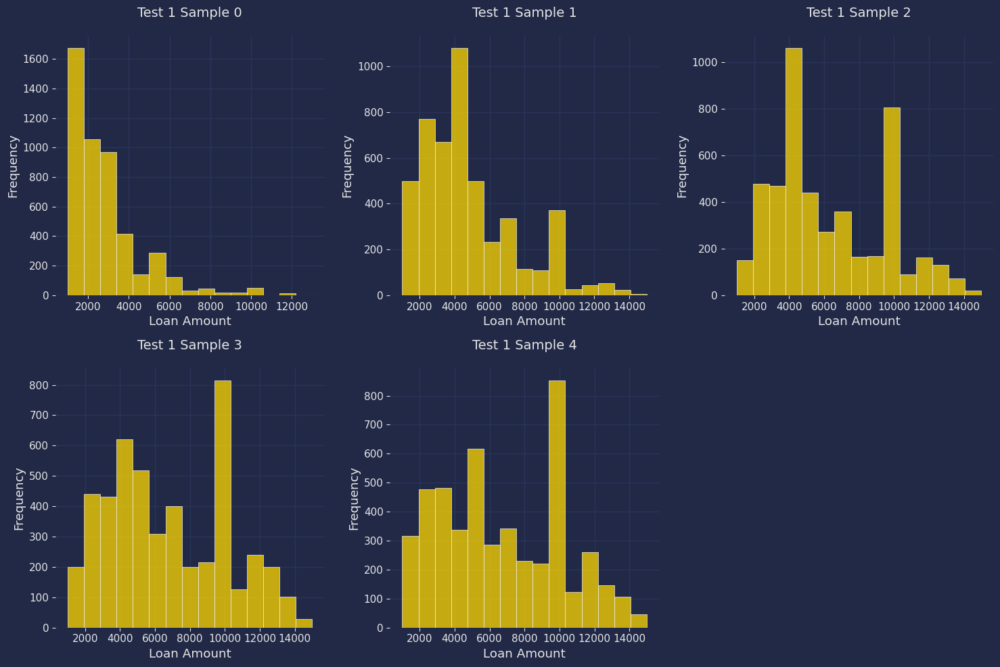

In [24]:
# Test 1 sample distributions
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Flatten the axs array to iterate easily
axs = axs.flatten()

for i, (sample, ax) in enumerate(zip(test_samples, axs)):
    sns.histplot(data=sample, ax=ax, color='gold', bins=15)
    ax.set_title(f'Test 1 Sample {i}')
    ax.set_ylabel('Frequency')
    ax.set_xlabel('Loan Amount')

fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()

## Test 1 - Dunn Tests
The above histrogram samples are all asymetrical, unimodal, and right-skewed. Double peak is seen in 4 of the plots. These attributes enable Dunn Tests for improved accuracy.

In [25]:
dunn_results = posthoc_dunn(test_samples, p_adjust='holm')
dunn_results <= .05

,1,2,3,4,5
1,False,True,True,True,True
2,True,False,True,True,True
3,True,True,False,True,True
4,True,True,True,False,False
5,True,True,True,False,False


### Results
The comparison for Very Good between Exceptional Credit Rating don't report statistical significance - indicated by the "False" in col 4 row 5. This is unsurprising given similarities in spread, center, and shape in box plots and histograms.

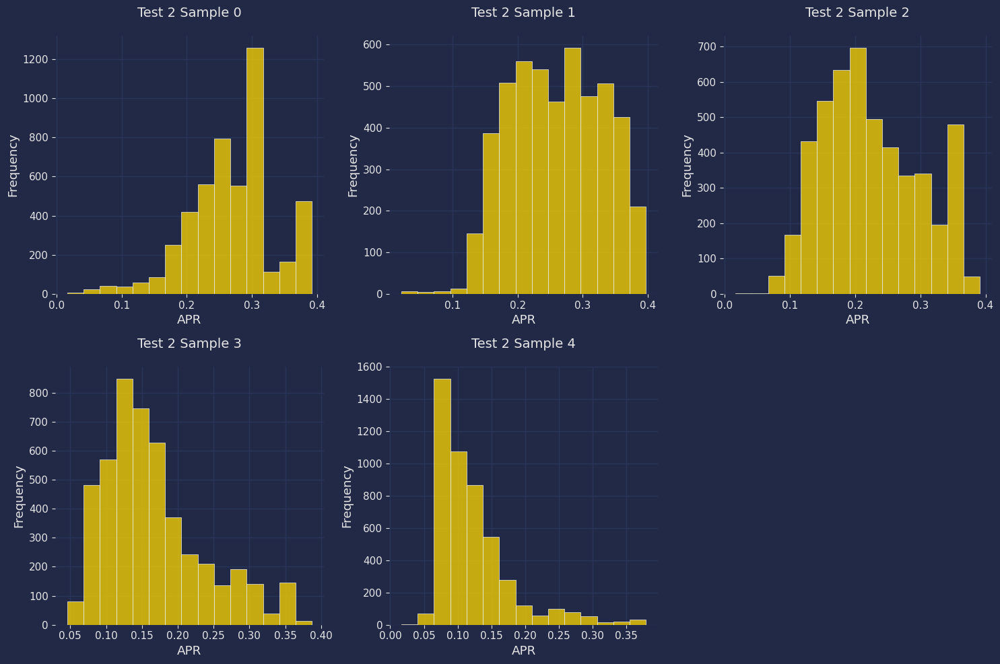

In [26]:
# Test 2 sample distributions
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Flatten the axs array to iterate easily
axs = axs.flatten()

for i, (sample, ax) in enumerate(zip(test2_samples, axs)):
    sns.histplot(data=sample, ax=ax, color='gold', bins=15)
    ax.set_title(f'Test 2 Sample {i}')
    ax.set_ylabel('Frequency')
    ax.set_xlabel('APR')

fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()

## Test 2 - Conover-Iman Tests
The above histogram samples have varying skews, peaks, and symmetry levels. These attributes deviate from each other too much for Dunn Tests.

In [27]:
conover_results = posthoc_conover(test2_samples, p_adjust='holm')
conover_results <= .05

,1,2,3,4,5
1,False,True,True,True,True
2,True,False,True,True,True
3,True,True,False,True,True
4,True,True,True,False,True
5,True,True,True,True,False


### Results
The tests report statistical significance between all the Credit Rating values. This is expected due to how finanical institutions use credit score to determine applicant approval worthiness and allot the subsequent loan conditions.
## Research Question 1: Income Range Statistic Model

In [28]:
# Test 3: Income Range by Loan Amount
test_3_0 = np.array(anova_df.loc[anova_df['IncomeRange']=='$0', 'LoanOriginalAmount'])
test_3_1 = np.array(anova_df.loc[anova_df['IncomeRange']=='$1-24,999', 'LoanOriginalAmount'])
test_3_25 = np.array(anova_df.loc[anova_df['IncomeRange']=='$25,000-49,999', 'LoanOriginalAmount'])
test_3_50 = np.array(anova_df.loc[anova_df['IncomeRange']=='$50,000-74,999', 'LoanOriginalAmount'])
test_3_75 = np.array(anova_df.loc[anova_df['IncomeRange']=='$75,000-99,999', 'LoanOriginalAmount'])
test_3_100 = np.array(anova_df.loc[anova_df['IncomeRange']=='$100,000+', 'LoanOriginalAmount'])

# Test 4: Income Range by APR
test_4_0 = np.array(anova_df.loc[anova_df['IncomeRange']=='$0', 'BorrowerAPR'])
test_4_1 = np.array(anova_df.loc[anova_df['IncomeRange']=='$1-24,999', 'BorrowerAPR'])
test_4_25 = np.array(anova_df.loc[anova_df['IncomeRange']=='$25,000-49,999', 'BorrowerAPR'])
test_4_50 = np.array(anova_df.loc[anova_df['IncomeRange']=='$50,000-74,999', 'BorrowerAPR'])
test_4_75 = np.array(anova_df.loc[anova_df['IncomeRange']=='$75,000-99,999', 'BorrowerAPR'])
test_4_100 = np.array(anova_df.loc[anova_df['IncomeRange']=='$100,000+', 'BorrowerAPR'])

### Time to evaluate for normal distribution of dependent variables (Loan Amount & APR)

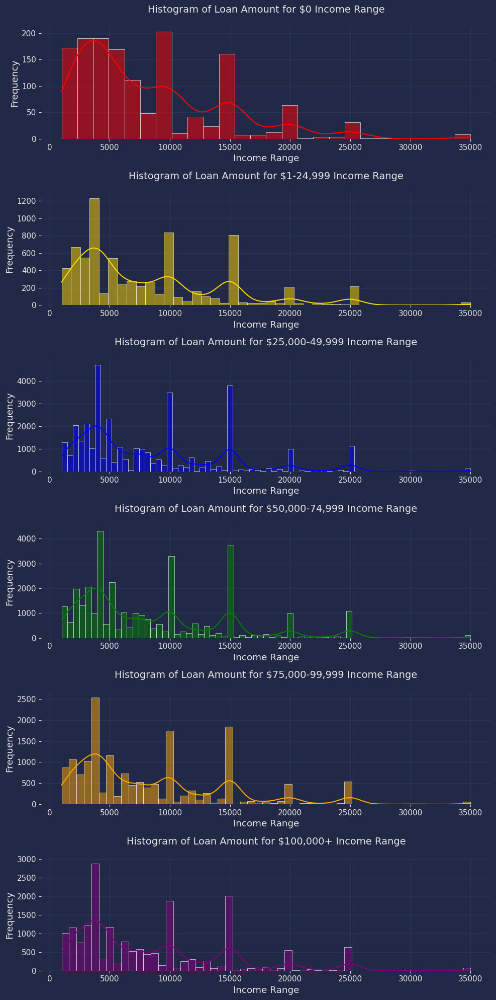

In [29]:
# initializing bins
bins_0 = np.histogram_bin_edges(test_3_0, bins='auto')
bins_1 = np.histogram_bin_edges(test_3_1, bins='auto')
bins_25 = np.histogram_bin_edges(test_3_25, bins='auto')
bins_50 = np.histogram_bin_edges(test_3_50, bins='auto')
bins_75 = np.histogram_bin_edges(test_3_75, bins='auto')
bins_100 = np.histogram_bin_edges(test_3_100, bins='auto')

fig, axs = plt.subplots(6, 1, figsize=(10, 20))

# Plot histograms for Test 3
sns.histplot(test_3_0, color='red', alpha=0.5, bins=bins_0, kde=True, ax=axs[0])
axs[0].set_title('Histogram of Loan Amount for $0 Income Range')
axs[0].set_xlabel('Income Range')
axs[0].set_ylabel('Frequency')

sns.histplot(test_3_1, color='gold', alpha=0.5, bins=bins_1, kde=True, ax=axs[1])
axs[1].set_title('Histogram of Loan Amount for $1-24,999 Income Range')
axs[1].set_xlabel('Income Range')
axs[1].set_ylabel('Frequency')

sns.histplot(test_3_25, color='blue', alpha=0.5, bins=bins_25, kde=True, ax=axs[2])
axs[2].set_title('Histogram of Loan Amount for $25,000-49,999 Income Range')
axs[2].set_xlabel('Income Range')
axs[2].set_ylabel('Frequency')

sns.histplot(test_3_50, color='green', alpha=0.5, bins=bins_50, kde=True, ax=axs[3])
axs[3].set_title('Histogram of Loan Amount for $50,000-74,999 Income Range')
axs[3].set_xlabel('Income Range')
axs[3].set_ylabel('Frequency')

sns.histplot(test_3_75, color='orange', alpha=0.5, bins=bins_75, kde=True, ax=axs[4])
axs[4].set_title('Histogram of Loan Amount for $75,000-99,999 Income Range')
axs[4].set_xlabel('Income Range')
axs[4].set_ylabel('Frequency')

sns.histplot(test_3_100, color='purple', alpha=0.5, bins=bins_100, kde=True, ax=axs[5])
axs[5].set_title('Histogram of Loan Amount for $100,000+ Income Range')
axs[5].set_xlabel('Income Range')
axs[5].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

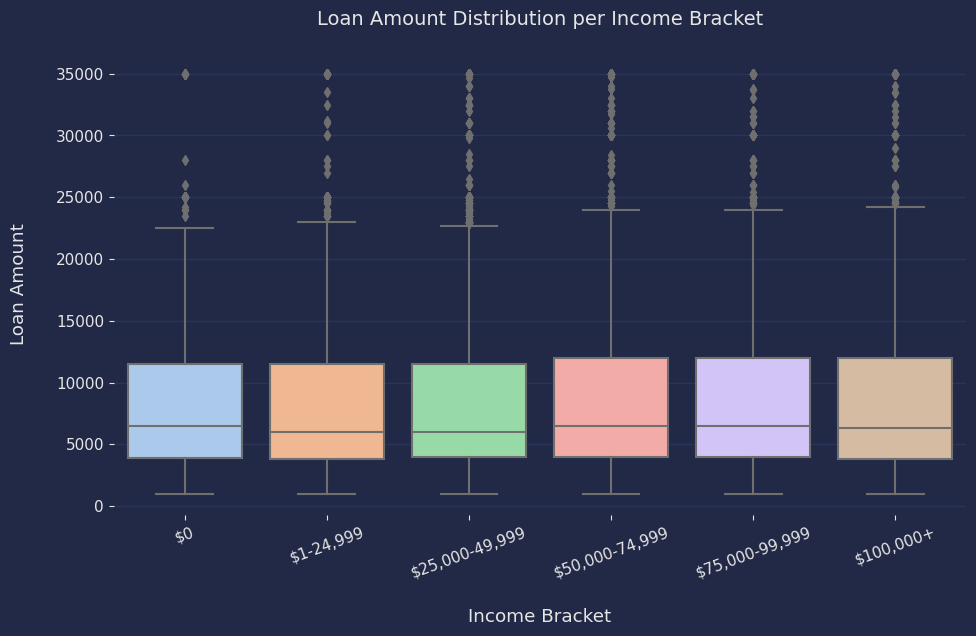

In [30]:
plt.figure(figsize=(11,6))
sns.boxplot(data=anova_df, x='IncomeRange', y='LoanOriginalAmount', palette='pastel')
plt.xticks(rotation=20)
plt.title('Loan Amount Distribution per Income Bracket')
plt.xlabel('Income Bracket', labelpad=20)
plt.ylabel('Loan Amount', labelpad=20)
plt.show()

These distributions are positively skewed and muli-modial which indicates ANOVA testing can't be used - from the bottom side median and top side outliers then shape & spread of histrograms.

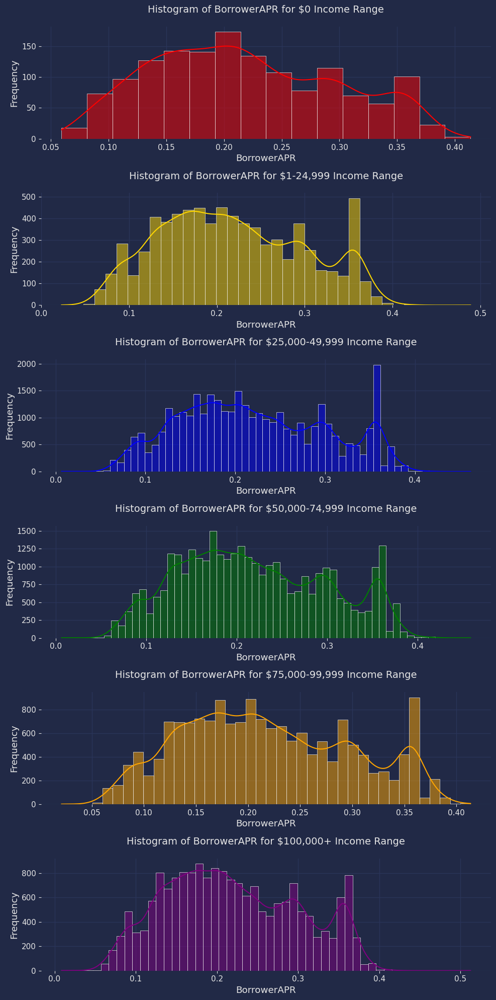

In [31]:
# initializing bins
bins_0 = np.histogram_bin_edges(test_4_0, bins='auto')
bins_1 = np.histogram_bin_edges(test_4_1, bins='auto')
bins_25 = np.histogram_bin_edges(test_4_25, bins='auto')
bins_50 = np.histogram_bin_edges(test_4_50, bins='auto')
bins_75 = np.histogram_bin_edges(test_4_75, bins='auto')
bins_100 = np.histogram_bin_edges(test_4_100, bins='auto')

fig, axs = plt.subplots(6, 1, figsize=(10, 20))

# Plot histograms for Test 4
sns.histplot(test_4_0, color='red', alpha=0.5, bins=bins_0, kde=True, ax=axs[0])
axs[0].set_title('Histogram of BorrowerAPR for $0 Income Range')
axs[0].set_xlabel('BorrowerAPR')
axs[0].set_ylabel('Frequency')

sns.histplot(test_4_1, color='gold', alpha=0.5, bins=bins_1, kde=True, ax=axs[1])
axs[1].set_title('Histogram of BorrowerAPR for $1-24,999 Income Range')
axs[1].set_xlabel('BorrowerAPR')
axs[1].set_ylabel('Frequency')

sns.histplot(test_4_25, color='blue', alpha=0.5, bins=bins_25, kde=True, ax=axs[2])
axs[2].set_title('Histogram of BorrowerAPR for $25,000-49,999 Income Range')
axs[2].set_xlabel('BorrowerAPR')
axs[2].set_ylabel('Frequency')

sns.histplot(test_4_50, color='green', alpha=0.5, bins=bins_50, kde=True, ax=axs[3])
axs[3].set_title('Histogram of BorrowerAPR for $50,000-74,999 Income Range')
axs[3].set_xlabel('BorrowerAPR')
axs[3].set_ylabel('Frequency')

sns.histplot(test_4_75, color='orange', alpha=0.5, bins=bins_75, kde=True, ax=axs[4])
axs[4].set_title('Histogram of BorrowerAPR for $75,000-99,999 Income Range')
axs[4].set_xlabel('BorrowerAPR')
axs[4].set_ylabel('Frequency')

sns.histplot(test_4_100, color='purple', alpha=0.5, bins=bins_100, kde=True, ax=axs[5])
axs[5].set_title('Histogram of BorrowerAPR for $100,000+ Income Range')
axs[5].set_xlabel('BorrowerAPR')
axs[5].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

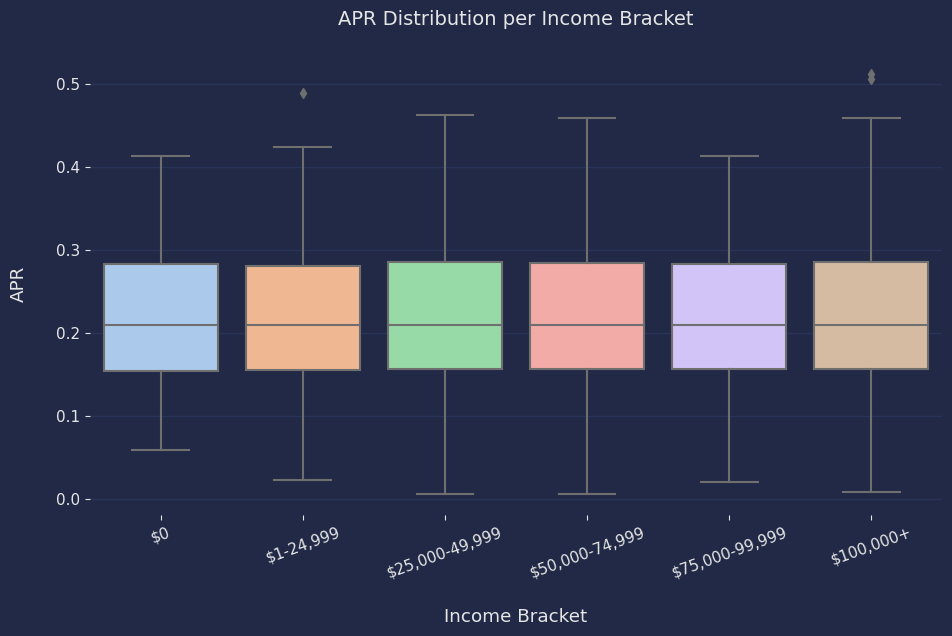

In [32]:
plt.figure(figsize=(11,6))
sns.boxplot(data=anova_df, x='IncomeRange', y='BorrowerAPR', palette='pastel')
plt.xticks(rotation=20)
plt.title('APR Distribution per Income Bracket')
plt.xlabel('Income Bracket', labelpad=20)
plt.ylabel('APR', labelpad=20)
plt.show()

These distributions are approximately normal, deviations are the .35 peaks, slight negative-skew, and the too gradual of a decline down the curve. Given my large n size of 1450, ANOVA could be robust enough against this degree of non-normality. Shapiro Wilk test will be performed to confirm.

### Creating Test 3 & 4 Samples for Statistical Modelling

In [33]:
# Since IncomeRange isn't depdenent on Amount/APR, tests 3 and 4 have groups of equal size
print('Sizes (N) of Loan Amount/APR by Income Range')
print('$0:', len(test_3_0))
print('$1-24,999:', len(test_3_1))
print('$25,000-49,999:', len(test_3_25))
print('$50,000-74,999:', len(test_3_50))
print('$75,000-99,999:', len(test_3_75))
print('$100,000+:', len(test_3_100), '\n')

Sizes (N) of Loan Amount/APR by Income Range
$0: 1459
$1-24,999: 7511
$25,000-49,999: 35212
$50,000-74,999: 33466
$75,000-99,999: 16910
$100,000+: 18508 



In [34]:
# Original groups are being filtered to eliminate outliers
test3_groups = [test_3_0, test_3_1, test_3_25, test_3_50, test_3_75, test_3_100]
test3_groups_filtered = [list(filter(lambda x: x <= 18000, group)) for group in test3_groups]
test3_group_0, test3_group_1, test3_group_25, test3_group_50, test3_group_75, test3_group_100 = test3_groups_filtered

In [35]:
# Test 3 samples
np.random.seed(14)
test3_sample_0 = np.random.choice(test3_group_0, size=1455)
test3_sample_1 = np.random.choice(test3_group_1, size=1455)
test3_sample_25 = np.random.choice(test3_group_25, size=1455)
test3_sample_50 = np.random.choice(test3_group_50, size=1455)
test3_sample_75 = np.random.choice(test3_group_75, size=1455)
test3_sample_100 = np.random.choice(test3_group_100, size=1455)

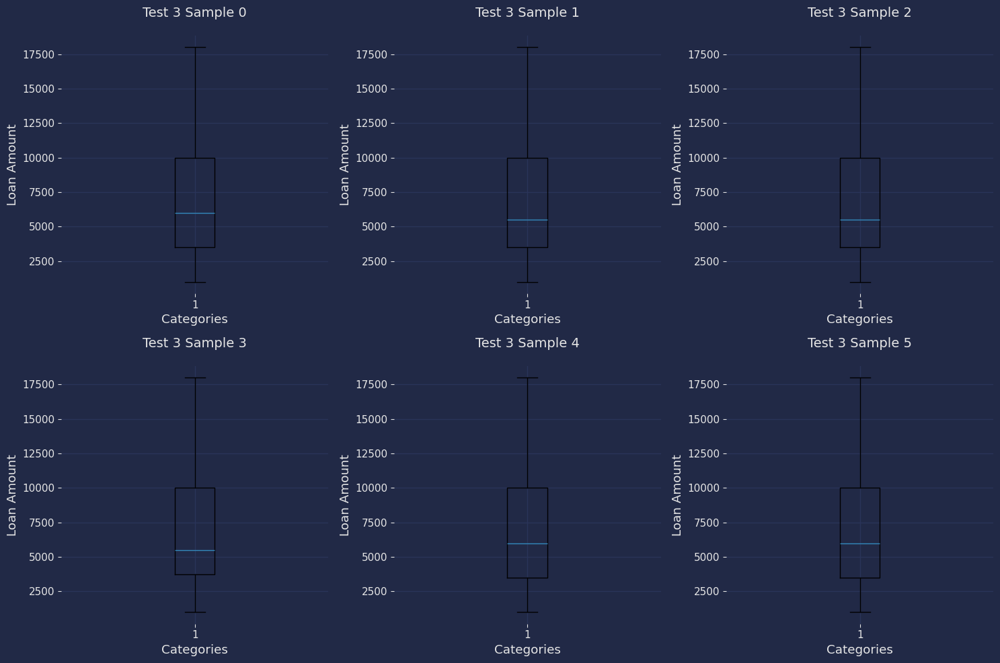

In [36]:
# Box plots for estimating variance and no outliers validation
test3_samples = [test3_sample_0, test3_sample_1, test3_sample_25, test3_sample_50, test3_sample_75, test3_sample_100]

fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Flatten the axs array to iterate easily
axs = axs.flatten()

for i, (sample, ax) in enumerate(zip(test3_samples, axs)):
    ax.boxplot(sample)
    ax.set_title(f'Test 3 Sample {i}')
    ax.set_ylabel('Loan Amount')
    ax.set_xlabel('Categories')

plt.tight_layout()
plt.show()

In [37]:
# Test 4 samples
np.random.seed(7)
test4_sample_0 = np.random.choice(test_4_0, size=1455)
test4_sample_1 = np.random.choice(test_4_1, size=1455)
test4_sample_25 = np.random.choice(test_4_25, size=1455)
test4_sample_50 = np.random.choice(test_4_50, size=1455)
test4_sample_75 = np.random.choice(test_4_75, size=1455)
test4_sample_100 = np.random.choice(test_4_100, size=1455)

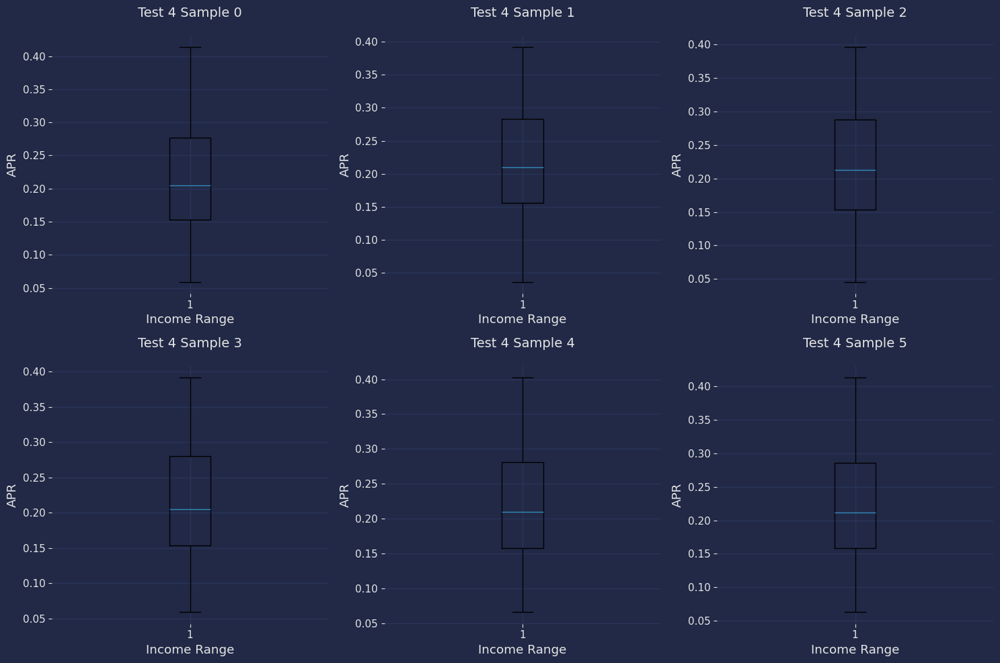

In [38]:
# Box plots for estimating variance and no outliers validation
test4_samples = [test4_sample_0, test4_sample_1, test4_sample_25, test4_sample_50, test4_sample_75, test4_sample_100]

fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Flatten the axs array to iterate over it easily
axs = axs.flatten()

for i, (sample, ax) in enumerate(zip(test4_samples, axs)):
    ax.boxplot(sample)
    ax.set_title(f'Test 4 Sample {i}')
    ax.set_ylabel('APR')
    ax.set_xlabel('Income Range')

plt.tight_layout()
plt.show()

### Equal Variances Testing
To confirm the requirement of a non-parametric test, the variances of each model set are going to be tested for equality by Levene test. Brown-Forsythe was trialed by using "center=median" parameter in Levene, but the p-value remained the same since distribution didn't significantly deviate from Guassian in both tests.

In [39]:
statistic_3, p_value_3 = levene(test3_sample_0, test3_sample_1, test3_sample_25, test3_sample_50, test3_sample_75, test3_sample_100)
print("statistic:", round(statistic_3, 3))
print("p-value:", round(p_value_3, 10))

# Interpret the result
if p_value_3 > alpha:
    print("Variances are not significantly different.")
else:
    print("Variances are significantly different.")

statistic: 0.385
p-value: 0.8590792549
Variances are not significantly different.


In [40]:
statistic_4, p_value_4 = levene(test4_sample_0, test4_sample_1, test4_sample_25, test4_sample_50, test4_sample_75, test4_sample_100)
print("statistic:", round(statistic_4, 3))
print("p-value:", round(p_value_4, 10))

# Interpret the result
if p_value_4 > alpha:
    print("Variances are not significantly different.")
else:
    print("Variances are significantly different.")

statistic: 0.577
p-value: 0.7174668216
Variances are not significantly different.


This is confirmation of homoscedastic groups. My Kurksal-Willis for test 3 will have increased accuracy and reliability. Validates the final condition to attempt an ANOVA in test 4. 
### Test 3 - Kurksal Wallis

In [41]:
statistic, p_value = kruskal(test3_sample_0, test3_sample_1, test3_sample_25, test3_sample_50, test3_sample_75, test3_sample_100)
print("statistic:", round(statistic, 3))
print("P-value:", round(p_value, 2))

if p_value <= alpha:
    print("Reject the null hypothesis. There is a significant difference between at least two group medians.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference between group medians.")

statistic: 1.56
P-value: 0.91
Fail to reject the null hypothesis. There is no significant difference between group medians.


### Results
The results indicate further testing with a Post Hoc isn't required since there is no signficance detected. This test clarifies that Income Range isn't considered in the decision-making at Prosper when approving a loan amount for a new applicant.
### Test 4 - Kurksal Wallis & ANOVA

In [42]:
# Perform Shapiro-Wilk test for each sample
shapiro_results = []
for sample in [test4_sample_0, test4_sample_1, test4_sample_25, test4_sample_50, test4_sample_75, test4_sample_100]:
    statistic, p_value = stats.shapiro(sample)
    shapiro_results.append((statistic, p_value))

# Print Shapiro-Wilk test results for each sample
for i, (statistic, p_value) in enumerate(shapiro_results):
    print(f"Shapiro-Wilk Test Result for sample {i}:")
    print("Test Statistic:", round(statistic, 3))
    print("p-value:", round(p_value, 3))
    if p_value <= alpha:
        print("Reject the null hypothesis. The sample does not follow a normal distribution.\n")
    else:
        print("Fail to reject the null hypothesis. The sample follows a normal distribution.\n")

Shapiro-Wilk Test Result for sample 0:
Test Statistic: 0.969
p-value: 0.0
Reject the null hypothesis. The sample does not follow a normal distribution.

Shapiro-Wilk Test Result for sample 1:
Test Statistic: 0.972
p-value: 0.0
Reject the null hypothesis. The sample does not follow a normal distribution.

Shapiro-Wilk Test Result for sample 2:
Test Statistic: 0.971
p-value: 0.0
Reject the null hypothesis. The sample does not follow a normal distribution.

Shapiro-Wilk Test Result for sample 3:
Test Statistic: 0.971
p-value: 0.0
Reject the null hypothesis. The sample does not follow a normal distribution.

Shapiro-Wilk Test Result for sample 4:
Test Statistic: 0.97
p-value: 0.0
Reject the null hypothesis. The sample does not follow a normal distribution.

Shapiro-Wilk Test Result for sample 5:
Test Statistic: 0.971
p-value: 0.0
Reject the null hypothesis. The sample does not follow a normal distribution.



Shapiro Wilk returns that each sample isn't normally distributed, which makes sense because they're approximately. I'm running an ANOVA as well because the large n size should counterbalance the non-normality deviations.

In [43]:
# Kruskal Willis
f_statistic, p_value = kruskal(test4_sample_0, test4_sample_1, test4_sample_25, test4_sample_50, test4_sample_75, test4_sample_100)
print("statistic:", round(f_statistic, 3))
print(round(p_value, 2))

if p_value <= alpha:
    print("Reject the null hypothesis. There is a significant difference between at least two group means.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference between group means.")

statistic: 6.692
0.24
Fail to reject the null hypothesis. There is no significant difference between group means.


In [44]:
# ANOVA
f_statistic, p_value = f_oneway(test4_sample_0, test4_sample_1, test4_sample_25, test4_sample_50, test4_sample_75, test4_sample_100)
print("statistic:", round(f_statistic, 3))
print(round(p_value, 2))

if p_value <= alpha:
    print("Reject the null hypothesis. There is a significant difference between at least two group means.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference between group means.")

statistic: 1.239
0.29
Fail to reject the null hypothesis. There is no significant difference between group means.


### Results
The similar results indicate further testing with a Post Hoc isn't required since there is no signficance detected. These 2 tests clarifies that Income Range isn't considered in the decision-making at Prosper when assigning an approved loan applicant their APR.

## Research Question 2:
Can loan outcomes be predicted for new customers who apply?
### Table preparation

In [45]:
mega_df.drop('Unnamed: 0', axis=1, inplace=True)

In [46]:
mega_df.loc[:, 'CreditScore'] = round((mega_df.loc[:, 'CreditScoreRangeUpper']+mega_df.loc[:, 'CreditScoreRangeLower'])/2, 0)

These are many inputs compared to models in other research studies. To reduce noise, I'll be joining the 2 Credit Score attributes into a single attribute using a derived variable technique. Applicants submit their request with a specified amount and Prosper designates an APR and Rate during this process, which means that these conditions can be used for the model since it's accessible before approval. Secondly, non-relevant features drop: Occupation, PK, LoanNumber, EmploymentStatusDuration, and Term (ruins density with little reward). 

In [47]:
mega_df.drop(['CreditScoreRangeUpper', 'CreditScoreRangeLower', 'Occupation', 'PK', 'Term', 'LoanNumber',
              'EmploymentStatusDuration'], axis=1, inplace=True)

In [48]:
# Removing the mean imputes made in part 1. I don't want these imputes affecting my model and am opting for a sample
# instead of population with imputes
# comparing these sizes to the original nulls of customer_df to drop from mega_df
print(mega_df.query('DebtToIncomeRatio == 0.2760324776755837').shape)
print(mega_df.query('TotalTrades == 23.221517787759897').shape)
print(mega_df.query('ProsperScore == 5.952870853278084').shape)

(8472, 19)
(7544, 19)
(29084, 19)


In [49]:
# dropping from mega_df
condition1 = mega_df['DebtToIncomeRatio'] == 0.2760324776755837
condition2 = mega_df['TotalTrades'] == 23.221517787759897
condition3 = mega_df['ProsperScore'] == 5.952870853278084

filtered_df = mega_df.query('~(DebtToIncomeRatio == 0.2760324776755837 | TotalTrades == 23.221517787759897 | ProsperScore == 5.952870853278084)')


print(filtered_df.shape)

(76768, 19)


Checking densities and unobvious null values (like 'N/A') in categorical features. Also dropping records with unusable LoanStatus values such as current or cancelled - which will be done first since it can affect the other 2 edits mentioned.

In [50]:
categories_to_drop = ['Past Due (1-15 days)', 'Past Due (31-60 days)', 'Past Due (61-90 days)',
                      'Past Due (91-120 days)', 'Past Due (16-30 days)', 'FinalPaymentInProgress',
                      'Past Due (>120 days)', 'Cancelled', 'Current']

filtered_df2 = filtered_df[~filtered_df['LoanStatus'].isin(categories_to_drop)]

# verify the rows are dropped
print(filtered_df2.shape)

(37383, 19)


In [51]:
# taking averages across the classes explored in this research question for export tables
credit_rating = round(anova_df[['LoanOriginalAmount', 'BorrowerAPR', 'CreditScore']].groupby('CreditScore').mean(), 2)
income_range = round(anova_df[['LoanOriginalAmount', 'BorrowerAPR', 'IncomeRange']].groupby('IncomeRange').mean(), 2)

# for part I 
prosper_score = round(filtered_df2[['LoanOriginalAmount', 'BorrowerAPR', 'CurrentDelinquencies', 'AmountDelinquent',
                                   'OpenCreditLines', 'CreditScore', 'ProsperScore', 'DebtToIncomeRatio',
                                   'BankcardUtilization', 'Recommendations']].groupby('ProsperScore').mean(), 2)

In [52]:
# To improve model performance, defaulted & charged off values for Loan Status are merged into a single default value
loanstatus_mask = filtered_df2['LoanStatus'] == 'Chargedoff'
filtered_df2.loc[loanstatus_mask, 'LoanStatus'] = 'Defaulted'

In [53]:
# Used for identifying a scaling option
filtered_df2.describe()

,BorrowerAPR,BorrowerRate,ListingCategory (numeric),LoanOriginalAmount,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,BankcardUtilization,ProsperScore,TotalTrades,DebtToIncomeRatio,IncomeVerifiable,Recommendations,CreditScore
count,37383.000,37383.000,37383.000,37383.000,37383.000,37383.000,37383.000,37383.000,37383.000,37383.000,37383.000,37383.000,37383.000,37383.00,37383.000,37383.000
mean,0.222,0.200,2.407,6258.513,8.474,25.395,7.117,0.889,1041.338,0.535,6.054,24.226,0.260,1.00,0.016,682.173
std,0.088,0.081,3.404,5214.834,4.640,14.165,8.221,2.498,5907.831,0.326,2.356,11.686,0.329,0.02,0.153,81.341
min,0.007,0.000,0.000,1000.000,0.000,2.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,0.00,0.000,10.000
25%,0.150,0.135,0.000,2600.000,5.000,15.000,2.000,0.000,0.000,0.270,4.000,16.000,0.150,1.00,0.000,650.000
50%,0.214,0.194,1.000,4500.000,9.000,24.000,5.000,0.000,0.000,0.561,6.000,23.000,0.220,1.00,0.000,690.000
75%,0.295,0.270,3.000,8000.000,10.000,34.000,9.000,1.000,475.000,0.810,8.000,31.000,0.320,1.00,0.000,730.000
max,0.512,0.497,20.000,35000.000,48.000,129.000,379.000,64.000,327677.000,5.830,11.000,122.000,10.010,1.00,9.000,890.000


In [54]:
# Credit Score has a high standard deviation. This is done to reduce noise and bolster signal in models
filtered_df2 = credit_rates(filtered_df2)
filtered_df2['CreditScore'] = filtered_df2['CreditScore'].astype(credit_ratings)

In [55]:
categoricals = ['LoanStatus', 'IncomeRange', 'ListingCategory', 'ProsperScore', 'EmploymentStatus', 'IncomeVerifiable',
                'Recommendations', 'CreditScore']
def print_value_counts(df, categorical_features):
    for feature in categorical_features:
        print(f"Value counts for {feature}:")
        print(df[feature].value_counts())
        print("="*50)  # Adding separator for better readability

filtered_df2.rename(columns={'ListingCategory (numeric)':'ListingCategory'}, inplace=True)
print_value_counts(filtered_df2, categoricals)

Value counts for LoanStatus:
LoanStatus
Completed    25875
Defaulted    11508
Name: count, dtype: int64
Value counts for IncomeRange:
IncomeRange
$50,000-74,999    11621
$25,000-49,999    10587
$100,000+          6716
$75,000-99,999     6607
$1-24,999          1852
Name: count, dtype: int64
Value counts for ListingCategory:
ListingCategory
1     12138
0     11508
7      4107
3      2897
2      2197
4      1626
6      1028
5       493
13      403
15      242
19      147
18      142
14      127
20      121
16       55
11       42
10       35
8        28
9        23
12       13
17       11
Name: count, dtype: int64
Value counts for ProsperScore:
ProsperScore
8.0     5577
6.0     5424
4.0     5371
7.0     4829
5.0     4299
3.0     3186
9.0     3138
2.0     2342
10.0    2227
11.0     663
1.0      327
Name: count, dtype: int64
Value counts for EmploymentStatus:
EmploymentStatus
Employed         31787
Full-time         3643
Other             1697
Retired            153
Part-time           90


In [56]:
# from the mega_table record drops
filtered_df2.reset_index(inplace=True, drop=True)

In [57]:
# Sampling 80% of my model for training & evaluation, 20% for test
training_df = filtered_df2.sample(frac=.8, replace=False)

In [58]:
# Checking densities of each category
print_value_counts(training_df, categoricals)

Value counts for LoanStatus:
LoanStatus
Completed    20620
Defaulted     9286
Name: count, dtype: int64
Value counts for IncomeRange:
IncomeRange
$50,000-74,999    9263
$25,000-49,999    8477
$100,000+         5393
$75,000-99,999    5313
$1-24,999         1460
Name: count, dtype: int64
Value counts for ListingCategory:
ListingCategory
1     9683
0     9163
7     3275
3     2364
2     1768
4     1290
6      828
5      401
13     326
15     196
18     121
19     118
14     100
20      99
16      45
11      35
10      31
8       24
9       19
12      11
17       9
Name: count, dtype: int64
Value counts for ProsperScore:
ProsperScore
8.0     4443
6.0     4349
4.0     4311
7.0     3868
5.0     3419
3.0     2558
9.0     2527
2.0     1863
10.0    1776
11.0     536
1.0      256
Name: count, dtype: int64
Value counts for EmploymentStatus:
EmploymentStatus
Employed         25433
Full-time         2943
Other             1342
Retired            116
Part-time           64
Self-employed        8
Nam

In [59]:
# removing sample records from filtered_table/training_df to instantiate test table
train_index = training_df.index
train_mask = filtered_df2.index.isin(train_index)
filtered_df2 = filtered_df2[~train_mask]
print('Training sample:', training_df.shape)

Training sample: (29906, 19)


In [60]:
test_df = filtered_df2.copy()
print('Test 1 sample:', test_df.shape)

Test 1 sample: (7477, 19)


In [61]:
training_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29906 entries, 33380 to 3734
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   LoanStatus                  29906 non-null  object  
 1   BorrowerAPR                 29906 non-null  float64 
 2   BorrowerRate                29906 non-null  float64 
 3   ListingCategory             29906 non-null  int64   
 4   LoanOriginalAmount          29906 non-null  int64   
 5   OpenCreditLines             29906 non-null  float64 
 6   TotalCreditLinespast7years  29906 non-null  float64 
 7   TotalInquiries              29906 non-null  float64 
 8   CurrentDelinquencies        29906 non-null  float64 
 9   AmountDelinquent            29906 non-null  float64 
 10  BankcardUtilization         29906 non-null  float64 
 11  ProsperScore                29906 non-null  float64 
 12  EmploymentStatus            29906 non-null  object  
 13  TotalTrades       

### Standardizing non-categorical quantitative attributes
RobustScaler is used since there are extreme outliers contained in these datasets. Function auto-scales for each feature. Use the above .describe() 

In [62]:
training_df.columns

Index(['LoanStatus', 'BorrowerAPR', 'BorrowerRate', 'ListingCategory',
       'LoanOriginalAmount', 'OpenCreditLines', 'TotalCreditLinespast7years',
       'TotalInquiries', 'CurrentDelinquencies', 'AmountDelinquent',
       'BankcardUtilization', 'ProsperScore', 'EmploymentStatus',
       'TotalTrades', 'DebtToIncomeRatio', 'IncomeRange', 'IncomeVerifiable',
       'Recommendations', 'CreditScore'],
      dtype='object')

In [63]:
numeric_columns = ['BorrowerAPR', 'BorrowerRate', 'LoanOriginalAmount', 'OpenCreditLines', 'TotalCreditLinespast7years', 'TotalInquiries', 'CurrentDelinquencies',
                   'AmountDelinquent', 'BankcardUtilization', 'ProsperScore',  'TotalTrades', 'DebtToIncomeRatio', 'Recommendations']

def standardize(df):
    df2 = df.copy(deep=True)
    RS = RobustScaler()
    scale = RS.fit_transform(df[numeric_columns])
    for c, col in enumerate(numeric_columns):
        df2[col] = scale[:, c]
    return df2

training_df = standardize(training_df)
test_df = standardize(test_df)

### Encoding qualitative attributes

In [64]:
def OE_encode(df, col):
    OE = OrdinalEncoder(dtype=int)
    income_labels = np.array(df[col].values)
    income_labels_reshaped = income_labels.reshape(-1, 1)
    income_transform = OE.fit_transform(income_labels_reshaped)
    encoded_income_df = np.array(income_transform)
    return encoded_income_df

training_income = OE_encode(training_df, 'IncomeRange')
test_income = OE_encode(test_df, 'IncomeRange')
test_credit = OE_encode(test_df, 'CreditScore')
training_credit = OE_encode(training_df, 'CreditScore')

# validating ordinals
print(training_income)
print(training_df.IncomeRange)

print(training_credit)
print(training_df.CreditScore)

[[2]
 [2]
 [2]
 ...
 [0]
 [3]
 [2]]
33380    $25,000-49,999
30124    $25,000-49,999
7464     $25,000-49,999
11856    $25,000-49,999
22923    $50,000-74,999
              ...      
20161    $25,000-49,999
23980         $100,000+
26988         $1-24,999
3020     $50,000-74,999
3734     $25,000-49,999
Name: IncomeRange, Length: 29906, dtype: object
[[1]
 [4]
 [1]
 ...
 [4]
 [4]
 [2]]
33380           Fair
30124      Very Good
7464            Fair
11856    Exceptional
22923      Very Good
            ...     
20161           Fair
23980    Exceptional
26988      Very Good
3020       Very Good
3734            Good
Name: CreditScore, Length: 29906, dtype: category
Categories (5, object): ['Poor' < 'Fair' < 'Good' < 'Very Good' < 'Exceptional']


In [65]:
def col_replacer(df, col, encode):
    df2 = df.copy()
    df2[col] = encode
    return df2

# entering IncomeRange encode into datasets
training_df = col_replacer(training_df, 'IncomeRange', training_income)
test_df = col_replacer(test_df, 'IncomeRange', test_income)
training_df = col_replacer(training_df, 'CreditScore', training_credit)
test_df = col_replacer(test_df, 'CreditScore', test_credit)

In [66]:
def OH_encode(df, column_name):
    encoder = OneHotEncoder(sparse=False, dtype=int)
    data_to_encode = np.array(df[column_name].values.reshape(-1, 1))
    encoded_df = encoder.fit_transform(data_to_encode)
    df[column_name] = encoded_df
    return df

test_df = OH_encode(test_df, 'EmploymentStatus')
training_df = OH_encode(training_df, 'EmploymentStatus')

In [67]:
test_df.columns

Index(['LoanStatus', 'BorrowerAPR', 'BorrowerRate', 'ListingCategory',
       'LoanOriginalAmount', 'OpenCreditLines', 'TotalCreditLinespast7years',
       'TotalInquiries', 'CurrentDelinquencies', 'AmountDelinquent',
       'BankcardUtilization', 'ProsperScore', 'EmploymentStatus',
       'TotalTrades', 'DebtToIncomeRatio', 'IncomeRange', 'IncomeVerifiable',
       'Recommendations', 'CreditScore'],
      dtype='object')

In [68]:
training_df.columns

Index(['LoanStatus', 'BorrowerAPR', 'BorrowerRate', 'ListingCategory',
       'LoanOriginalAmount', 'OpenCreditLines', 'TotalCreditLinespast7years',
       'TotalInquiries', 'CurrentDelinquencies', 'AmountDelinquent',
       'BankcardUtilization', 'ProsperScore', 'EmploymentStatus',
       'TotalTrades', 'DebtToIncomeRatio', 'IncomeRange', 'IncomeVerifiable',
       'Recommendations', 'CreditScore'],
      dtype='object')

The last qualitative feature is Loan Status. This is my y variable - the training set will be encoded with OneHot. Prediction vs Actual sets are compared for effectiveness measure, with the original y-values are in "y_df"

In [69]:
y_df = pd.DataFrame()
y_df['LoanStatus'] = test_df['LoanStatus'].copy()
print('Test df y-values:', y_df.shape)
print('Test df:', test_df.shape)

# no Loan Status feature in the test set
test_df.drop('LoanStatus', axis=1, inplace=True)

Test df y-values: (7477, 1)
Test df: (7477, 19)


In [70]:
y_df.head(2)

,LoanStatus
0,Completed
5,Defaulted


In [71]:
def label_encode(df, column_name):
    label_encoder = LabelEncoder()
    column_data = np.array(df[column_name].values)
    encoded_column = label_encoder.fit_transform(column_data)
    final_df = pd.DataFrame()
    final_df['LoanStatus'] = encoded_column
    return final_df, label_encoder

y, LE = label_encode(training_df, 'LoanStatus')
y.head(3)

,LoanStatus
0,0
1,0
2,1


In [72]:
# removing y from x training set
training_df.drop('LoanStatus', axis=1, inplace=True)
training_df.head(2)

,BorrowerAPR,BorrowerRate,ListingCategory,LoanOriginalAmount,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,BankcardUtilization,ProsperScore,EmploymentStatus,TotalTrades,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,Recommendations,CreditScore
33380,1.189,1.156,1,-0.324,-1.2,-1.000,-0.714,0.0,0.0,0.720,-0.25,1,1.800,0.412,2,1.0,0.0,1
30124,-0.458,-0.445,1,1.302,-0.4,0.474,-0.714,0.0,0.0,-0.724,-0.50,1,-0.067,-1.118,2,1.0,0.0,4


In [73]:
# comparing standard deviations (S) to identify higher risk columns
training_df[['CurrentDelinquencies', 'AmountDelinquent', 'BankcardUtilization', 'OpenCreditLines',
       'TotalCreditLinespast7years', 'LoanOriginalAmount', 'TotalTrades', 'DebtToIncomeRatio',
             'Recommendations', 'TotalInquiries', 'ProsperScore', 'ListingCategory', 'BorrowerRate', 
            'BorrowerAPR']].describe()

,CurrentDelinquencies,AmountDelinquent,BankcardUtilization,OpenCreditLines,TotalCreditLinespast7years,LoanOriginalAmount,TotalTrades,DebtToIncomeRatio,Recommendations,TotalInquiries,ProsperScore,ListingCategory,BorrowerRate,BorrowerAPR
count,29906.000,29906.000,29906.000,29906.000,29906.000,29906.000,29906.000,29906.000,29906.000,29906.000,29906.000,29906.000,29906.000,29906.000
mean,0.889,2.212,-0.046,-0.104,0.076,0.325,0.082,0.238,0.016,0.308,0.014,2.421,0.049,0.056
std,2.515,12.463,0.603,0.931,0.748,0.968,0.780,2.033,0.153,1.203,0.589,3.421,0.603,0.607
min,0.000,0.000,-1.039,-1.800,-1.158,-0.648,-1.467,-1.294,0.000,-0.714,-1.250,0.000,-1.438,-1.429
25%,0.000,0.000,-0.539,-0.800,-0.474,-0.352,-0.467,-0.412,0.000,-0.429,-0.500,0.000,-0.437,-0.444
50%,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000
75%,1.000,1.000,0.461,0.200,0.526,0.648,0.533,0.588,0.000,0.571,0.500,3.000,0.563,0.556
max,64.000,688.759,9.757,7.800,5.526,5.648,6.600,57.588,9.000,53.429,1.250,20.000,1.898,1.703


In [74]:
# Different test versions (X, X2, test_df, test2) for feature selection
X = training_df.copy()

# Risky quantitative features (high S) are dropped. Noise & complexity is further reduced by selecting one
# column to represent a statistic. Ex: instead of TotalCreditLines and OpenCreditLines, the latter is chosen for it's higher relevancy.
# some are dropepd from irrelevenacy even though they have lower S. See BankCardUtilization or TotalTrades
# Listing category snipped since half are 'Not Available' values
X2 = training_df.drop(['BorrowerAPR', 'TotalInquiries', 'BankcardUtilization', 'TotalTrades',
                       'DebtToIncomeRatio', 'ProsperScore', 'TotalCreditLinespast7years', 'AmountDelinquent', 
                      'CurrentDelinquencies', 'ListingCategory'], axis=1).copy()
test2 = test_df.drop(['BorrowerAPR', 'TotalInquiries', 'BankcardUtilization', 'TotalTrades',
                       'DebtToIncomeRatio', 'ProsperScore', 'TotalCreditLinespast7years', 'AmountDelinquent', 
                      'CurrentDelinquencies', 'ListingCategory'], axis=1).copy()

# Aligning row counts for x and y
print(training_df.shape)
print(y.shape)

(29906, 18)
(29906, 1)


In [75]:
X2.columns

Index(['BorrowerRate', 'LoanOriginalAmount', 'OpenCreditLines',
       'EmploymentStatus', 'IncomeRange', 'IncomeVerifiable',
       'Recommendations', 'CreditScore'],
      dtype='object')

## Model Evaluation
Preparation is completed. Various models are trained then tested for effectiveness - measured by accuracy, recall, precision, and F1-score. "y_df" is correct y-values for the testing set. Test set is "test_df" & "test2". Training set split into 2 types, "X" and "y". Stratify=y and average=weighted to accomadate the class imbalance between Completed (5000) and Defaulted (2500). Turning either off resulted in model scoring that gave exact values for all metrics and even some models.

If tuning to find the perfect parameters, use a top-down approach. Start with big intervals and when the bigger interval is found, zoom in and inspect units within that interval. Max_depth= controls how many levels of splits the tree can have from the root node to the leaf nodes - deeper trees can overfit. Random Forest n_estimator= represents the number of base estimators (decision trees) to be aggregated in the ensemble. XGBoost, LightGBM, ADABoost n_estimator= determines the number of boosting stages or iterations. Increases the complexity of the model which can lead to overfitting.

In [76]:
X_train, X_valid, y_train, y_valid = train_test_split(X2, y, train_size=.7, stratify=y, test_size=.3)
y_train = y_train.values.reshape(-1)
y_valid = y_valid.values.reshape(-1)
# the true cross prediction answers
true_preds = LE.inverse_transform(y_valid)
true_eval_c = [item for item in true_preds].count('Completed')
true_eval_d = [item for item in true_preds].count('Defaulted')

### Random Forest

In [77]:
rf_model = RandomForestClassifier(n_estimators=90, max_depth=None, min_samples_split=2, min_samples_leaf=1)

# cross eval
stratified_kfold = StratifiedKFold(n_splits = 5)  
cv_scores_rf = cross_val_score(rf_model, X_train, y_train, cv=stratified_kfold)
predicted = cross_val_predict(rf_model, X_valid, y_valid, cv=stratified_kfold)
print("Cross Validation Scores: ", np.round(cv_scores_rf, 2))  

rf_model.fit(X_train, y_train)
preds_valid = rf_model.predict(X_valid)

Cross Validation Scores:  [0.68 0.68 0.68 0.67 0.68]


In [78]:
avg_cv_rf = np.round(cv_scores_rf.mean(), 2)
print("Average Cross Accuracy: ", avg_cv_rf)  

accuracy_rf = round(accuracy_score(y_valid, preds_valid), 2)
print("Random Forest Accuracy:", accuracy_rf)

precision_rf = round(precision_score(y_valid, preds_valid, average='weighted'), 2)
print("Random Forest Precision:", precision_rf)

recall_rf = round(recall_score(y_valid, preds_valid, average='weighted'), 2)
print("Random Forest Recall:", recall_rf)

f1_rf = round(f1_score(y_valid, preds_valid, average='weighted'), 2)
print("Random Forest F1-Score:", f1_rf)

Average Cross Accuracy:  0.68
Random Forest Accuracy: 0.68
Random Forest Precision: 0.66
Random Forest Recall: 0.68
Random Forest F1-Score: 0.66


In [79]:
# cross eval predictions
cross_preds_rf = LE.inverse_transform(predicted)
cross_c_rf = [item for item in cross_preds_rf].count('Completed')
cross_d_rf = [item for item in cross_preds_rf].count('Defaulted')

# model predictions
eval_preds_rf = LE.inverse_transform(preds_valid)
eval_c_rf = [item for item in eval_preds_rf].count('Completed')
eval_d_rf = [item for item in eval_preds_rf].count('Defaulted')

print('cross results:', [cross_c_rf, cross_d_rf])
print('evaluation results:', [eval_c_rf, eval_d_rf])
print('true answers:', [true_eval_c, true_eval_d])

cross results: [7238, 1734]
evaluation results: [7093, 1879]
true answers: [6186, 2786]


### Decision Tree

In [80]:
# criterion= gini or entropy
dt_model = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1)

# cross eval
cv_scores_dt = cross_val_score(dt_model, X_train, y_train, cv=stratified_kfold)
predicted = cross_val_predict(dt_model, X_valid, y_valid, cv=stratified_kfold)
print("Cross Validation Scores: ", np.round(cv_scores_dt, 2))   

dt_model.fit(X_train, y_train)
preds_valid = dt_model.predict(X_valid)

Cross Validation Scores:  [0.62 0.62 0.63 0.63 0.62]


In [81]:
avg_cv_dt = np.round(cv_scores_dt.mean(), 2)
print("Average Cross Accuracy: ", avg_cv_dt)  

accuracy_dt = round(accuracy_score(y_valid, preds_valid), 2)
print("Decision Tree Accuracy:", accuracy_dt)

precision_dt = round(precision_score(y_valid, preds_valid, average='weighted'), 2)
print("Decision Tree Precision:", precision_dt)

recall_dt = round(recall_score(y_valid, preds_valid, average='weighted'), 2)
print("Decision Tree Recall:", recall_dt)

f1_dt = round(f1_score(y_valid, preds_valid, average='weighted'), 2)
print("Decision Tree F1-Score:", f1_dt)

Average Cross Accuracy:  0.62
Decision Tree Accuracy: 0.61
Decision Tree Precision: 0.61
Decision Tree Recall: 0.61
Decision Tree F1-Score: 0.61


In [82]:
# cross eval predictions
cross_preds_dt = LE.inverse_transform(predicted)
cross_c_dt = [item for item in cross_preds_dt].count('Completed')
cross_d_dt = [item for item in cross_preds_dt].count('Defaulted')

# model predictions
eval_preds_dt = LE.inverse_transform(preds_valid)
eval_c_dt = [item for item in eval_preds_dt].count('Completed')
eval_d_dt = [item for item in eval_preds_dt].count('Defaulted')

print('cross results:', [cross_c_dt, cross_d_dt])
print('evaluation results:', [eval_c_dt, eval_d_dt])
print('true answers:', [true_eval_c, true_eval_d])

cross results: [6070, 2902]
evaluation results: [6070, 2902]
true answers: [6186, 2786]


### Logistic Regression

In [83]:
# L1 regularization since L2 was too impactful. lbfgs = l2. liblinear = l1. saga = elasticnet (include l1_ratio=)
# lower C= is harsher regulariztion to lower overfitting
lr_model = LogisticRegression(solver='liblinear', penalty='l1', C=.5, class_weight='balanced')

# cross eval
cv_scores_lr = cross_val_score(lr_model, X_train, y_train, cv=stratified_kfold)
predicted = cross_val_predict(lr_model, X_valid, y_valid, cv=stratified_kfold)
print("Cross Validation Scores: ", np.round(cv_scores_lr, 2))    

lr_model.fit(X_train, y_train)
preds_valid = lr_model.predict(X_valid)

Cross Validation Scores:  [0.62 0.62 0.62 0.61 0.62]


In [84]:
avg_cv_lr = np.round(cv_scores_lr.mean(), 2)
print("Average Cross Accuracy: ", avg_cv_lr)  

accuracy_lr = round(accuracy_score(y_valid, preds_valid), 2)
print("Logistic Regression Accuracy:", accuracy_lr)

precision_lr = round(precision_score(y_valid, preds_valid, average='weighted'), 2)
print("Logistic Regression Precision:", precision_lr)

recall_lr = round(recall_score(y_valid, preds_valid, average='weighted'), 2)
print("Logistic Regression Recall:", recall_lr)

f1_lr = round(f1_score(y_valid, preds_valid, average='weighted'), 2)
print("Logistic Regression F1-Score:", f1_lr)

Average Cross Accuracy:  0.62
Logistic Regression Accuracy: 0.63
Logistic Regression Precision: 0.68
Logistic Regression Recall: 0.63
Logistic Regression F1-Score: 0.64


In [85]:
# cross eval predictions
cross_preds_lr = LE.inverse_transform(predicted)
cross_c_lr = [item for item in cross_preds_lr].count('Completed')
cross_d_lr = [item for item in cross_preds_lr].count('Defaulted')

# model predictions
eval_preds_lr = LE.inverse_transform(preds_valid)
eval_c_lr = [item for item in eval_preds_lr].count('Completed')
eval_d_lr = [item for item in eval_preds_lr].count('Defaulted')

print('cross results:', [cross_c_lr, cross_d_lr])
print('evaluation results:', [eval_c_lr, eval_d_lr])
print('true answers:', [true_eval_c, true_eval_d])

cross results: [4844, 4128]
evaluation results: [4866, 4106]
true answers: [6186, 2786]


### K-Nearest Neighbors (KNN)

In [86]:
# When p=1, using the Manhattan distance (L1 distance), and when p=2, using the Euclidean distance (L2 distance).
# uniform all neighbors are weighted equally, 'distance' where closer neighbors have more influence than farther ones.
knn_model = KNeighborsClassifier(n_neighbors=1, weights='uniform', p=2)

# cross eval
cv_scores_knn = cross_val_score(knn_model, X_train, y_train, cv=stratified_kfold)
predicted = cross_val_predict(knn_model, X_valid, y_valid, cv=stratified_kfold)
print("Cross Validation Scores: ", np.round(cv_scores_knn, 2))   

knn_model.fit(X_train, y_train)
preds_valid = knn_model.predict(X_valid)

Cross Validation Scores:  [0.62 0.62 0.62 0.61 0.62]


In [87]:
avg_cv_knn = np.round(cv_scores_knn.mean(), 2)
print("Average Cross Accuracy: ", avg_cv_knn)  

accuracy_knn = round(accuracy_score(y_valid, preds_valid), 2)
print("KNN Accuracy:", accuracy_knn)

precision_knn = round(precision_score(y_valid, preds_valid, average='weighted'), 2)
print("KNN Precision:", precision_knn)

recall_knn = round(recall_score(y_valid, preds_valid, average='weighted'), 2)
print("KNN Recall:", recall_knn)

f1_knn = round(f1_score(y_valid, preds_valid, average='weighted'), 2)
print("KNN F1-Score:", f1_knn)

Average Cross Accuracy:  0.62
KNN Accuracy: 0.62
KNN Precision: 0.62
KNN Recall: 0.62
KNN F1-Score: 0.62


In [88]:
# cross eval predictions
cross_preds_knn = LE.inverse_transform(predicted)
cross_c_knn = [item for item in cross_preds_knn].count('Completed')
cross_d_knn = [item for item in cross_preds_knn].count('Defaulted')

# model predictions
eval_preds_knn = LE.inverse_transform(preds_valid)
eval_c_knn = [item for item in eval_preds_knn].count('Completed')
eval_d_knn = [item for item in eval_preds_knn].count('Defaulted')

print('cross results:', [cross_c_knn, cross_d_knn])
print('evaluation results:', [eval_c_knn, eval_d_knn])
print('true answers:', [true_eval_c, true_eval_d])

cross results: [6120, 2852]
evaluation results: [6133, 2839]
true answers: [6186, 2786]


### XGBoost

In [89]:
# learning rate had most impact on prediction results
xg_model = XGBClassifier(gamma=.1, alpha=.1, reg_lambda=.1, max_depth=40, n_estimators=100,
                         learning_rate=.12, min_child_weight=1)

# cross eval
cv_scores_xg = cross_val_score(xg_model, X_train, y_train, cv=stratified_kfold)
predicted = cross_val_predict(xg_model, X_valid, y_valid, cv=stratified_kfold)
print("Cross Validation Scores: ", np.round(cv_scores_xg, 2))   

xg_model.fit(X_train, y_train)
preds_valid = xg_model.predict(X_valid)

Cross Validation Scores:  [0.67 0.67 0.67 0.67 0.67]


In [90]:
avg_cv_xg = np.round(cv_scores_xg.mean(), 2)
print("Average Cross Accuracy: ", avg_cv_xg)   

accuracy_xg = round(accuracy_score(y_valid, preds_valid), 2)
print("XgBoost Accuracy:", accuracy_xg)

precision_xg = round(precision_score(y_valid, preds_valid, average='weighted'), 2)
print("XgBoost Precision:", precision_xg)

recall_xg = round(recall_score(y_valid, preds_valid, average='weighted'), 2)
print("XgBoost Recall:", recall_xg)

f1_xg = round(f1_score(y_valid, preds_valid, average='weighted'), 2)
print("XgBoost F1-Score:", f1_xg)

Average Cross Accuracy:  0.67
XgBoost Accuracy: 0.67
XgBoost Precision: 0.65
XgBoost Recall: 0.67
XgBoost F1-Score: 0.66


In [91]:
# cross eval predictions
cross_preds_xg = LE.inverse_transform(predicted)
cross_c_xg = [item for item in cross_preds_xg].count('Completed')
cross_d_xg = [item for item in cross_preds_xg].count('Defaulted')

# model predictions
eval_preds_xg = LE.inverse_transform(preds_valid)
eval_c_xg = [item for item in eval_preds_xg].count('Completed')
eval_d_xg = [item for item in eval_preds_xg].count('Defaulted')

print('cross results:', [cross_c_xg, cross_d_xg])
print('evaluation results:', [eval_c_xg, eval_d_xg])
print('true answers:', [true_eval_c, true_eval_d])

cross results: [6882, 2090]
evaluation results: [6814, 2158]
true answers: [6186, 2786]


In [92]:
base_classifier = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1)
ab_model = AdaBoostClassifier(base_estimator=base_classifier, n_estimators=5, learning_rate=.2)

# cross eval
cv_scores_ab = cross_val_score(ab_model, X_train, y_train, cv=stratified_kfold)
predicted = cross_val_predict(ab_model, X_valid, y_valid, cv=stratified_kfold)
print("Cross Validation Scores: ", np.round(cv_scores_ab, 2))    

ab_model.fit(X_train, y_train)
preds_valid = ab_model.predict(X_valid)

Cross Validation Scores:  [0.64 0.64 0.65 0.64 0.64]


In [93]:
avg_cv_ab = np.round(cv_scores_ab.mean(), 2)
print("Average Cross Accuracy: ", avg_cv_ab)  

accuracy_ab = round(accuracy_score(y_valid, preds_valid), 2)
print("AdaBoost Accuracy:", accuracy_ab)

precision_ab = round(precision_score(y_valid, preds_valid, average='weighted'), 2)
print("AdaBoost Precision:", precision_ab)

recall_ab = round(recall_score(y_valid, preds_valid, average='weighted'), 2)
print("AdaBoost Recall:", recall_ab)

f1_ab = round(f1_score(y_valid, preds_valid, average='weighted'), 2)
print("AdaBoost F1-Score:", f1_ab)

Average Cross Accuracy:  0.64
AdaBoost Accuracy: 0.64
AdaBoost Precision: 0.63
AdaBoost Recall: 0.64
AdaBoost F1-Score: 0.63


In [94]:
# cross eval predictions
cross_preds_ab = LE.inverse_transform(predicted)
cross_c_ab = [item for item in cross_preds_ab].count('Completed')
cross_d_ab = [item for item in cross_preds_ab].count('Defaulted')

# model predictions
eval_preds_ab = LE.inverse_transform(preds_valid)
eval_c_ab = [item for item in eval_preds_ab].count('Completed')
eval_d_ab = [item for item in eval_preds_ab].count('Defaulted')

print('cross results:', [cross_c_ab, cross_d_ab])
print('evaluation results:', [eval_c_ab, eval_d_ab])
print('true answers:', [true_eval_c, true_eval_d])

cross results: [6393, 2579]
evaluation results: [6395, 2577]
true answers: [6186, 2786]


### Joining the cross evaluation prediction scores into a table

In [95]:
cross_labels = ['Random Forest', 'Random Forest - Cross', 'Decision Tree', 'Decision Tree - Cross', 
                'Logistic Regression', 'Logistic Regression - Cross', 'KNN', 'KNN - Cross', 'XGBoost',
                'XGBoost - Cross', 'AdaBoost', 'AdaBoost - Cross', 'True Answers'
               ]
eval_results = {
    'Completed': [eval_c_rf, cross_c_rf, eval_c_dt, cross_c_dt, eval_c_lr, cross_c_lr, eval_c_knn, cross_c_knn, eval_c_xg,
                  cross_c_xg, eval_c_ab, cross_c_ab, true_eval_c],
    'Defaulted': [eval_d_rf, cross_d_rf, eval_d_dt, cross_d_dt, eval_d_lr, cross_d_lr, eval_d_knn, cross_d_knn, eval_d_xg,
                  cross_d_xg, eval_d_ab, cross_d_ab, true_eval_d]
}

all_model_preds = pd.DataFrame(eval_results, index=cross_labels)
all_model_preds

,Completed,Defaulted
Random Forest,7093,1879
Random Forest - Cross,7238,1734
Decision Tree,6070,2902
Decision Tree - Cross,6070,2902
Logistic Regression,4866,4106
Logistic Regression - Cross,4844,4128
KNN,6133,2839
KNN - Cross,6120,2852
XGBoost,6814,2158
XGBoost - Cross,6882,2090


### Scores Comparison

In [96]:
model_labels = ['Random Forest', 'Decision Tree', 'Logistic Regression', 'KNN', 'XGBoost', 'AdaBoost']

metrics = {
    'Cross Accuracy': [avg_cv_rf, avg_cv_dt, avg_cv_lr, avg_cv_knn, avg_cv_xg, avg_cv_ab],
    'Accuracy': [accuracy_rf, accuracy_dt, accuracy_lr, accuracy_knn, accuracy_xg, accuracy_ab],
    'Precision': [precision_rf, precision_dt, precision_lr, precision_knn, precision_xg, precision_ab],
    'Recall': [recall_rf, recall_dt, recall_lr, recall_knn, recall_xg, recall_ab],
    'F1-Score': [f1_rf, f1_dt, f1_lr, f1_knn, f1_xg, f1_ab]
}

train_scores = pd.DataFrame(metrics, index=model_labels)
train_scores.sort_values(by='Accuracy')

,Cross Accuracy,Accuracy,Precision,Recall,F1-Score
Decision Tree,0.62,0.61,0.61,0.61,0.61
KNN,0.62,0.62,0.62,0.62,0.62
Logistic Regression,0.62,0.63,0.68,0.63,0.64
AdaBoost,0.64,0.64,0.63,0.64,0.63
XGBoost,0.67,0.67,0.65,0.67,0.66
Random Forest,0.68,0.68,0.66,0.68,0.66


### Model Testing

In [97]:
# Test the Random Forest model
test_rf = rf_model.predict(test2)
unencoded_rf = LE.inverse_transform(test_rf)

# Test the Logistic Regression model
test_lr = lr_model.predict(test2)
unencoded_lr = LE.inverse_transform(test_lr)

# Test the XGBoost model
test_xg = xg_model.predict(test2)
unencoded_xg = LE.inverse_transform(test_xg)

# Test the AdaBoost model
test_ab = ab_model.predict(test2)
unencoded_ab = LE.inverse_transform(test_ab)

# Test the Decision Tree model
test_dt = dt_model.predict(test2)
unencoded_dt = LE.inverse_transform(test_dt)

# Test the KNN model
test_knn = knn_model.predict(test2)
unencoded_knn = LE.inverse_transform(test_knn)

In [98]:
# Obtaining true and predicted value counts
true_count = y_df.value_counts()

rf_counts = pd.DataFrame()
rf_counts['LoanStatus'] = unencoded_rf
rf = rf_counts.value_counts()

lr_counts = pd.DataFrame()
lr_counts['LoanStatus'] = unencoded_lr
lr = lr_counts.value_counts()

xg_counts = pd.DataFrame()
xg_counts['LoanStatus'] = unencoded_xg
xg = xg_counts.value_counts()

ab_counts = pd.DataFrame()
ab_counts['LoanStatus'] = unencoded_ab
ab = ab_counts.value_counts()

dt_counts = pd.DataFrame()
dt_counts['LoanStatus'] = unencoded_dt
dt = dt_counts.value_counts()

knn_counts = pd.DataFrame()
knn_counts['LoanStatus'] = unencoded_knn
knn = knn_counts.value_counts()

In [99]:
test_scores = pd.DataFrame()
test_scores['Model'] = ['Random Forest','Logistic Regression', 'XGBoost', 'AdaBoost',
                        'Decision Tree', 'KNN', 'True Answers']
test_scores['Completed'] = [rf.values[0], lr.values[0], xg.values[0], ab.values[0],
                            dt.values[0], knn.values[0], true_count[0]]
test_scores['Defaulted'] = [rf.values[1], lr.values[1], xg.values[1], ab.values[1],
                            dt.values[1], knn.values[1], true_count[1]]
test_scores.sort_values(by='Completed')

,Model,Completed,Defaulted
1,Logistic Regression,3993,3484
4,Decision Tree,5119,2358
5,KNN,5236,2241
6,True Answers,5255,2222
3,AdaBoost,5514,1963
2,XGBoost,5891,1586
0,Random Forest,6136,1341


## Presentation Visualizations
This section is dedicated to plotting charts that will be included in my report & PowerPoint presentation.

In [100]:
# Removing the impute Prosper Scores for charts
chart_df = mega_df[~condition3].copy()

# configuring chart table
chart_df = credit_rates(chart_df)
chart_df['CreditScore'] = chart_df['CreditScore'].astype(credit_ratings)
loan_mask = chart_df['LoanStatus'] == 'Chargedoff'
chart_df.loc[loan_mask, 'LoanStatus'] = 'Defaulted'
chart_df = chart_df.rename(columns={'LoanOriginalAmount':'Amount', 'IncomeRange': 'Income',
                                              'BorrowerAPR':'APR', 'BorrowerRate':'Rate'})

In [101]:
inc_order = ['$0-24,999', '$25,000-74,999', '$75,000+']
mapping_income = {
    '$0-24,999': ['$0', '$1-24,999'],
    '$25,000-74,999': ['$25,000-49,999', '$50,000-74,999'],
    '$75,000+': ['$75,000-99,999', '$100,000+']
}

chart_df['Income'] = chart_df['Income'].map({income: category for category,
                                                      incomes in mapping_income.items() for income in incomes})
ordinals_IR = pd.CategoricalDtype(categories=inc_order, ordered=True)
chart_df['Income'] = chart_df['Income'].astype(ordinals_IR)

IR_marker_styles = {
    '$0-24,999': 'o',
    '$25,000-74,999': '^',
    '$75,000+': 'D'
}

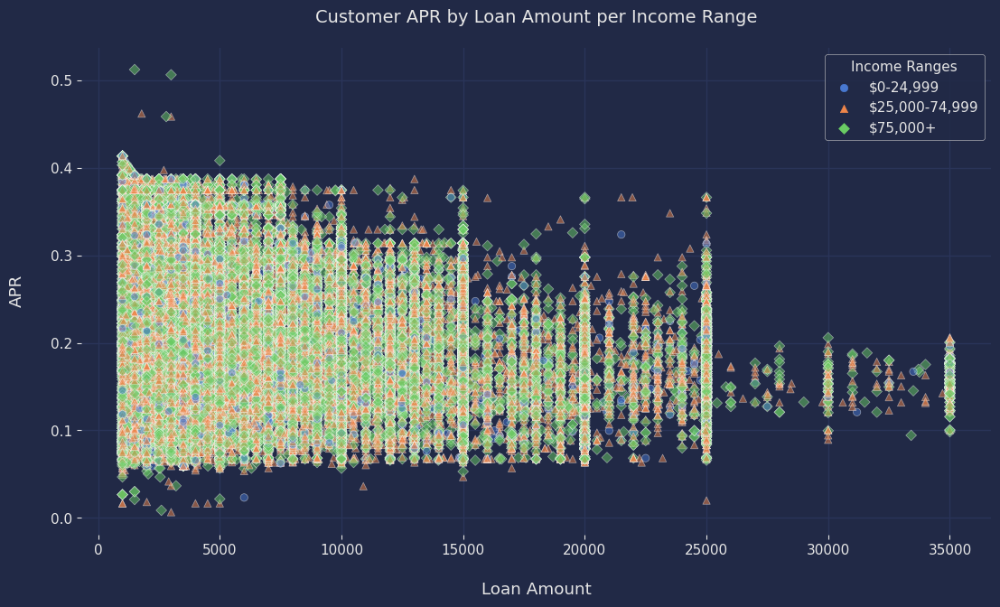

In [102]:
plt.figure(figsize=(13, 7))
sns.scatterplot(data=chart_df, x='Amount', y='APR', hue='Income', style='Income', alpha=0.5,
                markers=IR_marker_styles, palette='muted')
plt.title('Customer APR by Loan Amount per Income Range')
plt.xlabel('Loan Amount', labelpad=20)
plt.ylabel('APR', labelpad=20)
plt.legend(title='Income Ranges')
plt.show()

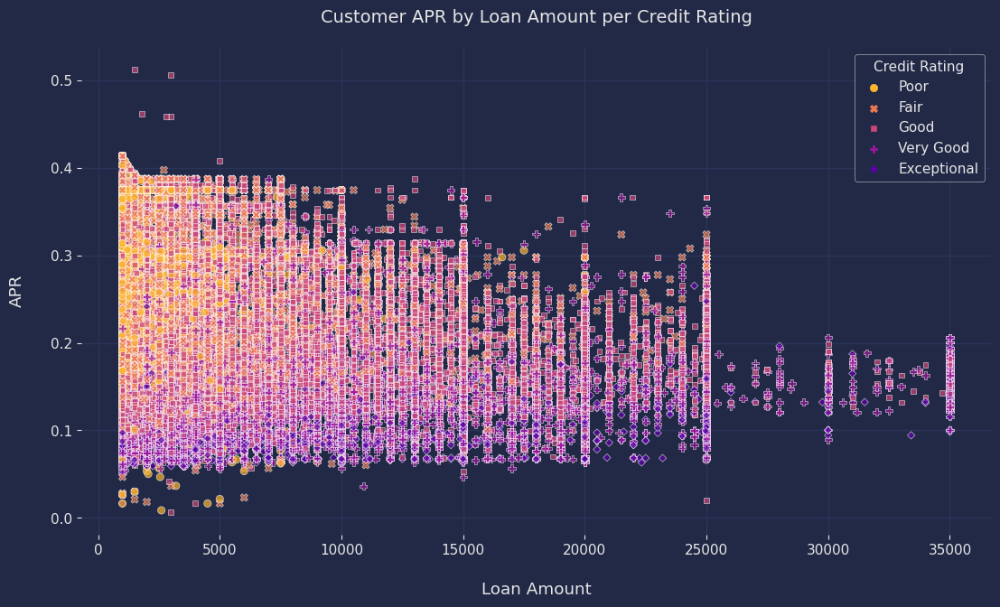

In [103]:
plt.figure(figsize=(13, 7))
sns.scatterplot(data=chart_df, x='Amount', y='APR', hue='CreditScore', style='CreditScore', alpha=0.7,
                palette='plasma_r')
plt.title('Customer APR by Loan Amount per Credit Rating')
plt.xlabel('Loan Amount', labelpad=20)
plt.ylabel('APR', labelpad=20)
plt.legend(title='Credit Rating')
plt.show()

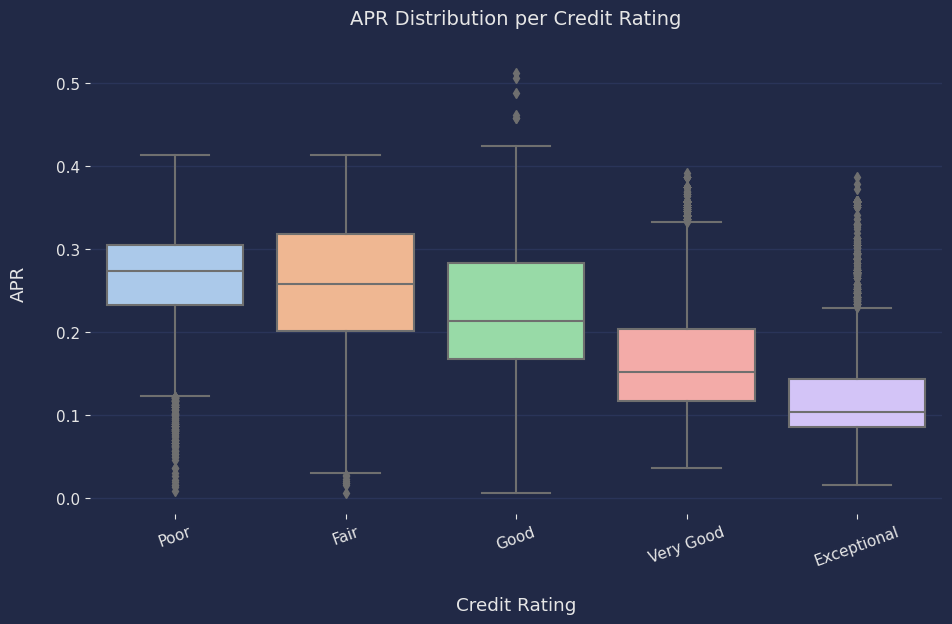

In [104]:
plt.figure(figsize=(11,6))
sns.boxplot(data=anova_df, x='CreditScore', y='BorrowerAPR', palette='pastel')
plt.xticks(rotation=20)
plt.title('APR Distribution per Credit Rating')
plt.xlabel('Credit Rating', labelpad=20)
plt.ylabel('APR', labelpad=20)
plt.show()

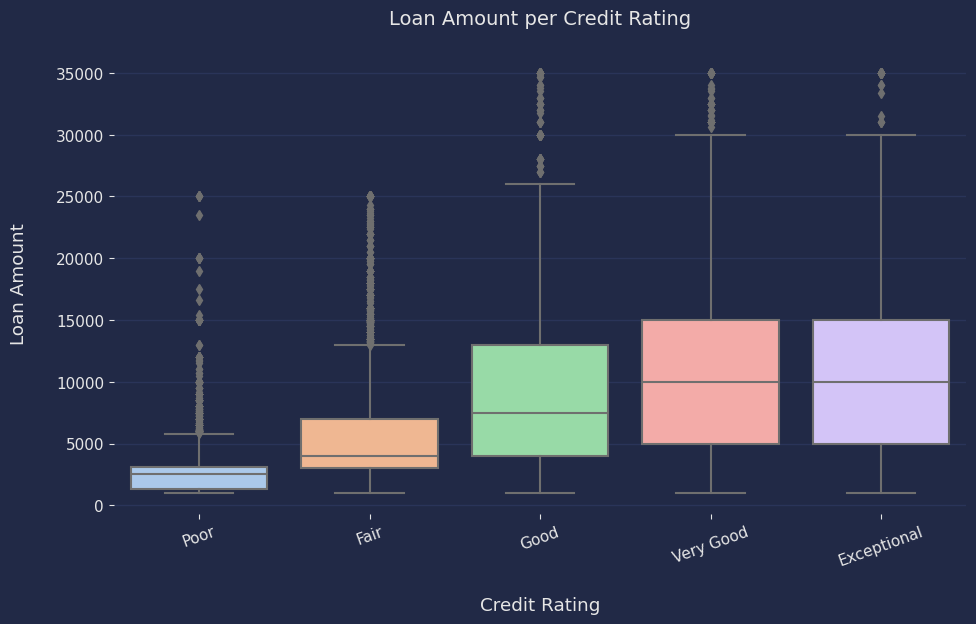

In [105]:
plt.figure(figsize=(11,6))
sns.boxplot(data=anova_df, x='CreditScore', y='LoanOriginalAmount', palette='pastel')
plt.xticks(rotation=20)
plt.title('Loan Amount per Credit Rating')
plt.xlabel('Credit Rating', labelpad=20)
plt.ylabel('Loan Amount', labelpad=20)
plt.show()

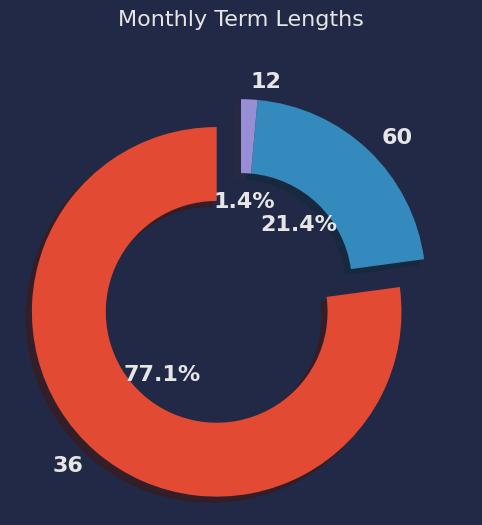

In [106]:
# Doughnut chart code
pie_labels = ['36', '60', '12']
pie_sizes = [87224, 24228, 1614]
pie_explode = (0.2, 0, 0)
pie_bold_font = FontProperties(weight='bold', size=16)

plt.figure(figsize=(10,6))
plt.pie(pie_sizes, explode=pie_explode, labels=pie_labels, autopct='%1.1f%%', shadow=True, startangle=90, 
       wedgeprops={'width':.4, 'linewidth':1.5}, textprops={'fontproperties': pie_bold_font},
                   pctdistance=.45)
plt.title('Monthly Term Lengths', size=16)
plt.show()

## Risk Assessment Levied on ProsperRating

In [107]:
prosper_score

,LoanOriginalAmount,BorrowerAPR,CurrentDelinquencies,AmountDelinquent,OpenCreditLines,CreditScore,DebtToIncomeRatio,BankcardUtilization,Recommendations
ProsperScore,,,,,,,,,
1.0,6472.01,0.22,1.02,1143.72,8.85,685.44,0.51,0.55,0.04
2.0,6251.26,0.22,0.85,1146.65,8.45,682.28,0.31,0.53,0.01
3.0,6451.83,0.22,0.97,1128.54,8.55,682.31,0.32,0.53,0.01
4.0,6219.06,0.22,0.87,1020.58,8.44,683.33,0.30,0.54,0.01
5.0,6315.71,0.22,0.82,961.02,8.46,683.46,0.29,0.53,0.01
6.0,6107.96,0.22,0.91,1007.98,8.41,680.04,0.27,0.54,0.01
7.0,6307.37,0.22,0.92,1206.76,8.49,683.16,0.24,0.53,0.01
8.0,6374.04,0.22,0.85,1048.13,8.42,681.37,0.22,0.53,0.02
9.0,6119.41,0.22,0.98,933.71,8.48,680.89,0.19,0.53,0.03


In [108]:
print(filtered_df.shape)
filtered_df.head(2)

(76768, 19)


,LoanStatus,BorrowerAPR,BorrowerRate,ListingCategory (numeric),LoanOriginalAmount,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,BankcardUtilization,ProsperScore,EmploymentStatus,TotalTrades,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,Recommendations,CreditScore
1,Current,0.120,0.092,2,10000,14.000,29.0,5.0,0.0,0.000,0.210,7.0,Employed,29.0,0.18,"$50,000-74,999",1.0,0.0,690.0
2,Completed,0.283,0.275,0,3001,9.248,3.0,1.0,1.0,986.818,0.561,9.0,Employed,26.0,0.15,"$25,000-49,999",1.0,0.0,490.0


In [109]:
og = pd.read_csv(r"C:\Users\tekre\OneDrive\Desktop\Job\Portfolio\Analysis Projects\2. 02172024 - Root Cause & Risk Analysis on Loans\Tables\ProsperLoan_Data.csv")
og['PK'] = og.index
og = og[['LenderYield', 'ProsperRating (numeric)', 'EstimatedLoss', 'PK', 'EstimatedReturn', 'EstimatedEffectiveYield', 'Investors']].copy()
filtered_df['PK'] = filtered_df.index
risky = filtered_df.merge(og, on='PK', how='inner')
risky

,LoanStatus,BorrowerAPR,BorrowerRate,ListingCategory (numeric),LoanOriginalAmount,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,...,IncomeVerifiable,Recommendations,CreditScore,PK,LenderYield,ProsperRating (numeric),EstimatedLoss,EstimatedReturn,EstimatedEffectiveYield,Investors
0,Current,0.120,0.092,2,10000,14.000,29.000,5.000,0.000,0.000,...,1.0,0.0,690.0,1,0.082,6.0,0.025,0.055,0.080,1
1,Completed,0.283,0.275,0,3001,9.248,3.000,1.000,1.000,986.818,...,1.0,0.0,490.0,2,0.240,NaN,NaN,NaN,NaN,41
2,Current,0.125,0.097,16,10000,5.000,29.000,1.000,4.000,10056.000,...,1.0,0.0,810.0,3,0.087,6.0,0.025,0.060,0.085,158
3,Current,0.246,0.208,2,15000,19.000,49.000,9.000,0.000,0.000,...,1.0,0.0,690.0,4,0.199,3.0,0.092,0.091,0.183,20
4,Current,0.154,0.131,1,15000,17.000,49.000,2.000,0.000,0.000,...,1.0,0.0,750.0,5,0.121,5.0,0.045,0.071,0.116,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76763,Current,0.288,0.249,1,4000,5.000,25.000,3.000,0.000,0.000,...,1.0,0.0,690.0,105320,0.109,6.0,0.037,0.067,0.104,1
76764,Defaulted,0.349,0.312,1,4000,10.000,21.000,2.000,0.000,0.000,...,1.0,0.0,630.0,105321,0.215,NaN,NaN,NaN,NaN,144
76765,Completed,0.273,0.235,1,15000,8.000,17.000,1.000,0.000,0.000,...,1.0,0.0,710.0,105322,0.148,5.0,0.050,0.090,0.140,1
76766,Current,0.158,0.130,19,4000,4.000,12.000,5.000,0.000,0.000,...,1.0,0.0,730.0,105323,0.267,2.0,0.142,0.101,0.243,6


In [110]:
risky.rename({'ListingCategory (numeric)':'ListingCategory', 'ProsperRating (numeric)':'ProsperRating', 'BorrowerAPR':'APR',
             'BorrowerRate':'Rate'}, axis=1, inplace=True)
risky.drop(['PK', 'ProsperScore', 'EmploymentStatus', 'IncomeRange', 'ListingCategory', 'Recommendations', 'IncomeVerifiable', 'Rate'], axis=1, inplace=True)
risky.columns

Index(['LoanStatus', 'APR', 'LoanOriginalAmount', 'OpenCreditLines',
       'TotalCreditLinespast7years', 'TotalInquiries', 'CurrentDelinquencies',
       'AmountDelinquent', 'BankcardUtilization', 'TotalTrades',
       'DebtToIncomeRatio', 'CreditScore', 'LenderYield', 'ProsperRating',
       'EstimatedLoss', 'EstimatedReturn', 'EstimatedEffectiveYield',
       'Investors'],
      dtype='object')

In [111]:
risky.isna().sum()

LoanStatus                        0
APR                               0
LoanOriginalAmount                0
OpenCreditLines                   0
TotalCreditLinespast7years        0
TotalInquiries                    0
CurrentDelinquencies              0
AmountDelinquent                  0
BankcardUtilization               0
TotalTrades                       0
DebtToIncomeRatio                 0
CreditScore                       0
LenderYield                       0
ProsperRating                 19556
EstimatedLoss                 19556
EstimatedReturn               19556
EstimatedEffectiveYield       19556
Investors                         0
dtype: int64

In [112]:
risky.dropna(inplace=True)
risky.info()

<class 'pandas.core.frame.DataFrame'>
Index: 57212 entries, 0 to 76767
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   LoanStatus                  57212 non-null  object 
 1   APR                         57212 non-null  float64
 2   LoanOriginalAmount          57212 non-null  int64  
 3   OpenCreditLines             57212 non-null  float64
 4   TotalCreditLinespast7years  57212 non-null  float64
 5   TotalInquiries              57212 non-null  float64
 6   CurrentDelinquencies        57212 non-null  float64
 7   AmountDelinquent            57212 non-null  float64
 8   BankcardUtilization         57212 non-null  float64
 9   TotalTrades                 57212 non-null  float64
 10  DebtToIncomeRatio           57212 non-null  float64
 11  CreditScore                 57212 non-null  float64
 12  LenderYield                 57212 non-null  float64
 13  ProsperRating               57212 no

In [113]:
risky.describe()

,APR,LoanOriginalAmount,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,BankcardUtilization,TotalTrades,DebtToIncomeRatio,CreditScore,LenderYield,ProsperRating,EstimatedLoss,EstimatedReturn,EstimatedEffectiveYield,Investors
count,57212.000,57212.000,57212.000,57212.000,57212.000,57212.000,57212.000,57212.000,57212.000,57212.000,57212.000,57212.000,57212.000,57212.000,57212.000,57212.000,57212.000
mean,0.219,8292.781,9.252,26.761,5.586,0.593,1003.282,0.563,24.206,0.258,695.314,0.186,4.078,0.080,0.096,0.168,67.920
std,0.081,6233.422,4.834,13.521,6.569,1.939,7256.778,0.306,11.620,0.305,66.271,0.075,1.673,0.047,0.030,0.068,94.992
min,0.007,1000.000,0.000,2.000,0.000,0.000,0.000,0.000,1.000,0.000,10.000,0.030,1.000,0.005,-0.183,-0.183,1.000
25%,0.156,4000.000,6.000,17.000,2.000,0.000,0.000,0.330,16.000,0.150,670.000,0.126,3.000,0.042,0.074,0.116,1.000
50%,0.210,6001.000,9.000,25.000,4.000,0.000,0.000,0.570,23.000,0.220,690.000,0.177,4.000,0.070,0.092,0.162,31.000
75%,0.285,12000.000,12.000,35.000,7.000,0.000,0.000,0.830,31.000,0.320,730.000,0.247,5.000,0.112,0.116,0.224,96.000
max,0.512,35000.000,54.000,129.000,379.000,64.000,463881.000,2.660,114.000,10.010,890.000,0.340,7.000,0.366,0.267,0.320,1189.000


In [114]:
mask = risky[risky['CreditScore']<500].index
risky.drop(mask, axis=0, inplace=True)
mask = risky[risky['EstimatedReturn']<0.05].index
risky.drop(mask, axis=0, inplace=True)
risky.describe()

,APR,LoanOriginalAmount,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,BankcardUtilization,TotalTrades,DebtToIncomeRatio,CreditScore,LenderYield,ProsperRating,EstimatedLoss,EstimatedReturn,EstimatedEffectiveYield,Investors
count,54544.000,54544.000,54544.000,54544.000,54544.000,54544.000,54544.000,54544.000,54544.000,54544.000,54544.000,54544.000,54544.000,54544.000,54544.000,54544.000,54544.000
mean,0.219,8315.237,9.251,26.823,5.551,0.558,1006.979,0.563,24.212,0.258,697.053,0.190,3.987,0.082,0.098,0.173,66.035
std,0.081,6231.296,4.845,13.520,6.177,1.807,7264.918,0.307,11.619,0.300,60.448,0.072,1.610,0.044,0.028,0.065,93.275
min,0.007,1000.000,0.000,2.000,0.000,0.000,0.000,0.000,1.000,0.000,510.000,0.056,1.000,0.005,0.050,0.050,1.000
25%,0.156,4000.000,6.000,17.000,2.000,0.000,0.000,0.330,16.000,0.150,670.000,0.131,3.000,0.045,0.077,0.123,1.000
50%,0.210,6250.000,9.000,25.000,4.000,0.000,0.000,0.570,23.000,0.220,690.000,0.180,4.000,0.075,0.094,0.165,30.000
75%,0.285,12000.000,12.000,35.000,7.000,0.000,0.000,0.830,31.000,0.320,730.000,0.250,5.000,0.112,0.117,0.227,93.000
max,0.512,35000.000,54.000,129.000,117.000,45.000,463881.000,2.660,114.000,10.010,890.000,0.340,7.000,0.250,0.267,0.320,1189.000


In [115]:
risky.replace({0:np.nan}, inplace=True)
risky.dropna(inplace=True)
risky.describe()

,APR,LoanOriginalAmount,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,BankcardUtilization,TotalTrades,DebtToIncomeRatio,CreditScore,LenderYield,ProsperRating,EstimatedLoss,EstimatedReturn,EstimatedEffectiveYield,Investors
count,8103.000,8103.000,8103.000,8103.000,8103.000,8103.000,8103.000,8103.000,8103.000,8103.000,8103.000,8103.000,8103.000,8103.000,8103.000,8103.000,8103.000
mean,0.250,5812.547,8.381,27.865,7.869,2.714,5132.659,0.610,24.260,0.259,653.303,0.191,3.967,0.082,0.098,0.174,65.931
std,0.076,4835.544,3.835,13.118,8.336,3.152,15622.042,0.285,11.785,0.314,65.147,0.072,1.621,0.045,0.028,0.066,91.331
min,0.017,1000.000,1.000,2.000,1.000,0.595,1.000,0.010,1.000,0.010,510.000,0.057,1.000,0.005,0.050,0.050,1.000
25%,0.192,2550.000,6.000,18.000,3.000,1.000,346.000,0.450,16.000,0.150,610.000,0.132,3.000,0.047,0.077,0.124,1.000
50%,0.249,4000.000,9.000,26.746,5.591,2.000,986.818,0.561,23.000,0.230,670.000,0.181,4.000,0.075,0.095,0.165,31.000
75%,0.306,7500.000,9.248,35.000,10.000,3.000,3127.000,0.840,31.000,0.320,690.000,0.250,5.000,0.112,0.117,0.231,94.500
max,0.512,35000.000,33.000,98.000,112.000,41.000,463881.000,2.460,88.000,10.010,850.000,0.340,7.000,0.250,0.254,0.320,755.000


In [116]:
SUBrisky = risky.copy(deep=True)
col = 'Investors'
quantile = np.quantile(SUBrisky[col], .55)
mask = SUBrisky[SUBrisky[col]>quantile].index
SUBrisky.drop(mask, inplace=True)
SUBrisky.describe()

col = 'AmountDelinquent'
quantile = np.quantile(SUBrisky[col], .75)
mask = SUBrisky[SUBrisky[col]>quantile].index
SUBrisky.drop(mask, inplace=True)
SUBrisky.describe()

col = 'CurrentDelinquencies'
quantile = np.quantile(SUBrisky[col], .75)
mask = SUBrisky[SUBrisky[col]>quantile].index
SUBrisky.drop(mask, inplace=True)
SUBrisky.describe()

col = 'TotalInquiries'
quantile = np.quantile(SUBrisky[col], .75)
mask = SUBrisky[SUBrisky[col]>quantile].index
SUBrisky.drop(mask, inplace=True)
SUBrisky.describe()

col = 'DebtToIncomeRatio'
quantile = np.quantile(SUBrisky[col], .75)
mask = SUBrisky[SUBrisky[col]>quantile].index
SUBrisky.drop(mask, inplace=True)
SUBrisky.describe()

col = 'DebtToIncomeRatio'
quantile = np.quantile(SUBrisky[col], .75)
mask = SUBrisky[SUBrisky[col]>quantile].index
SUBrisky.drop(mask, inplace=True)
SUBrisky.describe()

col = 'TotalTrades'
quantile = np.quantile(SUBrisky[col], .75)
mask = SUBrisky[SUBrisky[col]>quantile].index
SUBrisky.drop(mask, inplace=True)
SUBrisky.describe()

col = 'OpenCreditLines'
quantile = np.quantile(SUBrisky[col], .75)
mask = SUBrisky[SUBrisky[col]>quantile].index
SUBrisky.drop(mask, inplace=True)
SUBrisky.describe()

col = 'TotalCreditLinespast7years'
quantile = np.quantile(SUBrisky[col], .75)
mask = SUBrisky[SUBrisky[col]>quantile].index
SUBrisky.drop(mask, inplace=True)
SUBrisky.describe()

,APR,LoanOriginalAmount,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,BankcardUtilization,TotalTrades,DebtToIncomeRatio,CreditScore,LenderYield,ProsperRating,EstimatedLoss,EstimatedReturn,EstimatedEffectiveYield,Investors
count,554.000,554.000,554.000,554.000,554.000,554.000,554.000,554.000,554.000,554.000,554.000,554.000,554.000,554.000,554.000,554.000,554.000
mean,0.239,5692.538,6.965,18.799,4.284,1.376,676.129,0.554,17.031,0.150,668.493,0.199,3.708,0.089,0.098,0.185,8.153
std,0.080,4340.815,2.449,6.348,2.284,0.718,570.823,0.262,6.818,0.056,55.188,0.068,1.497,0.043,0.026,0.062,11.559
min,0.064,1000.000,1.000,3.000,1.000,0.595,2.000,0.020,2.000,0.020,510.000,0.078,1.000,0.017,0.053,0.070,1.000
25%,0.177,3000.000,5.000,14.000,2.000,1.000,161.250,0.383,12.000,0.110,650.000,0.143,2.000,0.055,0.078,0.135,1.000
50%,0.238,4000.000,8.000,19.000,4.000,1.000,599.000,0.561,17.000,0.150,670.000,0.188,4.000,0.082,0.092,0.173,1.000
75%,0.303,7500.000,9.248,25.000,5.591,2.000,986.818,0.730,23.000,0.200,695.000,0.258,5.000,0.122,0.115,0.237,12.000
max,0.414,25000.000,10.000,28.000,9.000,3.000,2801.000,1.300,28.000,0.240,830.000,0.340,7.000,0.250,0.223,0.306,40.000


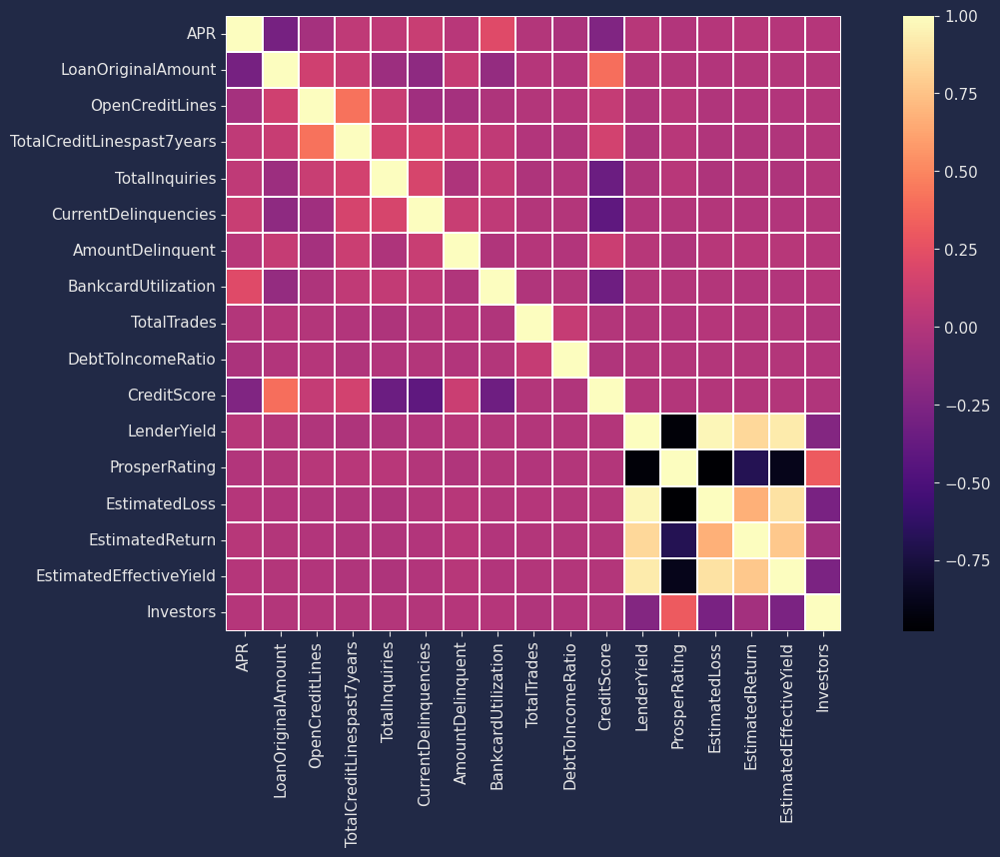

In [117]:
f, ax = plt.subplots(figsize=(16,8))
ax = sns.heatmap(risky.iloc[:, 1:].corr(),linewidths=.2 ,square=True, cmap='magma')

In [118]:
corrells = ['CreditScore', 'TotalInquiries', 'CurrentDelinquencies', 'BankcardUtilization', 'LenderYield',
            'ProsperRating', 'EstimatedLoss', 'EstimatedReturn', 'EstimatedEffectiveYield', 'Investors', 'APR']
preDF = SUBrisky.copy(deep=True)
print(preDF.columns)
print(preDF.shape)
print(SUBrisky.shape)
print(preDF.isna().sum())

Index(['LoanStatus', 'APR', 'LoanOriginalAmount', 'OpenCreditLines',
       'TotalCreditLinespast7years', 'TotalInquiries', 'CurrentDelinquencies',
       'AmountDelinquent', 'BankcardUtilization', 'TotalTrades',
       'DebtToIncomeRatio', 'CreditScore', 'LenderYield', 'ProsperRating',
       'EstimatedLoss', 'EstimatedReturn', 'EstimatedEffectiveYield',
       'Investors'],
      dtype='object')
(554, 18)
(554, 18)
LoanStatus                    0
APR                           0
LoanOriginalAmount            0
OpenCreditLines               0
TotalCreditLinespast7years    0
TotalInquiries                0
CurrentDelinquencies          0
AmountDelinquent              0
BankcardUtilization           0
TotalTrades                   0
DebtToIncomeRatio             0
CreditScore                   0
LenderYield                   0
ProsperRating                 0
EstimatedLoss                 0
EstimatedReturn               0
EstimatedEffectiveYield       0
Investors                     0
dty

In [119]:
(preDF == SUBrisky).any()

LoanStatus                    True
APR                           True
LoanOriginalAmount            True
OpenCreditLines               True
TotalCreditLinespast7years    True
TotalInquiries                True
CurrentDelinquencies          True
AmountDelinquent              True
BankcardUtilization           True
TotalTrades                   True
DebtToIncomeRatio             True
CreditScore                   True
LenderYield                   True
ProsperRating                 True
EstimatedLoss                 True
EstimatedReturn               True
EstimatedEffectiveYield       True
Investors                     True
dtype: bool

In [120]:
preDF = preDF[corrells]
preDF.shape

(554, 11)

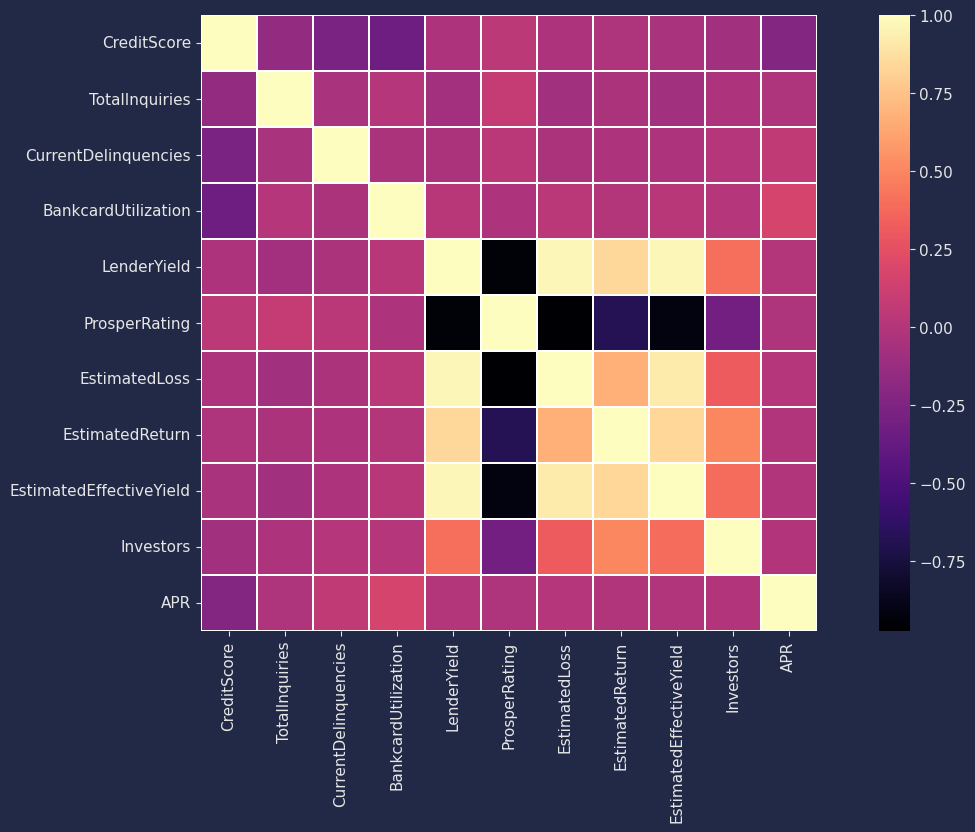

In [121]:
f, ax = plt.subplots(figsize=(16,8))
ax = sns.heatmap(preDF.corr(),linewidths=.2 ,square=True, cmap='magma')

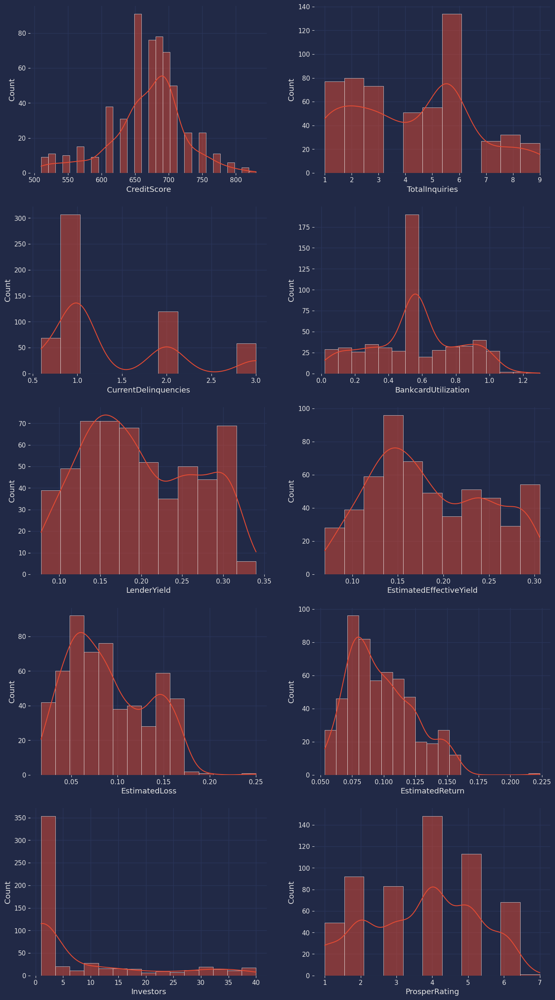

In [122]:
fig, axs = plt.subplots(5, 2, figsize=(16, 30))
sns.histplot(preDF['CreditScore'], kde=True, ax=axs[0, 0])
sns.histplot(preDF['TotalInquiries'], kde=True, ax=axs[0, 1])
sns.histplot(preDF['CurrentDelinquencies'], kde=True, ax=axs[1, 0])
sns.histplot(preDF['BankcardUtilization'], kde=True, ax=axs[1, 1])
sns.histplot(preDF['LenderYield'], kde=True, ax=axs[2, 0])
sns.histplot(preDF['EstimatedEffectiveYield'], kde=True, ax=axs[2, 1])
sns.histplot(preDF['EstimatedLoss'], kde=True, ax=axs[3, 0])
sns.histplot(preDF['EstimatedReturn'], kde=True, ax=axs[3, 1])
sns.histplot(preDF['Investors'], kde=True, ax=axs[4, 0])
sns.histplot(preDF['ProsperRating'], kde=True, ax=axs[4, 1])
plt.show()

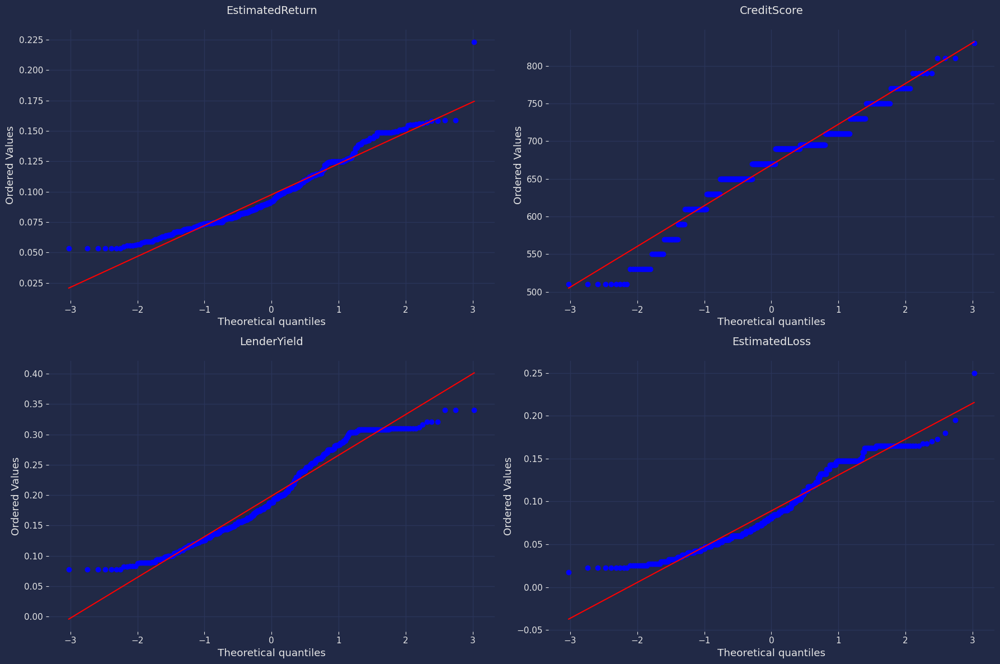

In [123]:
fig, axs = plt.subplots(2, 2, figsize=(18,12))
stats.probplot(preDF['EstimatedReturn'], dist='norm', plot=axs[0,0])
axs[0,0].set_title('Normality (~on line)', fontweight="bold")
axs[0,0].set_title('EstimatedReturn')
stats.probplot(preDF['CreditScore'], dist='norm', plot=axs[0,1])
axs[0,1].set_title('Normality (~on line)', fontweight="bold")
axs[0,1].set_title('CreditScore')
stats.probplot(preDF['LenderYield'], dist='norm', plot=axs[1,0])
axs[1,0].set_title('Normality (~on line)', fontweight="bold")
axs[1,0].set_title('LenderYield')
stats.probplot(preDF['EstimatedLoss'], dist='norm', plot=axs[1,1])
axs[1,1].set_title('Normality (~on line)', fontweight="bold")
axs[1,1].set_title('EstimatedLoss')
plt.tight_layout()
plt.show()

In [124]:
samples = [preDF['EstimatedReturn'], preDF['CreditScore'], preDF['LenderYield'], preDF['EstimatedLoss']]
shapiro_results = []
for sample in samples:
    statistic, p_value = stats.shapiro(sample)
    shapiro_results.append((statistic, p_value))

for i, (statistic, p_value) in enumerate(shapiro_results):
    print(f"Shapiro-Wilk Test - sample {i}:")
    print("Test Statistic:", round(statistic, 3))
    print("p-value:", round(p_value, 3))
    if p_value <= alpha:
        print("Reject the null hypothesis. The sample does not follow a normal distribution.\n")
    else:
        print("Fail to reject the null hypothesis. The sample follows a normal distribution.\n")

Shapiro-Wilk Test - sample 0:
Test Statistic: 0.955
p-value: 0.0
Reject the null hypothesis. The sample does not follow a normal distribution.

Shapiro-Wilk Test - sample 1:
Test Statistic: 0.952
p-value: 0.0
Reject the null hypothesis. The sample does not follow a normal distribution.

Shapiro-Wilk Test - sample 2:
Test Statistic: 0.954
p-value: 0.0
Reject the null hypothesis. The sample does not follow a normal distribution.

Shapiro-Wilk Test - sample 3:
Test Statistic: 0.947
p-value: 0.0
Reject the null hypothesis. The sample does not follow a normal distribution.



## Linear Regressions
Estimated Loss will represent ProsperRating. They have a high correlation of .97, and since Estimated Loss is a continuous variable, it will fit the models smoothly.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                            OLS Regression Results                            
Dep. Variable:          EstimatedLoss   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.6402
Date:                Fri, 19 Apr 2024   Prob (F-statistic):              0.424
Time:                        09:02:46   Log-Likelihood:                 961.11
No. Observations:                 554   AIC:                            -1918.
Df Residuals:                     552   BIC:                            -1910.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.1067      0.022      4.827      

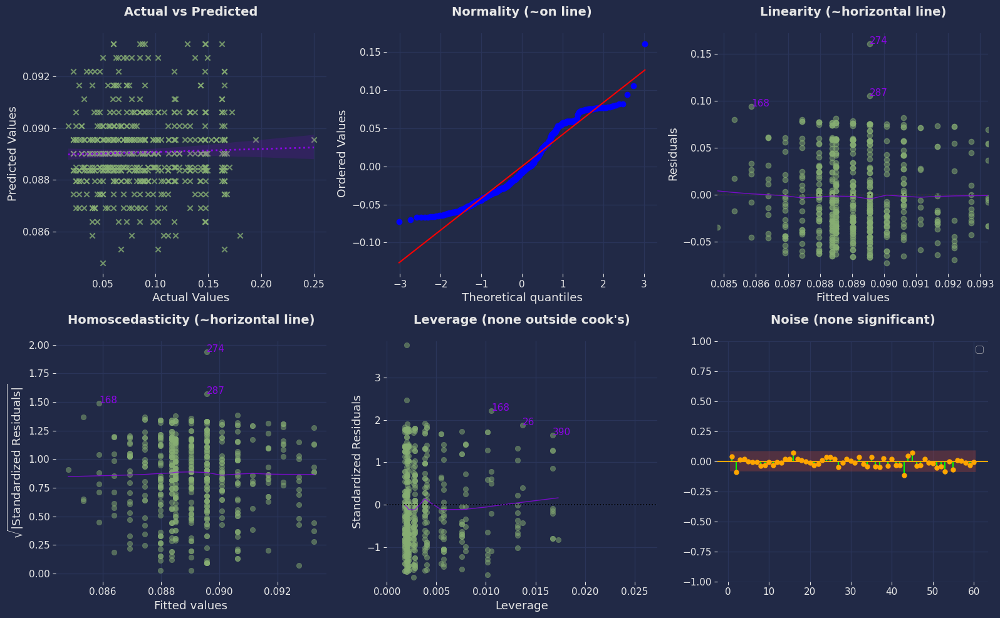

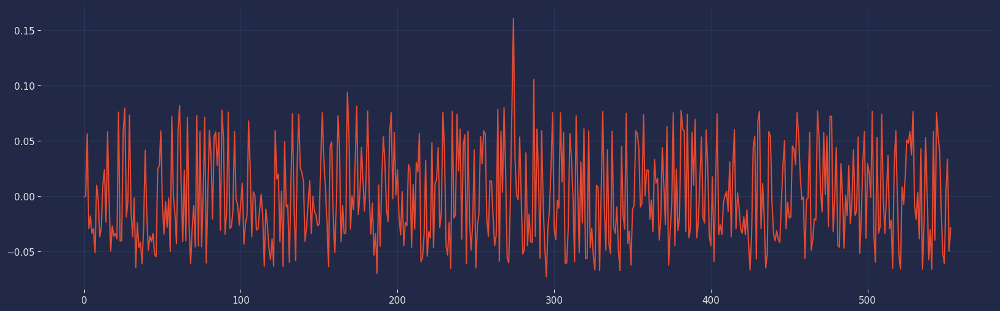

In [125]:
model = smf.ols('EstimatedLoss ~ CreditScore', preDF).fit(use_t=True)
print(model.summary())
SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                            OLS Regression Results                            
Dep. Variable:          EstimatedLoss   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.6728
Date:                Fri, 19 Apr 2024   Prob (F-statistic):              0.412
Time:                        09:02:47   Log-Likelihood:                 961.11
No. Observations:                 554   AIC:                            -1918.
Df Residuals:                     552   BIC:                            -1910.
Df Model:                           1                                         
Covariance Type:                  HC1                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.1067      0.022      4.949      

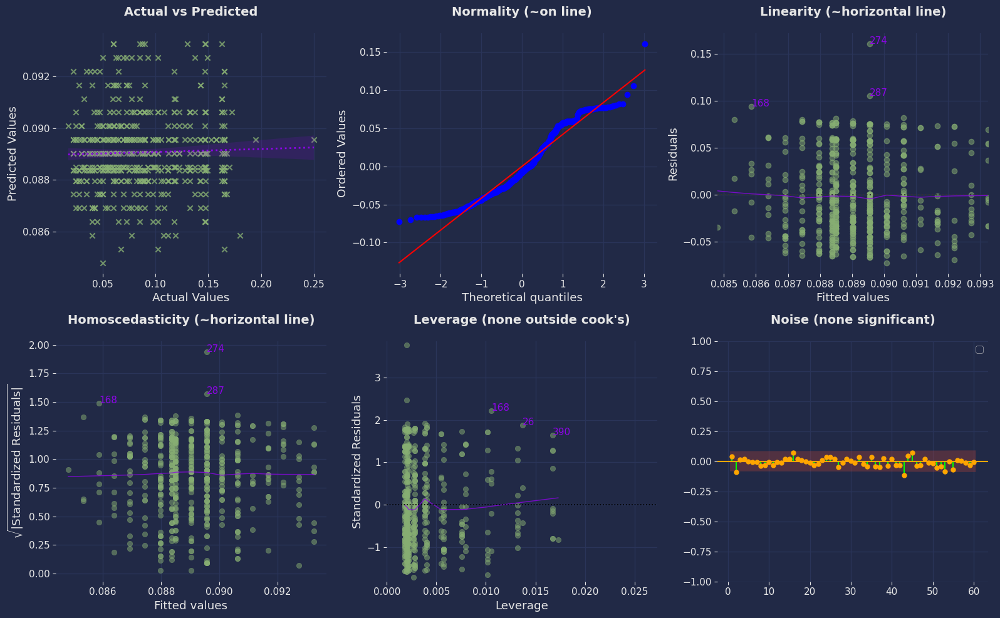

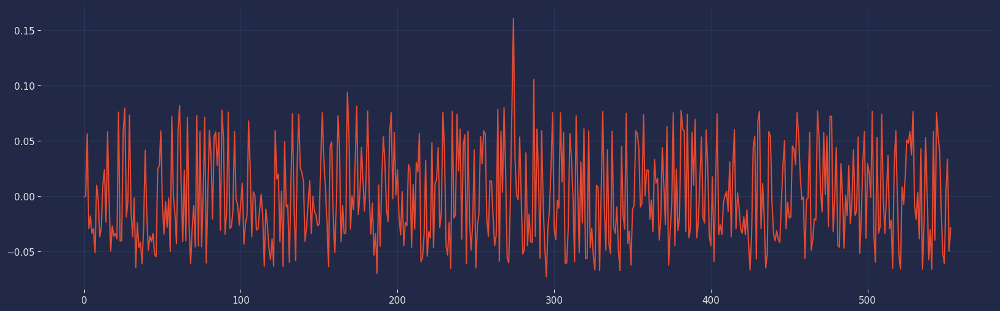

In [126]:
model = smf.ols('EstimatedLoss ~ CreditScore', preDF).fit(cov_type='HC1', use_t=True)
print(model.summary())
SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                            OLS Regression Results                            
Dep. Variable:          EstimatedLoss   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     4.171
Date:                Fri, 19 Apr 2024   Prob (F-statistic):             0.0416
Time:                        09:02:48   Log-Likelihood:                 962.85
No. Observations:                 554   AIC:                            -1922.
Df Residuals:                     552   BIC:                            -1913.
Df Model:                           1                                         
Covariance Type:                  HC1                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          0.0960      0.004     24.

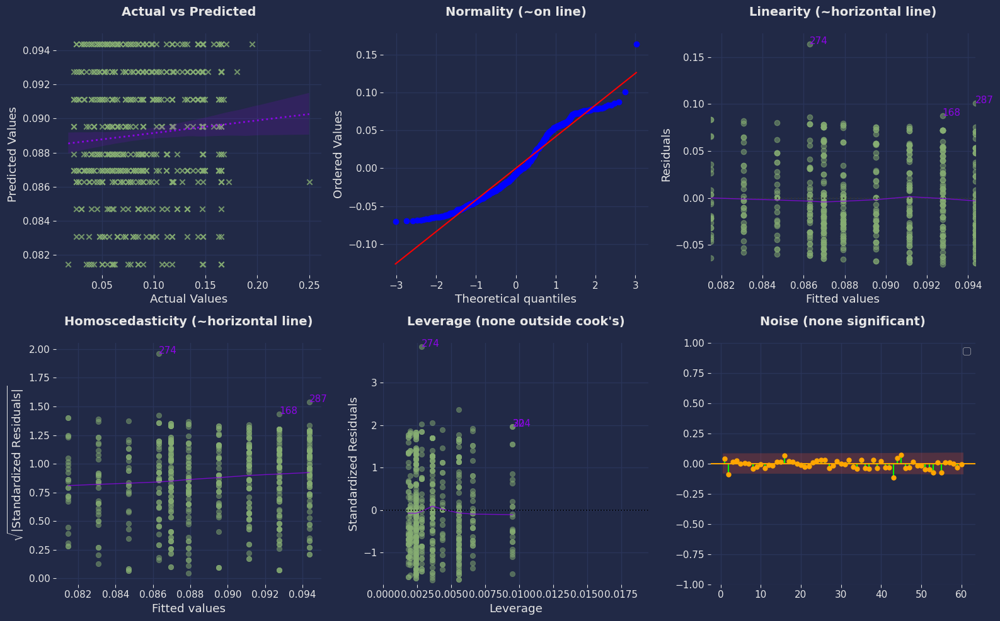

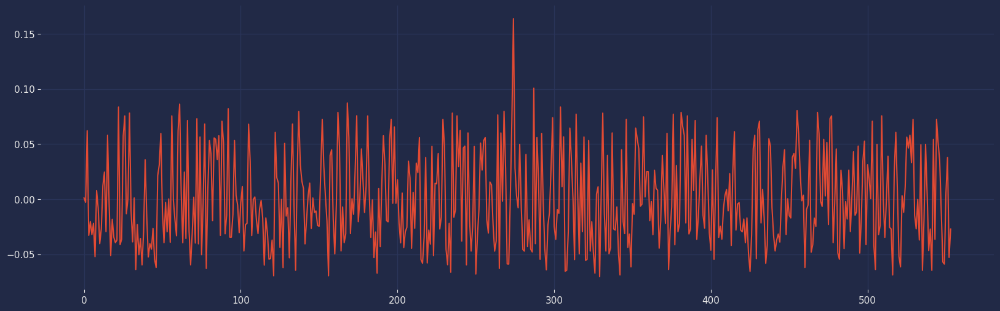

In [127]:
model = smf.ols('EstimatedLoss ~ TotalInquiries', preDF).fit(cov_type='HC1', use_t=True)
print(model.summary())
SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                            OLS Regression Results                            
Dep. Variable:          EstimatedLoss   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                     1.037
Date:                Fri, 19 Apr 2024   Prob (F-statistic):              0.309
Time:                        09:02:50   Log-Likelihood:                 961.27
No. Observations:                 554   AIC:                            -1919.
Df Residuals:                     552   BIC:                            -1910.
Df Model:                           1                                         
Covariance Type:                  HC1                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                0.0925 

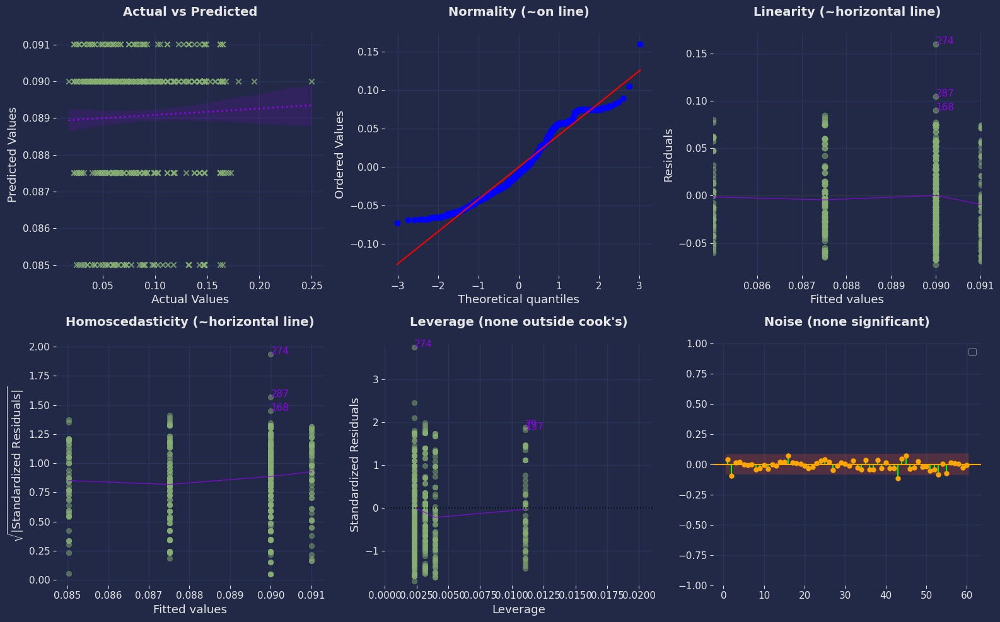

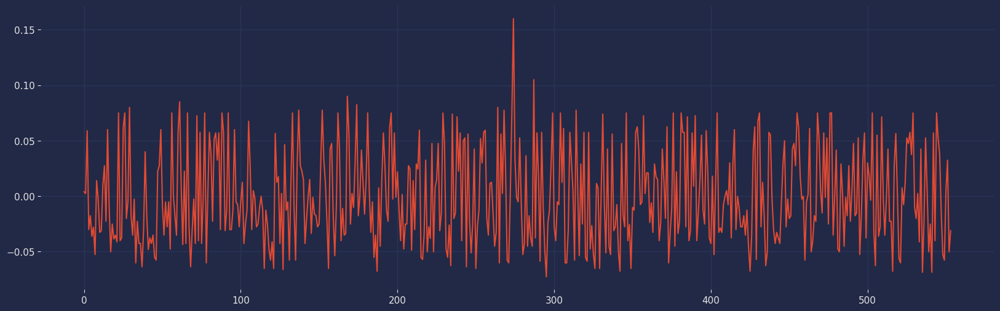

In [128]:
model = smf.ols('EstimatedLoss ~ CurrentDelinquencies', preDF).fit(cov_type='HC1', use_t=True)
print(model.summary())
SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                            OLS Regression Results                            
Dep. Variable:          EstimatedLoss   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.4863
Date:                Fri, 19 Apr 2024   Prob (F-statistic):              0.486
Time:                        09:02:51   Log-Likelihood:                 961.03
No. Observations:                 554   AIC:                            -1918.
Df Residuals:                     552   BIC:                            -1909.
Df Model:                           1                                         
Covariance Type:                  HC1                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               0.0864    

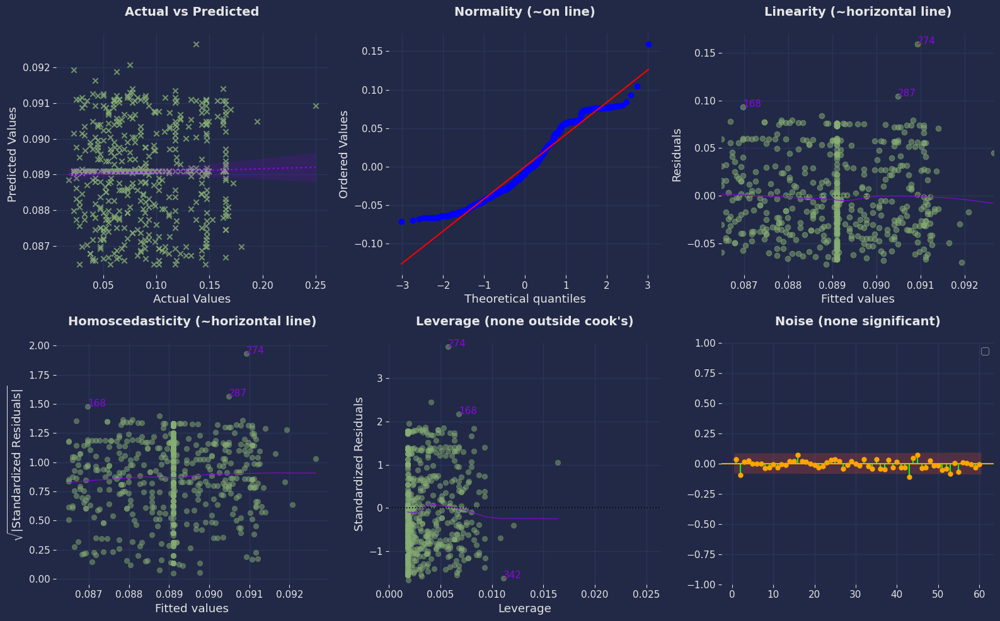

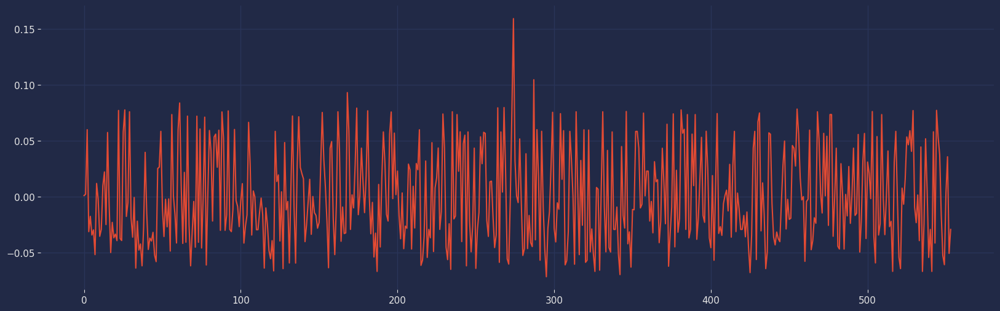

In [129]:
model = smf.ols('EstimatedLoss ~ BankcardUtilization', preDF).fit(cov_type='HC1', use_t=True)
print(model.summary())
SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:          EstimatedLoss   R-squared:                       0.456
Model:                            OLS   Adj. R-squared:                  0.455
Method:                 Least Squares   F-statistic:                     264.9
Date:                Fri, 19 Apr 2024   Prob (F-statistic):           6.12e-49
Time:                        09:02:52   Log-Likelihood:                 1129.4
No. Observations:                 554   AIC:                            -2255.
Df Residuals:                     552   BIC:                            -2246.
Df Model:                           1                                         
Covariance Type:                  HC1                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -0.0197      0.006     

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


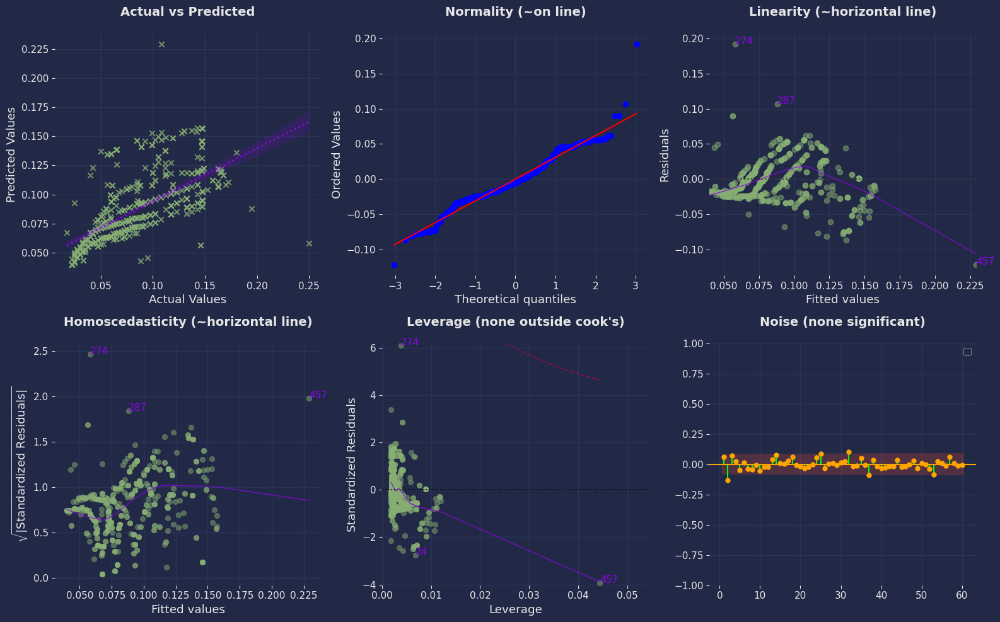

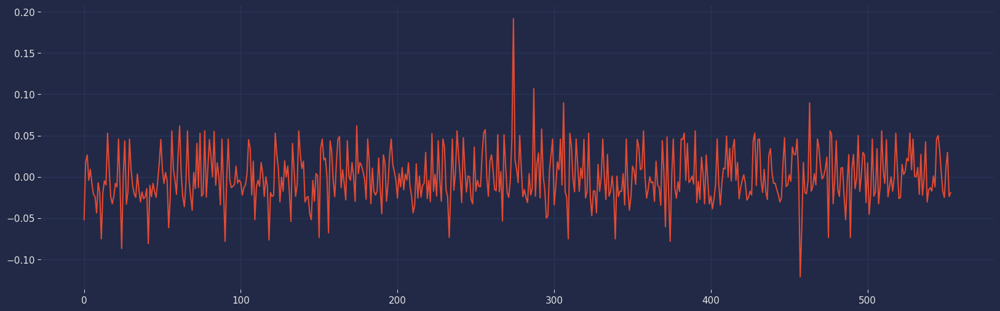

In [130]:
model = smf.ols('EstimatedLoss ~ EstimatedReturn', preDF).fit(cov_type='HC1', use_t=True)
print(model.summary())
SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:          EstimatedLoss   R-squared:                       0.847
Model:                            OLS   Adj. R-squared:                  0.847
Method:                 Least Squares   F-statistic:                     1787.
Date:                Fri, 19 Apr 2024   Prob (F-statistic):          3.17e-175
Time:                        09:02:53   Log-Likelihood:                 1480.6
No. Observations:                 554   AIC:                            -2957.
Df Residuals:                     552   BIC:                            -2949.
Df Model:                           1                                         
Covariance Type:                  HC1                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


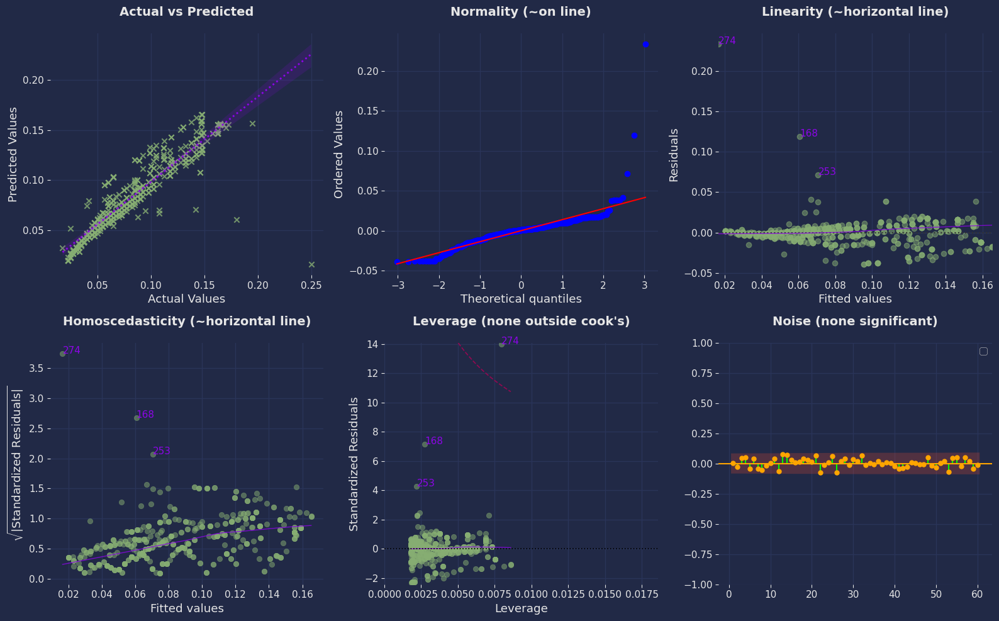

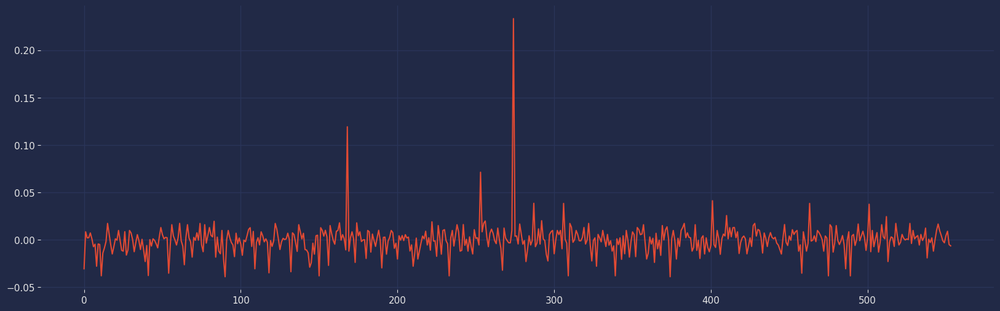

In [131]:
model = smf.ols('EstimatedLoss ~ EstimatedEffectiveYield', preDF).fit(cov_type='HC1', use_t=True)
print(model.summary())
SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:          EstimatedLoss   R-squared:                       0.102
Model:                            OLS   Adj. R-squared:                  0.100
Method:                 Least Squares   F-statistic:                     56.02
Date:                Fri, 19 Apr 2024   Prob (F-statistic):           2.85e-13
Time:                        09:02:54   Log-Likelihood:                 990.49
No. Observations:                 554   AIC:                            -1977.
Df Residuals:                     552   BIC:                            -1968.
Df Model:                           1                                         
Covariance Type:                  HC1                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0795      0.002     38.873      0.0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


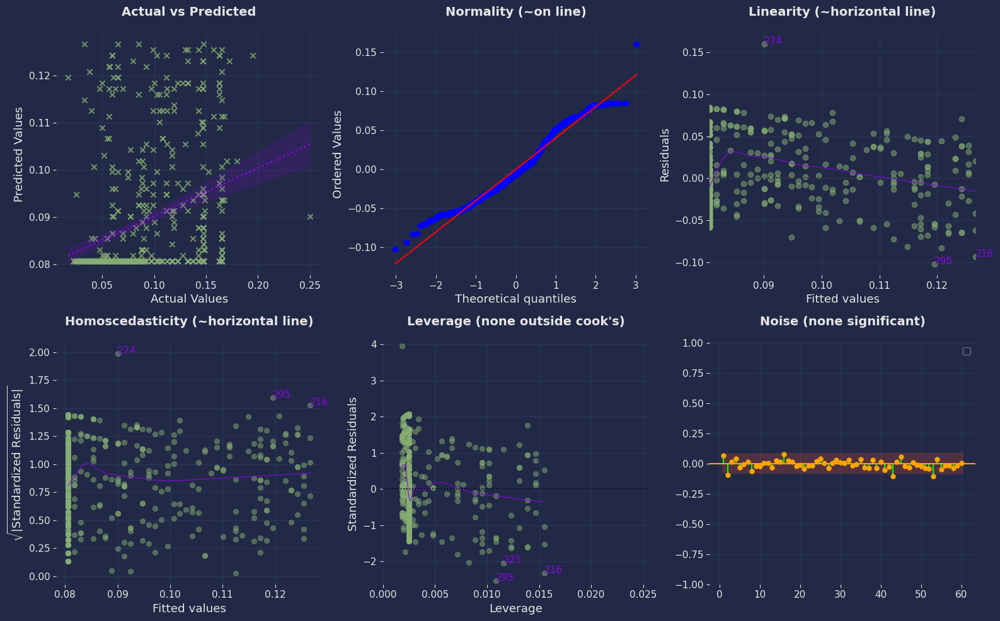

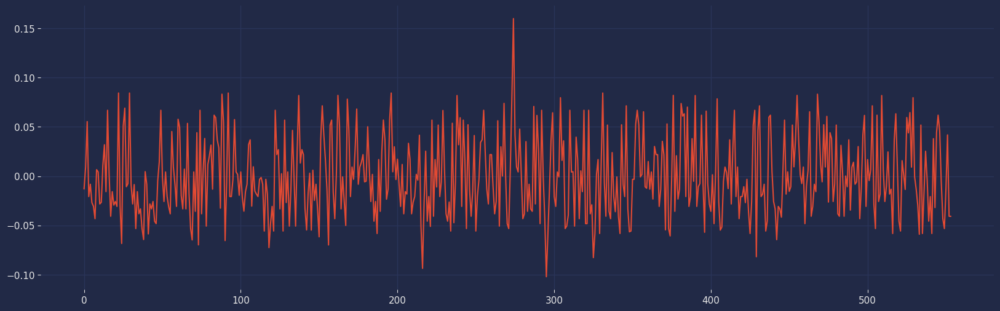

In [132]:
model = smf.ols('EstimatedLoss ~ Investors', preDF).fit(cov_type='HC1', use_t=True)
print(model.summary())
SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

                            OLS Regression Results                            
Dep. Variable:          EstimatedLoss   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                   0.04684
Date:                Fri, 19 Apr 2024   Prob (F-statistic):              0.829
Time:                        09:02:55   Log-Likelihood:                 960.81
No. Observations:                 554   AIC:                            -1918.
Df Residuals:                     552   BIC:                            -1909.
Df Model:                           1                                         
Covariance Type:                  HC1                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0879      0.006     15.654      0.0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


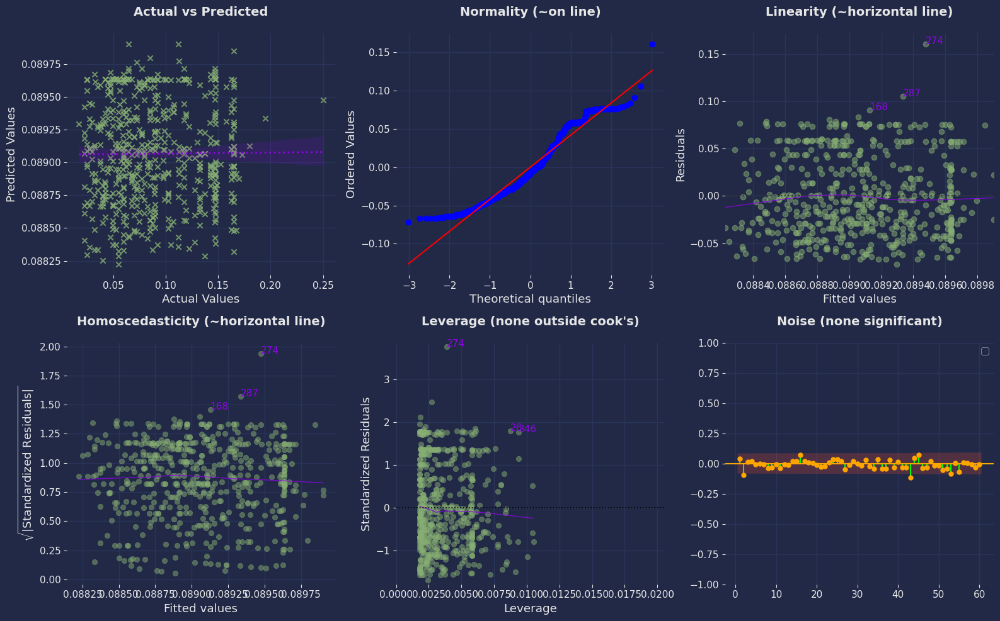

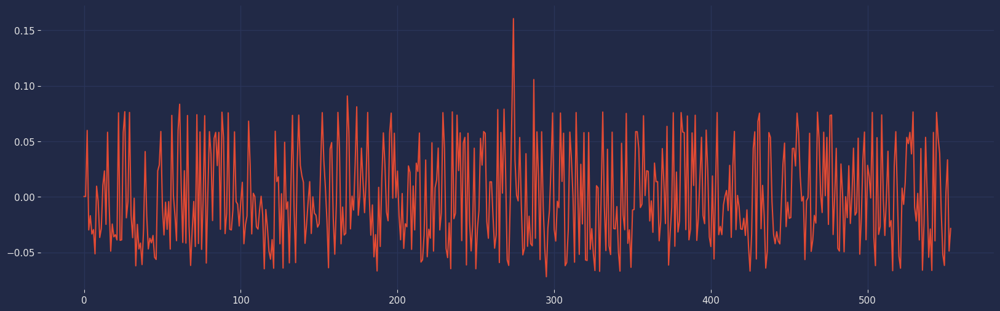

In [133]:
model = smf.ols('EstimatedLoss ~ APR', preDF).fit(cov_type='HC1', use_t=True)
print(model.summary())
SST = model.centered_tss
SSR = model.ssr
SSE = model.mse_model
MSE = model.mse_resid

print('====================================')
print(f'SST: {round(SST, 2)}\nSSE: {round(SSE, 2)}\nMSE_resid: {round(MSE, 2)}\nSSR: {round(SSR, 2)}')
print('====================================')

cls = LinearRegDiagnostic(model)
vif, fig, ax = cls()

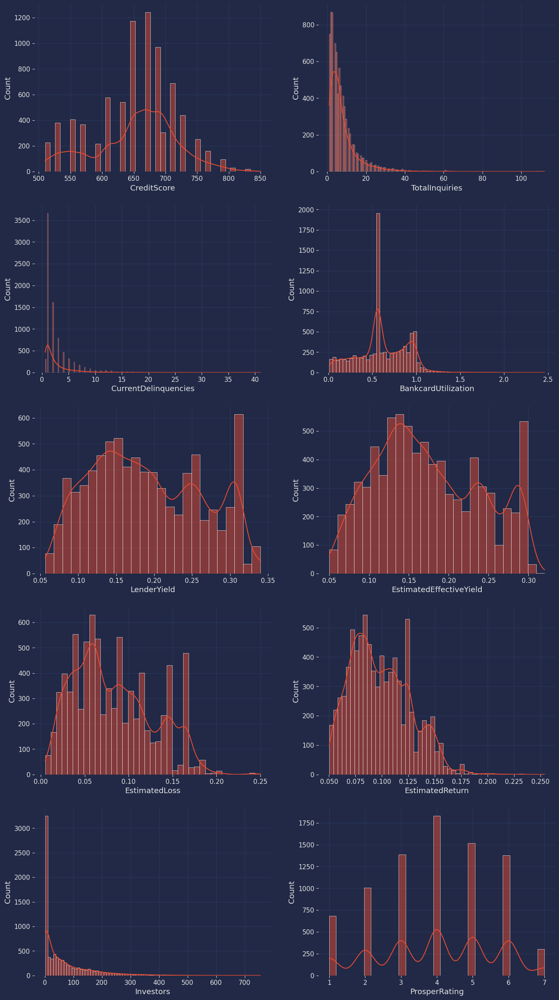

In [134]:
fig, axs = plt.subplots(5, 2, figsize=(16, 30))
sns.histplot(risky['CreditScore'], kde=True, ax=axs[0, 0])
sns.histplot(risky['TotalInquiries'], kde=True, ax=axs[0, 1])
sns.histplot(risky['CurrentDelinquencies'], kde=True, ax=axs[1, 0])
sns.histplot(risky['BankcardUtilization'], kde=True, ax=axs[1, 1])
sns.histplot(risky['LenderYield'], kde=True, ax=axs[2, 0])
sns.histplot(risky['EstimatedEffectiveYield'], kde=True, ax=axs[2, 1])
sns.histplot(risky['EstimatedLoss'], kde=True, ax=axs[3, 0])
sns.histplot(risky['EstimatedReturn'], kde=True, ax=axs[3, 1])
sns.histplot(risky['Investors'], kde=True, ax=axs[4, 0])
sns.histplot(risky['ProsperRating'], kde=True, ax=axs[4, 1])
plt.show()

## Preparing Samples for Hypothesis Testing

In [135]:
# Creating groups of equal sizes for hypothesis tests
ogHT = filtered_df.merge(og, on='PK', how='inner')
ogHT.rename({'ListingCategory (numeric)':'ListingCategory', 'ProsperRating (numeric)':'ProsperRating', 'BorrowerAPR':'APR',
             'BorrowerRate':'Rate'}, axis=1, inplace=True)
ogHT.drop(['PK', 'ProsperScore', 'EmploymentStatus', 'IncomeRange', 'ListingCategory', 'Recommendations', 'IncomeVerifiable', 'Rate'], axis=1, inplace=True)
ogHT.dropna(inplace=True)
print(ogHT.shape)
print(ogHT.isna().sum())
print(ogHT.columns)

(57212, 18)
LoanStatus                    0
APR                           0
LoanOriginalAmount            0
OpenCreditLines               0
TotalCreditLinespast7years    0
TotalInquiries                0
CurrentDelinquencies          0
AmountDelinquent              0
BankcardUtilization           0
TotalTrades                   0
DebtToIncomeRatio             0
CreditScore                   0
LenderYield                   0
ProsperRating                 0
EstimatedLoss                 0
EstimatedReturn               0
EstimatedEffectiveYield       0
Investors                     0
dtype: int64
Index(['LoanStatus', 'APR', 'LoanOriginalAmount', 'OpenCreditLines',
       'TotalCreditLinespast7years', 'TotalInquiries', 'CurrentDelinquencies',
       'AmountDelinquent', 'BankcardUtilization', 'TotalTrades',
       'DebtToIncomeRatio', 'CreditScore', 'LenderYield', 'ProsperRating',
       'EstimatedLoss', 'EstimatedReturn', 'EstimatedEffectiveYield',
       'Investors'],
      dtype='object'

In [136]:
HTrisky = ogHT[['LoanStatus', 'CreditScore', 'ProsperRating', 'APR', 'OpenCreditLines', 'TotalInquiries', 'TotalTrades', 'CurrentDelinquencies', 'Investors',
                    'AmountDelinquent', 'BankcardUtilization', 'DebtToIncomeRatio', 'LenderYield', 'EstimatedReturn', 'EstimatedLoss']]
HTrisky = credit_rates(HTrisky)
HTrisky.drop(HTrisky[HTrisky['LoanStatus']=='Cancelled'].index, inplace=True)
HTrisky.CreditScore.value_counts()

CreditScore
Good           31002
Fair           10748
Very Good      10234
Poor            2824
Exceptional     2401
Name: count, dtype: int64

In [137]:
# Credit Score Samples
test_sample_pX = HTrisky[HTrisky['CreditScore']=='Poor'].sample(2401, random_state=12)
test_sample_fX = HTrisky[HTrisky['CreditScore']=='Fair'].sample(2401, random_state=12)
test_sample_gX = HTrisky[HTrisky['CreditScore']=='Good'].sample(2401, random_state=12)
test_sample_vgX = HTrisky[HTrisky['CreditScore']=='Very Good'].sample(2401, random_state=12)
test_sample_eX = HTrisky[HTrisky['CreditScore']=='Exceptional']
HTrisky = pd.concat([test_sample_pX, test_sample_fX, test_sample_gX, test_sample_vgX, test_sample_eX])
HTrisky.shape

(12005, 15)

In [138]:
HTrisky2 = ogHT[['LoanStatus', 'CreditScore', 'ProsperRating', 'APR', 'OpenCreditLines', 'TotalInquiries', 'TotalTrades', 'CurrentDelinquencies', 'Investors',
                    'AmountDelinquent', 'BankcardUtilization', 'DebtToIncomeRatio', 'LenderYield', 'EstimatedReturn', 'EstimatedLoss']]
HTrisky2.CreditScore.value_counts()
HTrisky2.ProsperRating.value_counts()

ProsperRating
4.0    12386
5.0    10545
6.0     9843
3.0     9588
2.0     6530
1.0     4684
7.0     3636
Name: count, dtype: int64

In [139]:
# Prosper Rating Samples
test_sample_1 = HTrisky2[HTrisky2['ProsperRating']==1].sample(3636, random_state=12)
test_sample_2 = HTrisky2[HTrisky2['ProsperRating']==2].sample(3636, random_state=12)
test_sample_3 = HTrisky2[HTrisky2['ProsperRating']==3].sample(3636, random_state=12)
test_sample_4 = HTrisky2[HTrisky2['ProsperRating']==4].sample(3636, random_state=12)
ttest_sample_5 = HTrisky2[HTrisky2['ProsperRating']==5].sample(3636, random_state=12)
test_sample_6 = HTrisky2[HTrisky2['ProsperRating']==6].sample(3636, random_state=12)
test_sample_7 = HTrisky2[HTrisky2['ProsperRating']==7].sample(3636, random_state=12)
HTrisky2 = pd.concat([test_sample_1, test_sample_2, test_sample_3, test_sample_4, ttest_sample_5, test_sample_6, test_sample_7])
HTrisky2.shape

(25452, 15)

In [140]:
HT1P = []
HT1F = []
HT1G = []
HT1VG = []
HT1E = []
for c, group in enumerate(HTrisky.CreditScore.unique()):
    if c==0:
        for col in HTrisky.columns:
            if col not in ['CreditScore', 'ProsperRating', 'LoanStatus']:
                HT1P.append(np.array(HTrisky.loc[HTrisky['CreditScore']=='Poor', col]))
    elif c==1:
        for col in HTrisky.columns:
            if col not in ['CreditScore', 'ProsperRating', 'LoanStatus']:
                HT1F.append(np.array(HTrisky.loc[HTrisky['CreditScore']=='Fair', col]))  
    elif c==2:
        for col in HTrisky.columns:
            if col not in ['CreditScore', 'ProsperRating', 'LoanStatus']:
                HT1G.append(np.array(HTrisky.loc[HTrisky['CreditScore']=='Good', col]))
    elif c==3:
        for col in HTrisky.columns:
            if col not in ['CreditScore', 'ProsperRating', 'LoanStatus']:
                HT1VG.append(np.array(HTrisky.loc[HTrisky['CreditScore']=='Very Good', col]))
    elif c==4:
        for col in HTrisky.columns:
            if col not in ['CreditScore', 'ProsperRating', 'LoanStatus']:
                HT1E.append(np.array(HTrisky.loc[HTrisky['CreditScore']=='Exceptional', col]))  
    else:
        print('error')
                         
megaHT1 = np.array([HT1P, HT1F, HT1G, HT1VG, HT1E])

HT1 = []
HT2 = []
HT3 = []
HT4 = []
HT5 = []
HT6 = []
HT7 = []
for c, group in enumerate(HTrisky.ProsperRating.unique()):
    if c==0:
        for col in HTrisky.columns:
            if col not in ['CreditScore', 'ProsperRating', 'LoanStatus']:
                HT1.append(np.array(HTrisky.loc[HTrisky['ProsperRating']==1, col]))
    elif c==1:
        for col in HTrisky.columns:
            if col not in ['CreditScore', 'ProsperRating', 'LoanStatus']:
                HT2.append(np.array(HTrisky.loc[HTrisky['ProsperRating']==2, col]))                
    elif c==2:
        for col in HTrisky.columns:
            if col not in ['CreditScore', 'ProsperRating', 'LoanStatus']:
                HT3.append(np.array(HTrisky.loc[HTrisky['ProsperRating']==3, col]))
    elif c==3:
        for col in HTrisky.columns:
            if col not in ['CreditScore', 'ProsperRating', 'LoanStatus']:
                HT4.append(np.array(HTrisky.loc[HTrisky['ProsperRating']==4, col]))
    elif c==4:
        for col in HTrisky.columns:
            if col not in ['CreditScore', 'ProsperRating', 'LoanStatus']:
                HT5.append(np.array(HTrisky.loc[HTrisky['ProsperRating']==5, col]))                
    elif c==5:
        for col in HTrisky.columns:
            if col not in ['CreditScore', 'ProsperRating', 'LoanStatus']:
                HT6.append(np.array(HTrisky.loc[HTrisky['ProsperRating']==6, col]))                
    elif c==6:
        for col in HTrisky.columns:
            if col not in ['CreditScore', 'ProsperRating', 'LoanStatus']:
                HT7.append(np.array(HTrisky.loc[HTrisky['ProsperRating']==7, col]))
    else:
        print('error')
                         
megaHT2 = [HT1, HT2, HT3, HT4, HT5, HT6, HT7]

In [141]:
print(len(HT1))
print(len(megaHT2))
print(len(HT1P))
print(len(megaHT1))

12
7
12
5


## Hypothesis Testing #1 - Credit Score
Since linearity doesn't exist among correlations of interest, risk will be measured through T-tests and ANOVA or non-parametric versions. This provides further insight into which Credit Scores are poised to cause monetary loss.

In [142]:
HT_columns = ['APR', 'OpenCreditLines', 'TotalInquiries',
       'TotalTrades', 'CurrentDelinquencies', 'Investors',
       'AmountDelinquent', 'BankcardUtilization', 'DebtToIncomeRatio',
       'LenderYield', 'EstimatedReturn', 'EstimatedLoss']

for c, col in enumerate(HT_columns):
    statistic_2, p_value_2 = levene(HT1P[c], HT1F[c], HT1G[c], HT1VG[c], HT1E[c])
    print(f"GROUP: {HT_columns[c]}")
    print("statistic:", round(statistic_2, 3))
    print("p-value:", round(p_value_2, 10))
    if p_value_2 > alpha:
        print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
    else:
        print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")

GROUP: APR
statistic: 116.741
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: OpenCreditLines
statistic: 50.488
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: TotalInquiries
statistic: 240.844
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: TotalTrades
statistic: 2.158
p-value: 0.0710694084
SIGNIFICANCE NOT DETECTED

GROUP: CurrentDelinquencies
statistic: 1230.83
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: Investors
statistic: 0.258
p-value: 0.9049721515
SIGNIFICANCE NOT DETECTED

GROUP: AmountDelinquent
statistic: 25.378
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: BankcardUtilization
statistic: 98.424
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: DebtToIncomeRatio
statistic: 2.181
p-value: 0.0684851666
SIGNIFICANCE NOT DETECTED

GROUP: LenderYield
statistic: 0.616
p-value: 0.6507531982
SIGNIFICANCE NOT DETECTED

GROUP: EstimatedReturn
statistic: 1.244
p-value: 0.2897466426
SIGNIFICANCE NOT DETECTED

GROUP: EstimatedLoss
statistic: 0.957
p-value: 0.4298215572
SIGNIFICANCE NOT DETECTED



In [143]:
for c, col in enumerate(HT_columns):
    statistic_2, p_value_2 = kruskal(HT1P[c], HT1F[c], HT1G[c], HT1VG[c], HT1E[c])
    print(f"GROUP: {HT_columns[c]}")
    print("statistic:", round(statistic_2, 3))
    print("p-value:", round(p_value_2, 10))
    if p_value_2 > alpha:
        print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
    else:
        print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")

GROUP: APR
statistic: 5119.081
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: OpenCreditLines
statistic: 339.71
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: TotalInquiries
statistic: 2275.234
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: TotalTrades
statistic: 8.615
p-value: 0.0714784823
SIGNIFICANCE NOT DETECTED

GROUP: CurrentDelinquencies
statistic: 4440.88
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: Investors
statistic: 5.272
p-value: 0.2604860867
SIGNIFICANCE NOT DETECTED

GROUP: AmountDelinquent
statistic: 4052.217
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: BankcardUtilization
statistic: 3493.793
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: DebtToIncomeRatio
statistic: 11.481
p-value: 0.0216571962
SIGNIFICANCE DETECTED

GROUP: LenderYield
statistic: 1.574
p-value: 0.8135247803
SIGNIFICANCE NOT DETECTED

GROUP: EstimatedReturn
statistic: 1.612
p-value: 0.8066380714
SIGNIFICANCE NOT DETECTED

GROUP: EstimatedLoss
statistic: 1.255
p-value: 0.8689476229
SIGNIFICANCE NOT DETECTED



### Significance Detected
* None in TotalTrades or DebtToIncomeRation
* Non homoscedastic: TotalTrades, Investors, DebtToIncomeRatio, LenderYield, EstimatedReturn
* In APR, OpenCreditLines, TotalInquiries, CurrentDelinquencies, AmountDelinquent, BankcardUtilization
### Now investigating relationship of Credit Score on risk features

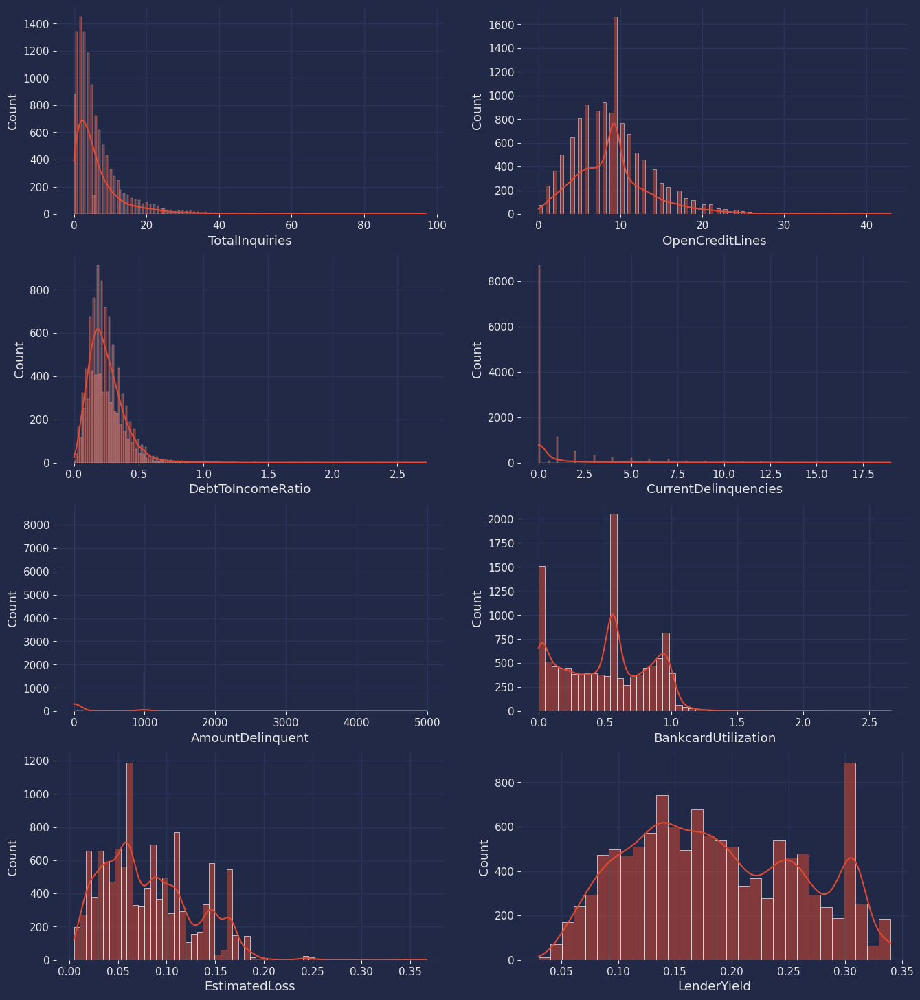

In [144]:
fig, axs = plt.subplots(4, 2, figsize=(16, 18))
sns.histplot(HTrisky.loc[HTrisky['TotalInquiries']<100, 'TotalInquiries'], kde=True, ax=axs[0, 0])
sns.histplot(HTrisky['OpenCreditLines'], kde=True, ax=axs[0, 1])
sns.histplot(HTrisky.loc[HTrisky['DebtToIncomeRatio']<3, 'DebtToIncomeRatio'], kde=True, ax=axs[1, 0])
sns.histplot(HTrisky.loc[HTrisky['CurrentDelinquencies']<20, 'CurrentDelinquencies'], kde=True, ax=axs[1, 1])
sns.histplot(HTrisky.loc[HTrisky['AmountDelinquent']<5000, 'AmountDelinquent'], kde=True, ax=axs[2, 0])
sns.histplot(HTrisky['BankcardUtilization'], kde=True, ax=axs[2, 1])
sns.histplot(HTrisky['EstimatedLoss'], kde=True, ax=axs[3, 0])
sns.histplot(HTrisky['LenderYield'], kde=True, ax=axs[3, 1])
plt.show()

In [145]:
# eliminating the significant outliers 
TI = HTrisky.loc[HTrisky['TotalInquiries']<20, ['TotalInquiries', 'CreditScore']].copy(deep=True)
DI = HTrisky.loc[HTrisky['DebtToIncomeRatio']<=.5, ['DebtToIncomeRatio', 'CreditScore']].copy(deep=True)
EL =  HTrisky.loc[HTrisky['EstimatedLoss']<=.2, ['EstimatedLoss', 'CreditScore']].copy(deep=True)
OC = HTrisky.loc[HTrisky['OpenCreditLines']<=20, ['OpenCreditLines', 'CreditScore']].copy(deep=True)
LY = HTrisky.loc[HTrisky['LenderYield']<.3, ['LenderYield', 'CreditScore']].copy(deep=True)
BU = HTrisky[['BankcardUtilization', 'CreditScore']]
Tsamples = [TI, DI, EL, OC, LY, BU]

for sam in Tsamples:
    print("σ =", round(sam.iloc[:, 0].std(), 3))
    print("μ =", round(sam.iloc[:, 0].mean(), 3))
    print("===========")

σ = 4.291
μ = 5.134
σ = 0.107
μ = 0.23
σ = 0.045
μ = 0.08
σ = 4.007
μ = 8.627
σ = 0.064
μ = 0.171
σ = 0.331
μ = 0.5


In [146]:
names = ['TotalInquiries', 'DebtToIncomeRatio', 'EstimatedLoss', 'OpenCreditLines', 'LenderYield', 'BankcardUtilization']
names_add = []
scores_add = []
CS = []
samp_scores = pd.DataFrame()
for c, samp in enumerate(Tsamples):
    for score in samp['CreditScore'].unique():
        AVG_s = samp.loc[samp['CreditScore']==score, names[c]].mean()
        names_add.append(names[c])
        scores_add.append(AVG_s)
        CS.append(str(score))
samp_scores['Sample'] = names_add  
samp_scores['AVG'] = scores_add
samp_scores['CreditScore'] = CS
samp_scores

,Sample,AVG,CreditScore
0,TotalInquiries,8.480,Poor
1,TotalInquiries,5.834,Fair
2,TotalInquiries,4.432,Good
3,TotalInquiries,3.862,Very Good
4,TotalInquiries,3.740,Exceptional
5,DebtToIncomeRatio,0.230,Poor
6,DebtToIncomeRatio,0.235,Fair
7,DebtToIncomeRatio,0.227,Good
8,DebtToIncomeRatio,0.232,Very Good
9,DebtToIncomeRatio,0.226,Exceptional


### Verifying samples aren't symptomatic of Simpson's Paradox

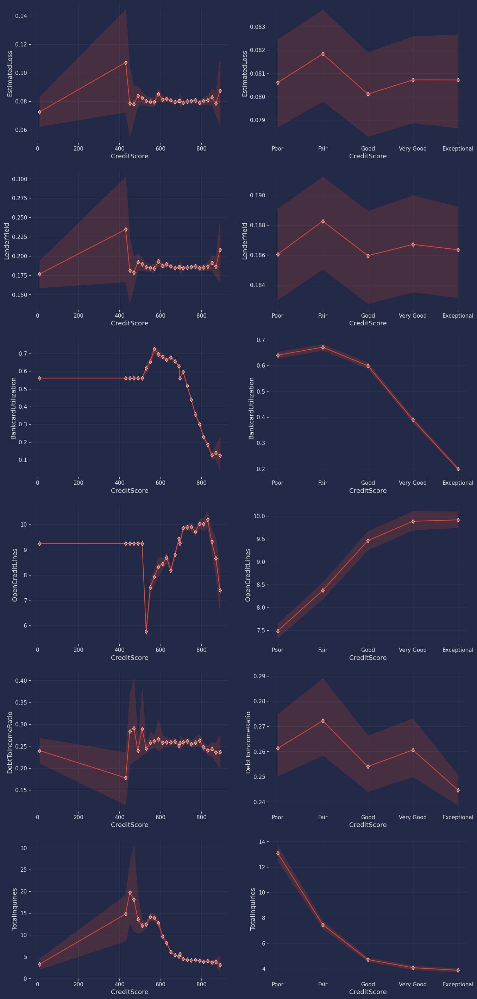

In [147]:
['TotalInquiries', 'DebtToIncomeRatio', 'EstimatedLoss', 'OpenCreditLines', 'LenderYield', 'BankcardUtilization']
fix, axs = plt.subplots(6,2,figsize=(16,36))
axs = axs.flatten()
sns.lineplot(ogHT, x='CreditScore', y='EstimatedLoss', ax=axs[0], marker='d')
sns.lineplot(HTrisky, x='CreditScore', y='EstimatedLoss', ax=axs[1], marker='d')
sns.lineplot(ogHT, x='CreditScore', y='LenderYield', ax=axs[2], marker='d')
sns.lineplot(HTrisky, x='CreditScore', y='LenderYield', ax=axs[3], marker='d')
sns.lineplot(ogHT, x='CreditScore', y='BankcardUtilization', ax=axs[4], marker='d')
sns.lineplot(HTrisky, x='CreditScore', y='BankcardUtilization', ax=axs[5], marker='d')
sns.lineplot(ogHT, x='CreditScore', y='OpenCreditLines', ax=axs[6], marker='d')
sns.lineplot(HTrisky, x='CreditScore', y='OpenCreditLines', ax=axs[7], marker='d')
sns.lineplot(ogHT, x='CreditScore', y='DebtToIncomeRatio', ax=axs[8], marker='d')
sns.lineplot(HTrisky, x='CreditScore', y='DebtToIncomeRatio', ax=axs[9], marker='d')
sns.lineplot(ogHT, x='CreditScore', y='TotalInquiries', ax=axs[10], marker='d')
sns.lineplot(HTrisky, x='CreditScore', y='TotalInquiries', ax=axs[11], marker='d')
plt.show()

### In regards to the risk assessment of loan defaults, no noteworthy relationship can be tested with this sample other than BankcardUtilization
This does pose a question. Does this non-practicality hold when loan status other than defaults are filtered? A sub-sample is commissioned and examined.

In [148]:
HTrisky.LoanStatus.value_counts()

LoanStatus
Completed                 4856
Current                   4391
Chargedoff                1677
Defaulted                  914
Past Due (1-15 days)        63
Past Due (31-60 days)       27
Past Due (61-90 days)       24
Past Due (91-120 days)      21
Past Due (16-30 days)       17
FinalPaymentInProgress      15
Name: count, dtype: int64

In [149]:
LSvals = []
for val in HTrisky.LoanStatus.unique():
    if val not in ["Completed", 'Cancelled', 'FinalPaymentInProgress']:
        HTrisky.replace({val:'Defaulted'}, inplace=True)
        
HTrisky.LoanStatus.value_counts()

LoanStatus
Defaulted                 7134
Completed                 4856
FinalPaymentInProgress      15
Name: count, dtype: int64

In [150]:
HTriskyDEF = HTrisky[HTrisky['LoanStatus']=='Defaulted'].copy(deep=True)
HTriskyDEF.LoanStatus.value_counts()

LoanStatus
Defaulted    7134
Name: count, dtype: int64

In [151]:
HTriskyDEF.CreditScore.value_counts()

CreditScore
Good           1733
Very Good      1502
Poor           1413
Fair           1383
Exceptional    1103
Name: count, dtype: int64

In [152]:
HTrisky.CreditScore.value_counts()

CreditScore
Poor           2401
Fair           2401
Good           2401
Very Good      2401
Exceptional    2401
Name: count, dtype: int64

In [153]:
# eliminating the significant outliers 
TI = HTriskyDEF.loc[HTriskyDEF['TotalInquiries']<20, ['TotalInquiries', 'CreditScore']].copy(deep=True)
DI = HTriskyDEF.loc[HTriskyDEF['DebtToIncomeRatio']<=.5, ['DebtToIncomeRatio', 'CreditScore']].copy(deep=True)
EL =  HTriskyDEF.loc[HTriskyDEF['EstimatedLoss']<=.2, ['EstimatedLoss', 'CreditScore']].copy(deep=True)
OC = HTriskyDEF.loc[HTriskyDEF['OpenCreditLines']<=20, ['OpenCreditLines', 'CreditScore']].copy(deep=True)
LY = HTriskyDEF.loc[HTriskyDEF['LenderYield']<.3, ['LenderYield', 'CreditScore']].copy(deep=True)
BU = HTriskyDEF[['BankcardUtilization', 'CreditScore']]
Tsamples = [TI, DI, EL, OC, LY, BU]

for sam in Tsamples:
    print("σ =", round(sam.iloc[:, 0].std(), 3))
    print("μ =", round(sam.iloc[:, 0].mean(), 3))
    print("===========")

σ = 4.249
μ = 5.054
σ = 0.107
μ = 0.229
σ = 0.045
μ = 0.079
σ = 4.065
μ = 8.877
σ = 0.063
μ = 0.17
σ = 0.326
μ = 0.526


In [154]:
names = ['TotalInquiries', 'DebtToIncomeRatio', 'EstimatedLoss', 'OpenCreditLines', 'LenderYield', 'BankcardUtilization']
names_add = []
scores_add = []
CS = []
samp_scores = pd.DataFrame()
for c, samp in enumerate(Tsamples):
    for score in samp['CreditScore'].unique():
        AVG_s = samp.loc[samp['CreditScore']==score, names[c]].mean()
        names_add.append(names[c])
        scores_add.append(AVG_s)
        CS.append(str(score))
samp_scores['Sample'] = names_add  
samp_scores['AVG'] = scores_add
samp_scores['CreditScore'] = CS
samp_scores

,Sample,AVG,CreditScore
0,TotalInquiries,8.702,Poor
1,TotalInquiries,5.686,Fair
2,TotalInquiries,4.315,Good
3,TotalInquiries,3.785,Very Good
4,TotalInquiries,3.554,Exceptional
5,DebtToIncomeRatio,0.230,Poor
6,DebtToIncomeRatio,0.234,Fair
7,DebtToIncomeRatio,0.227,Good
8,DebtToIncomeRatio,0.229,Very Good
9,DebtToIncomeRatio,0.224,Exceptional


### Well, thats a bummer
In the population and defualted sample, no practical relationship exists regarding Credit Scores on anticipatable risk besides BankcardUtilization. If this is the case, then why do moderate correlations exist for columns in the SweetViz report but not here - such as EstimatedLoss & LenderYield? Is it from binning Credit Scores into a categorical? Is the sample experiencing Simpson's Paradox?

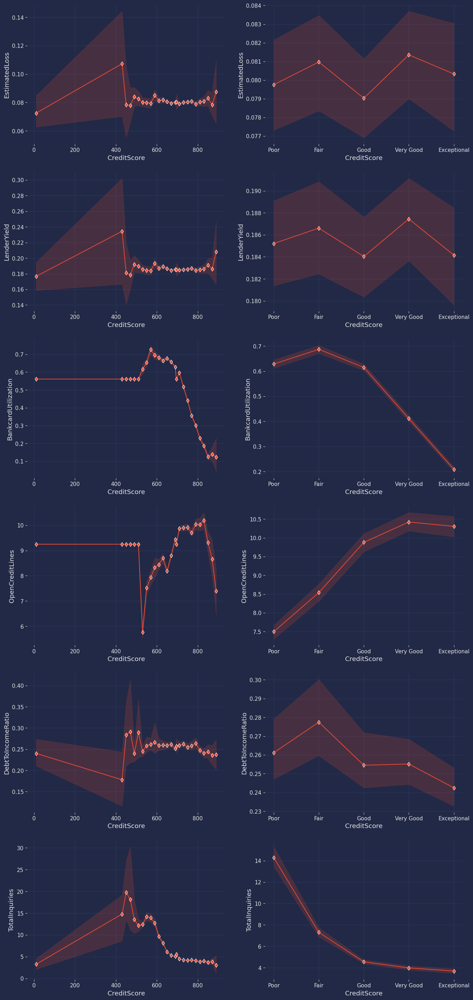

In [155]:
fix, axs = plt.subplots(6,2,figsize=(16,36))
axs = axs.flatten()
sns.lineplot(ogHT, x='CreditScore', y='EstimatedLoss', ax=axs[0], marker='d')
sns.lineplot(HTriskyDEF, x='CreditScore', y='EstimatedLoss', ax=axs[1], marker='d')
sns.lineplot(ogHT, x='CreditScore', y='LenderYield', ax=axs[2], marker='d')
sns.lineplot(HTriskyDEF, x='CreditScore', y='LenderYield', ax=axs[3], marker='d')
sns.lineplot(ogHT, x='CreditScore', y='BankcardUtilization', ax=axs[4], marker='d')
sns.lineplot(HTriskyDEF, x='CreditScore', y='BankcardUtilization', ax=axs[5], marker='d')
sns.lineplot(ogHT, x='CreditScore', y='OpenCreditLines', ax=axs[6], marker='d')
sns.lineplot(HTriskyDEF, x='CreditScore', y='OpenCreditLines', ax=axs[7], marker='d')
sns.lineplot(ogHT, x='CreditScore', y='DebtToIncomeRatio', ax=axs[8], marker='d')
sns.lineplot(HTriskyDEF, x='CreditScore', y='DebtToIncomeRatio', ax=axs[9], marker='d')
sns.lineplot(ogHT, x='CreditScore', y='TotalInquiries', ax=axs[10], marker='d')
sns.lineplot(HTriskyDEF, x='CreditScore', y='TotalInquiries', ax=axs[11], marker='d')
plt.show()

In [156]:
print(len(BU.BankcardUtilization))
print(len(BU.query('(CreditScore == "Poor") | (CreditScore == "Fair")')['BankcardUtilization']))

7134
2796


In [157]:
PF = BU.query('(CreditScore == "Poor") | (CreditScore == "Fair")')['BankcardUtilization']
PF.mean()

0.6574579684391063

In [202]:
BU.BankcardUtilization.mean()

0.5259588374650277

### Correlation Inaccuracy in SweetViz - From CreditScore binning
### BankcardUtilization T-test
Is Poor and Fair means of BankcardUtilization significantlty greater than the population mean? A test will be conducted for each. The other scores aren't included since they aren't conventionally considered as risky.
* Poor & Fair x̄: .657 | Population μ: .526
* null hypothesis: μ >= .657
* alternate hypothesis: μ < .657

In [190]:
X = BU.BankcardUtilization
Y = PF.mean()
alpha=.025
t_score = 1.960
t_statistic, p_value = stats.ttest_1samp(X, Y, alternative='less')
sample_std = np.std(X) 
n = len(X)
# standard error
sem = sample_std / np.sqrt(n)
# Confidence interval
ci_lower = Y - t_score * sem
ci_upper = Y + t_score * sem

if p_value > alpha:
    print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
else:
    print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")
    
print("T-statistic:", round(t_statistic, 3))
print("P-value:", p_value)
print("Standard error:", round(sem, 7))
print("Confidence Interval Upper:", round(ci_upper, 5))
print("Confidence Interval Lower:", round(ci_lower, 5))
print(f'Score: {round((Y-X.mean())/sample_std, 3)}')

SIGNIFICANCE DETECTED

T-statistic: -34.085
P-value: 2.3636337054253025e-236
Standard error: 0.0038577
Confidence Interval Upper: 0.66502
Confidence Interval Lower: 0.6499
Score: 0.404


In [159]:
percentilesPRE = sorted([round(i, 2) for i in ogHT.BankcardUtilization])
len(percentilesPRE)

57212

In [160]:
percentilesPRE2 = []
for val in percentilesPRE:
    percentilesPRE2.append(val)
percentilesPRE2 = np.array(percentilesPRE2)
percentilesPRE2

array([0.  , 0.  , 0.  , ..., 2.36, 2.46, 2.66])

In [161]:
percentiles = []
for c, val in enumerate(percentilesPRE2):
    percentiles.append((c+1)/len(percentilesPRE2))
percentileDF = pd.DataFrame({'Value':percentilesPRE2, 'Percentile':percentiles})
percentileDF

,Value,Percentile
0,0.00,1.748e-05
1,0.00,3.496e-05
2,0.00,5.244e-05
3,0.00,6.992e-05
4,0.00,8.739e-05
...,...,...
57207,1.99,9.999e-01
57208,2.07,9.999e-01
57209,2.36,1.000e+00
57210,2.46,1.000e+00


In [162]:
percentileDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57212 entries, 0 to 57211
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Value       57212 non-null  float64
 1   Percentile  57212 non-null  float64
dtypes: float64(2)
memory usage: 894.1 KB


In [163]:
percentileDF['Value'] = percentileDF['Value'].astype(float)
PFA = HTrisky.query('(CreditScore =="Poor") | (CreditScore =="Fair")')['BankcardUtilization'].mean()
GVA = HTrisky.query('(CreditScore =="Good") | (CreditScore =="VeryGood")')['BankcardUtilization'].mean()
EA = HTrisky.query('(CreditScore =="Exceptional")')['BankcardUtilization'].mean()

In [164]:
plotP = ogHT.copy(deep=True)
categories_to_drop.remove('Current')
plotP = plotP[~plotP['LoanStatus'].isin(categories_to_drop)]
plotP.replace('Chargedoff', 'Defaulted', inplace=True)
plotP.drop(plotP[plotP['CreditScore']==10].index, inplace=True)
plotP = credit_rates(plotP)
plotP.LoanStatus.unique()

array(['Current', 'Completed', 'Defaulted'], dtype=object)

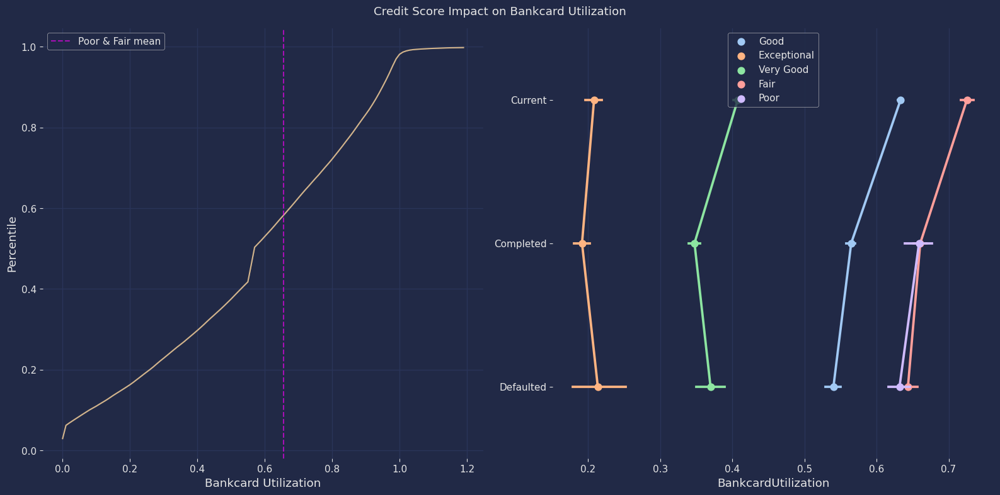

In [165]:
fig, axs = plt.subplots(1, 2, figsize=(16,8))
sns.lineplot(percentileDF[percentileDF['Value']<1.2], x='Value', y='Percentile', color='tan', ax=axs[0])
axs[0].axvline(x=PFA, c='fuchsia', label='Poor & Fair mean', alpha=.6, linestyle='--')
axs[0].set_xlabel('Bankcard Utilization')
axs[0].legend(loc='upper left')

sns.pointplot(plotP, hue='CreditScore', y='LoanStatus', x='BankcardUtilization', errorbar=('ci', 95), ax=axs[1], palette='pastel')

plt.suptitle('Credit Score Impact on Bankcard Utilization')
axs[1].set_ylabel('')
axs[1].legend(loc='upper center')

plt.tight_layout()
plt.show()

## Hypothesis Testing #2 - Prosper Rating
Since linearity doesn't exist among correlations of interest, risk will be measured through T-tests and ANOVA or non-parametric versions. This provides further insight into which Prosper Ratings are poised to cause monetary loss.

In [166]:
for c, col in enumerate(HT_columns):
    statistic_2, p_value_2 = levene(HT1[c], HT2[c], HT3[c], HT4[c], HT5[c], HT6[c], HT7[c])
    print(f"GROUP: {HT_columns[c]}")
    print("statistic:", round(statistic_2, 3))
    print("p-value:", round(p_value_2, 10))
    if p_value_2 > alpha:
        print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
    else:
        print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")

GROUP: APR
statistic: 0.551
p-value: 0.7694989052
SIGNIFICANCE NOT DETECTED

GROUP: OpenCreditLines
statistic: 2.426
p-value: 0.0240546734
SIGNIFICANCE DETECTED

GROUP: TotalInquiries
statistic: 1.342
p-value: 0.2342980223
SIGNIFICANCE NOT DETECTED

GROUP: TotalTrades
statistic: 1.158
p-value: 0.325839609
SIGNIFICANCE NOT DETECTED

GROUP: CurrentDelinquencies
statistic: 0.496
p-value: 0.8119796591
SIGNIFICANCE NOT DETECTED

GROUP: Investors
statistic: 270.781
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: AmountDelinquent
statistic: 1.105
p-value: 0.3563777469
SIGNIFICANCE NOT DETECTED

GROUP: BankcardUtilization
statistic: 0.192
p-value: 0.9791462017
SIGNIFICANCE NOT DETECTED

GROUP: DebtToIncomeRatio
statistic: 1.001
p-value: 0.4222902937
SIGNIFICANCE NOT DETECTED

GROUP: LenderYield
statistic: 150.015
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: EstimatedReturn
statistic: 147.436
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: EstimatedLoss
statistic: 95.219
p-value: 0.0
SIGNIFICANCE DETECTED


In [167]:
for c, col in enumerate(HT_columns):
    statistic_2, p_value_2 = kruskal(HT1[c], HT2[c], HT3[c], HT4[c], HT5[c], HT6[c], HT7[c])
    print(f"GROUP: {HT_columns[c]}")
    print("statistic:", round(statistic_2, 3))
    print("p-value:", round(p_value_2, 10))
    if p_value_2 > alpha:
        print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
    else:
        print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")

GROUP: APR
statistic: 2.14
p-value: 0.9063714104
SIGNIFICANCE NOT DETECTED

GROUP: OpenCreditLines
statistic: 2.441
p-value: 0.8750075333
SIGNIFICANCE NOT DETECTED

GROUP: TotalInquiries
statistic: 3.774
p-value: 0.7072329086
SIGNIFICANCE NOT DETECTED

GROUP: TotalTrades
statistic: 4.921
p-value: 0.5539645522
SIGNIFICANCE NOT DETECTED

GROUP: CurrentDelinquencies
statistic: 3.192
p-value: 0.7844481696
SIGNIFICANCE NOT DETECTED

GROUP: Investors
statistic: 783.929
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: AmountDelinquent
statistic: 4.213
p-value: 0.6478440751
SIGNIFICANCE NOT DETECTED

GROUP: BankcardUtilization
statistic: 3.231
p-value: 0.779317573
SIGNIFICANCE NOT DETECTED

GROUP: DebtToIncomeRatio
statistic: 9.828
p-value: 0.1320962104
SIGNIFICANCE NOT DETECTED

GROUP: LenderYield
statistic: 10999.261
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: EstimatedReturn
statistic: 6998.283
p-value: 0.0
SIGNIFICANCE DETECTED

GROUP: EstimatedLoss
statistic: 11663.606
p-value: 0.0
SIGNIFICANCE 

### Significance Detected
* Non homoscedastic: Investors, DebtToIncomeRatio, LenderYield, EstimatedReturn, EstimatedLoss
* None in DebtToIncomeRatio, BankcardUtilization, AmountDelinquent, CurrentDelinquencies, TotalTrades, TotalInquiries, OpenCreditLines, APR
* In Investors, LenderYield, EstimatedReturn, EstimatedLoss
### Ensuring Samples don't exhibit Simpsons Paradox

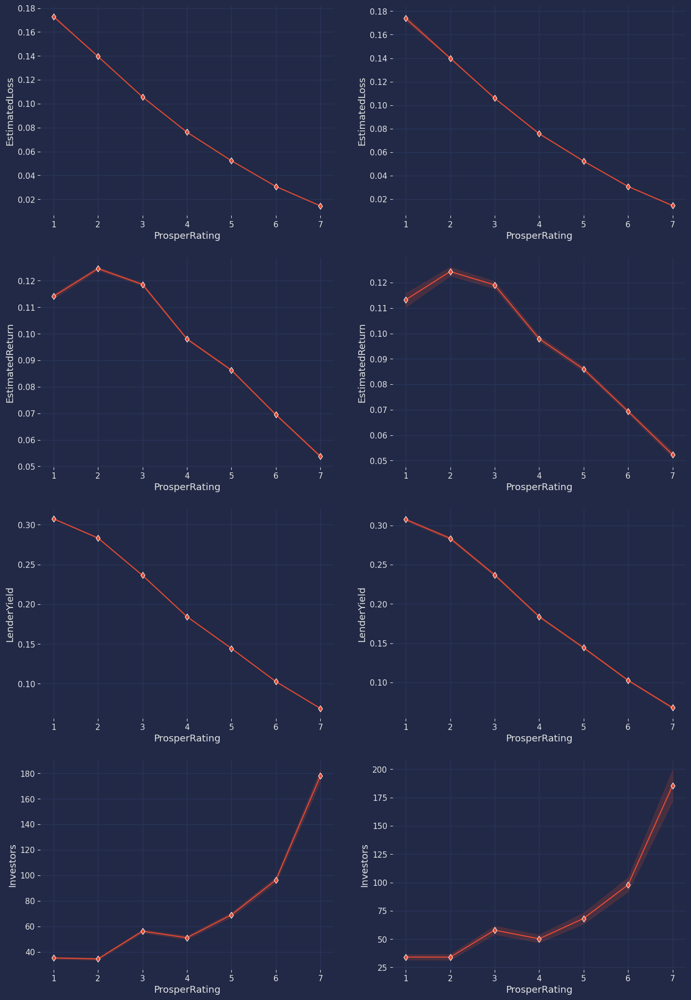

In [168]:
fix, axs = plt.subplots(4,2,figsize=(16,24))
axs = axs.flatten()
sns.lineplot(ogHT, x='ProsperRating', y='EstimatedLoss', ax=axs[0], marker='d')
sns.lineplot(HTriskyDEF, x='ProsperRating', y='EstimatedLoss', ax=axs[1], marker='d')
sns.lineplot(ogHT, x='ProsperRating', y='EstimatedReturn', ax=axs[2], marker='d')
sns.lineplot(HTriskyDEF, x='ProsperRating', y='EstimatedReturn', ax=axs[3], marker='d')
sns.lineplot(ogHT, x='ProsperRating', y='LenderYield', ax=axs[4], marker='d')
sns.lineplot(HTriskyDEF, x='ProsperRating', y='LenderYield', ax=axs[5], marker='d')
sns.lineplot(ogHT, x='ProsperRating', y='Investors', ax=axs[6], marker='d')
sns.lineplot(HTriskyDEF, x='ProsperRating', y='Investors', ax=axs[7], marker='d')
plt.show()

In [169]:
HTriskyDEF.describe()

,ProsperRating,APR,OpenCreditLines,TotalInquiries,TotalTrades,CurrentDelinquencies,Investors,AmountDelinquent,BankcardUtilization,DebtToIncomeRatio,LenderYield,EstimatedReturn,EstimatedLoss
count,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000
mean,4.076,0.220,9.329,6.758,24.056,1.288,68.238,1056.905,0.526,0.259,0.186,0.096,0.080
std,1.671,0.083,4.818,10.244,11.597,3.408,93.936,6260.768,0.326,0.305,0.075,0.031,0.047
min,1.000,0.009,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.033,-0.135,0.005
25%,3.000,0.152,6.000,2.000,15.000,0.000,1.000,0.000,0.250,0.150,0.126,0.074,0.042
50%,4.000,0.216,9.000,4.000,23.000,0.000,32.000,0.000,0.561,0.220,0.177,0.091,0.070
75%,5.000,0.293,11.000,8.000,31.000,1.000,98.000,208.000,0.800,0.320,0.247,0.116,0.112
max,7.000,0.414,43.000,379.000,93.000,45.000,881.000,230291.000,2.360,10.010,0.340,0.257,0.366


In [170]:
names = ['Investors', 'EstimatedLoss', 'EstimatedReturn', 'LenderYield']
# eliminating the significant outliers distorted the results too far
IN = HTriskyDEF.loc[:, ['Investors', 'ProsperRating']].copy(deep=True)
EL =  HTriskyDEF.loc[:, ['EstimatedLoss', 'ProsperRating']].copy(deep=True)
LY = HTriskyDEF.loc[:, ['LenderYield', 'ProsperRating']].copy(deep=True)
ER = HTriskyDEF.loc[:, ['EstimatedReturn', 'ProsperRating']].copy(deep=True)
Tsamples = [IN, EL, ER, LY]

for sam in Tsamples:
    print("σ =", round(sam.iloc[:, 0].std(), 3))
    print("μ =", round(sam.iloc[:, 0].mean(), 3))
    print("===========")

σ = 93.936
μ = 68.238
σ = 0.047
μ = 0.08
σ = 0.031
μ = 0.096
σ = 0.075
μ = 0.186


In [171]:
names_add = []
scores_add = []
CS = []
samp_scores = pd.DataFrame()
for c, samp in enumerate(Tsamples):
    for score in samp['ProsperRating'].unique():
        AVG_s = samp.loc[samp['ProsperRating']==score, names[c]].mean()
        names_add.append(names[c])
        scores_add.append(AVG_s)
        CS.append(str(score))
samp_scores['Sample'] = names_add  
samp_scores['AVG'] = scores_add
samp_scores['ProsperRating'] = CS
samp_scores.sort_values(by=['Sample', 'AVG'])

,Sample,AVG,ProsperRating
12,EstimatedLoss,0.015,7.0
11,EstimatedLoss,0.031,6.0
7,EstimatedLoss,0.052,5.0
8,EstimatedLoss,0.076,4.0
10,EstimatedLoss,0.106,3.0
13,EstimatedLoss,0.140,2.0
9,EstimatedLoss,0.174,1.0
19,EstimatedReturn,0.052,7.0
18,EstimatedReturn,0.069,6.0
14,EstimatedReturn,0.086,5.0


In [172]:
EL.query('(ProsperRating == 1) | (ProsperRating == 2)')['EstimatedLoss'].mean()

0.1549649313087491

In [173]:
EL['EstimatedLoss'].mean()

0.08023483319315954

### Estimated Loss T-Test
Do the lower Prosper Scores (1&2) have an average that is significantly greater than the population average?
* 1&2 x̄: .155 | Population μ: .08
* null hypothesis: μ >= x̄
* alternate hypothesis: μ < x̄

In [201]:
X = EL['EstimatedLoss']
Y = EL.query('(ProsperRating == 1) | (ProsperRating == 2)')['EstimatedLoss'].mean()
alpha=.025
t_score = 1.960
t_statistic, p_value = stats.ttest_1samp(X, Y, alternative='less')
sample_std = np.std(X) 
n = len(X)
# standard error
sem = sample_std / np.sqrt(n)
# Confidence interval
ci_lower = Y - t_score * sem
ci_upper = Y + t_score * sem

if p_value > alpha:
    print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
else:
    print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")
    
print("T-statistic:", round(t_statistic, 3))
print("P-value:", p_value)
print("Standard error:", round(sem, 7))
print("Confidence Interval Upper:", round(ci_upper, 5))
print("Confidence Interval Lower:", round(ci_lower, 5))
print(f'Score: {round((Y-X.mean())/sample_std, 3)}')

SIGNIFICANCE DETECTED

T-statistic: -134.292
P-value: 0.0
Standard error: 0.0005564
Confidence Interval Upper: 0.15606
Confidence Interval Lower: 0.15387
Score: 1.59


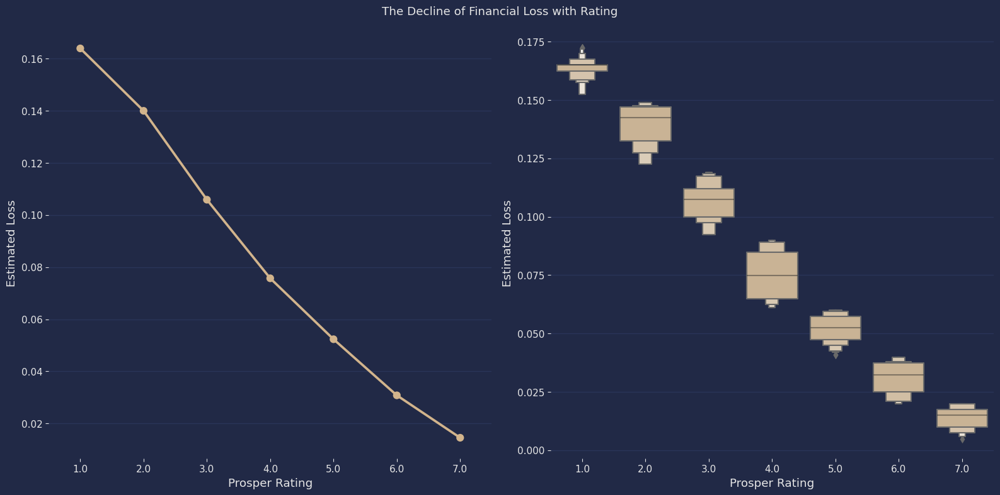

In [175]:
fig, axs = plt.subplots(1,2,figsize=(16,8))
sns.boxenplot(EL[EL['EstimatedLoss']<.175], x='ProsperRating', y="EstimatedLoss", color='tan', ax=axs[1])
axs[1].set_ylabel('Estimated Loss')
axs[1].set_xlabel('Prosper Rating')
sns.pointplot(EL[EL['EstimatedLoss']<.175], x='ProsperRating', y="EstimatedLoss", color='tan', ax=axs[0])
axs[0].set_ylabel('Estimated Loss')
axs[0].set_xlabel('Prosper Rating')
plt.suptitle('The Decline of Financial Loss with Rating')
plt.tight_layout()
plt.show()

## Investigating potential for a comprehensive red flag system

In [176]:
ogHT.head(2)

,LoanStatus,APR,LoanOriginalAmount,OpenCreditLines,TotalCreditLinespast7years,TotalInquiries,CurrentDelinquencies,AmountDelinquent,BankcardUtilization,TotalTrades,DebtToIncomeRatio,CreditScore,LenderYield,ProsperRating,EstimatedLoss,EstimatedReturn,EstimatedEffectiveYield,Investors
0,Current,0.120,10000,14.0,29.0,5.0,0.0,0.0,0.21,29.0,0.18,690.0,0.082,6.0,0.025,0.055,0.080,1
2,Current,0.125,10000,5.0,29.0,1.0,4.0,10056.0,0.04,39.0,0.26,810.0,0.087,6.0,0.025,0.060,0.085,158


In [177]:
defaulted = HTrisky[HTrisky['LoanStatus']=='Defaulted'].copy(deep=True)
completed = HTrisky[HTrisky['LoanStatus']=='Completed'].copy(deep=True)
print(defaulted.shape)
print(completed.shape)

(7134, 15)
(4856, 15)


In [178]:
defaulted.describe()

,ProsperRating,APR,OpenCreditLines,TotalInquiries,TotalTrades,CurrentDelinquencies,Investors,AmountDelinquent,BankcardUtilization,DebtToIncomeRatio,LenderYield,EstimatedReturn,EstimatedLoss
count,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000,7134.000
mean,4.076,0.220,9.329,6.758,24.056,1.288,68.238,1056.905,0.526,0.259,0.186,0.096,0.080
std,1.671,0.083,4.818,10.244,11.597,3.408,93.936,6260.768,0.326,0.305,0.075,0.031,0.047
min,1.000,0.009,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.033,-0.135,0.005
25%,3.000,0.152,6.000,2.000,15.000,0.000,1.000,0.000,0.250,0.150,0.126,0.074,0.042
50%,4.000,0.216,9.000,4.000,23.000,0.000,32.000,0.000,0.561,0.220,0.177,0.091,0.070
75%,5.000,0.293,11.000,8.000,31.000,1.000,98.000,208.000,0.800,0.320,0.247,0.116,0.112
max,7.000,0.414,43.000,379.000,93.000,45.000,881.000,230291.000,2.360,10.010,0.340,0.257,0.366


In [179]:
completed.describe()

,ProsperRating,APR,OpenCreditLines,TotalInquiries,TotalTrades,CurrentDelinquencies,Investors,AmountDelinquent,BankcardUtilization,DebtToIncomeRatio,LenderYield,EstimatedReturn,EstimatedLoss
count,4856.000,4856.000,4856.000,4856.000,4856.000,4856.000,4856.000,4856.000,4856.000,4856.000,4856.000,4856.000,4856.000
mean,4.030,0.192,8.584,6.474,24.205,0.971,68.183,896.926,0.462,0.258,0.188,0.097,0.082
std,1.671,0.091,4.466,7.145,11.603,2.635,94.659,5048.373,0.335,0.284,0.074,0.030,0.047
min,1.000,0.022,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.010,0.030,-0.168,0.006
25%,3.000,0.109,6.000,2.000,16.000,0.000,1.000,0.000,0.140,0.150,0.130,0.075,0.045
50%,4.000,0.177,9.000,4.000,23.000,0.000,32.000,0.000,0.540,0.230,0.181,0.094,0.075
75%,5.000,0.264,10.000,8.000,31.000,1.000,97.000,869.250,0.710,0.320,0.250,0.117,0.112
max,7.000,0.414,37.000,106.000,102.000,36.000,770.000,161344.000,2.660,10.010,0.340,0.228,0.366


<Axes: xlabel='DebtToIncomeRatio', ylabel='Count'>

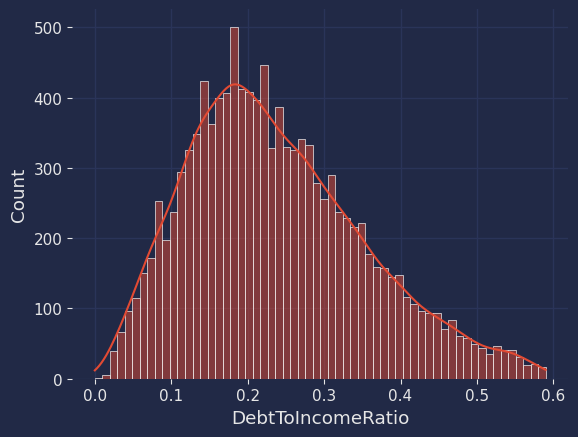

In [180]:
sns.histplot(HTrisky.loc[HTrisky['DebtToIncomeRatio']<.6, 'DebtToIncomeRatio'], kde=True, bins=60)

In [210]:
ZDB = HTrisky.loc[HTrisky['DebtToIncomeRatio']<.6].copy(deep=True)

## Debt To Income Ratio Mean Z-tests
What's the probability that a new customer has a ratio that falls below the sample of customers with poor Debt To Income Ratio (>=.43)?
* null hypothesis: x̄ >= .43
* alternate hypothesis: x̄ < .43

In [214]:
X = HTrisky.loc[HTrisky['DebtToIncomeRatio']<.6, 'DebtToIncomeRatio']
Y = .43
alpha = .025
z_score = 1.65
z_stat, p_value = ztest(X, value=Y, alternative='smaller', ddof=0) # for 1 sample or population distribution
sample_std = np.std(X) 
n = len(X)
# standard error
sem = sample_std / np.sqrt(n)
# z-score
z_score = (Y-X.mean())/sample_std
# Confidence interval
ci_lower = Y - z_score * sem
ci_upper = Y + z_score * sem

#if p_value > alpha:
    #print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
#else:
    #print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")

print("Z-statistic:", round(z_stat, 3))
print("P-value:", p_value)
print("Standard error:", round(sem, 7))
print("Confidence Interval Upper:", round(ci_upper, 5))
print("Confidence Interval Lower:", round(ci_lower, 5))
print(f"P(z>{Y}) = 1-.85083 = .14917")
print(f'Score: {round(z_score, 3)}')

Z-statistic: -178.706
P-value: 0.0
Standard error: 0.0010761
Confidence Interval Upper: 0.43177
Confidence Interval Lower: 0.42823
P(z>0.43) = 1-.85083 = .14917
Score: 1.649


What's the probability that a new customer has a ratio that falls over the sample of customers with preferred Debt To Income Ratio (<=.36)?
* null hypothesis: x̄ <= .36
* alternate hypothesis: x̄ > .36

In [215]:
X = HTrisky.loc[HTrisky['DebtToIncomeRatio']<.6, 'DebtToIncomeRatio']
Y = .36
alpha = .025
z_score = .46
z_stat, p_value = ztest(X, value=Y, alternative='larger', ddof=0)
sample_std = np.std(X) 
n = len(X)
# standard error
sem = sample_std / np.sqrt(n)
# z-score
z_score = (Y-X.mean())/sample_std
# Confidence interval
ci_lower = Y - z_score * sem
ci_upper = Y + z_score * sem

#if p_value > alpha:
    #print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
#else:
    #print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")

print("Z-statistic:", round(z_stat, 3))
print("P-value:", p_value)
print("Standard error:", round(sem, 7))
print("Confidence Interval Upper:", round(ci_upper, 5))
print("Confidence Interval Lower:", round(ci_lower, 5))
print(f"P(z>{Y}) = 1-.85083 = .14917")
print(f'Score: {round(z_score, 3)}')

Z-statistic: -113.654
P-value: 1.0
Standard error: 0.0010761
Confidence Interval Upper: 0.36113
Confidence Interval Lower: 0.35887
P(z>0.36) = 1-.85083 = .14917
Score: 1.049


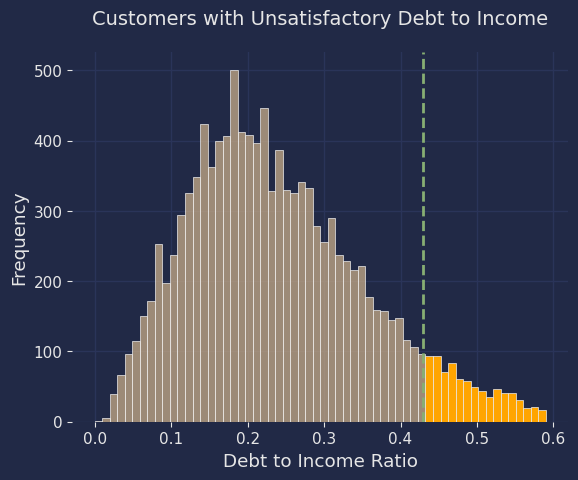

In [184]:
sns.histplot(ZDB['DebtToIncomeRatio'], bins=60, color='tan', alpha=0.7)
threshold = .43
# Shade bars after the threshold x-tick
for i, patch in enumerate(plt.gca().patches):
    if patch.get_x() >= threshold:
        patch.set_facecolor('orange')

plt.axvline(x=threshold, color='#87ae73', linestyle='--', linewidth=2)
plt.xlabel('Debt to Income Ratio')
plt.ylabel('Frequency')
plt.title('Customers with Unsatisfactory Debt to Income')
plt.show()

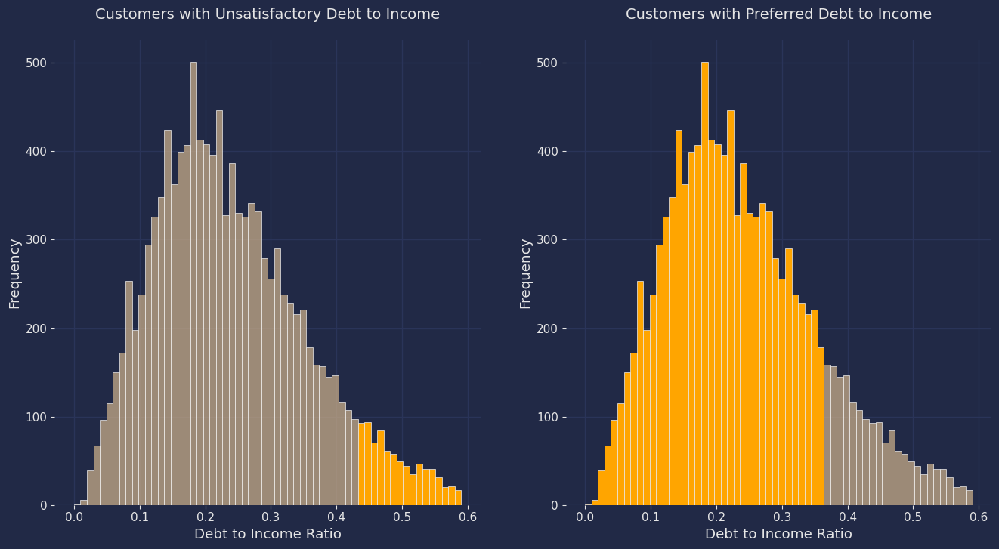

In [185]:
fig, axs = plt.subplots(1,2,figsize=(16,8))
sns.histplot(ZDB['DebtToIncomeRatio'], bins=60, color='tan', alpha=0.7, ax=axs[0])

# Shade bars after the threshold x-tick
for i, patch in enumerate(axs[0].patches):
    if patch.get_x() >= .43:
        patch.set_facecolor('orange')

axs[0].set_xlabel('Debt to Income Ratio')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Customers with Unsatisfactory Debt to Income')

sns.histplot(ZDB['DebtToIncomeRatio'], bins=60, color='tan', alpha=0.7, ax=axs[1])
threshold = .43

# Shade bars after the threshold x-tick
for i, patch in enumerate(axs[1].patches):
    if patch.get_x() <= .36:
        patch.set_facecolor('orange')

axs[1].set_xlabel('Debt to Income Ratio')
axs[1].set_ylabel('Frequency')
axs[1].set_title('Customers with Preferred Debt to Income')

plt.show()

## Debt To Income Ratio Proportion Z-tests
On this sample of 1,000 recent loans, the outcome for customers having poor Debt to Income Ratio (>=.43) was 200. 
* Poor (p): 904/11746 |  Preferred (p): 10011/11746
* null hypothesis: p̂ = .20
* alternate hypothesis: p̂ != .20

In [186]:
print(len(ZDB))
print(len(ZDB[ZDB['DebtToIncomeRatio']>=.43]))
print(len(ZDB[ZDB['DebtToIncomeRatio']<=.36]))

11746
904
10011


In [187]:
p = 904/11746
X = ZDB['DebtToIncomeRatio'].copy()
Y = ZDB.loc[ZDB['DebtToIncomeRatio']>=.43, 'DebtToIncomeRatio']
alpha = .05
z_score = 1.645
z_stat, p_value = proportions_ztest(200, 1000, p, prop_var=p, alternative='two-sided') #to calculate z-statistic on population not estimated from sample with np.sqrt(n)
n = len(Y)
sample_std = np.sqrt(p*(1-p)/n)
# standard error
sem = sample_std / np.sqrt(n)
# Confidence interval
ci_lower = .2 - z_score * sem
ci_upper = .2 + z_score * sem
# z-test central limit theorem check
Zvalid = n*p>=10 and n*(1-p)>=10

if p_value > alpha:
    print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
else:
    print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")

if Zvalid:
    print("\u001b[32mVALIDITY DETECTED\u001b[0m\n")
else:
    print("\x1b[31mVALIDITY NOT DETECTED\x1b[0m\n")

print("Z-statistic:", round(z_stat, 3))
print("P-value:", p_value)
print("Standard error:", round(sem, 7))
print("Confidence Interval Upper:", round(ci_upper, 5))
print("Confidence Interval Lower:", round(ci_lower, 5))

SIGNIFICANCE DETECTED

VALIDITY DETECTED

Z-statistic: 14.598
P-value: 2.8982263109163624e-48
Standard error: 0.0002948
Confidence Interval Upper: 0.20049
Confidence Interval Lower: 0.19951


On this sample of 1,000 recent loans, the outcome for customers having preferred Debt to Income Ratio (<=.36) was 700. 
* Poor (p): 904/11746 |  Preferred (p): 10011/11746
* null hypothesis: p̂ = .70
* alternate hypothesis: p̂ != .70

In [188]:
p = 10011/11746
X = ZDB['DebtToIncomeRatio'].copy()
Y = ZDB.loc[ZDB['DebtToIncomeRatio']<=.36, 'DebtToIncomeRatio']
alpha = .05
z_score = 1.645
z_stat, p_value = proportions_ztest(700, 1000, p, prop_var=p, alternative='two-sided') #to calculate z-statistic on population not estimated from sample with np.sqrt(n)
n = len(Y)
sample_std = np.sqrt(p*(1-p)/n)
# standard error
sem = sample_std / np.sqrt(n)
# Confidence interval
ci_lower = .2 - z_score * sem
ci_upper = .2 + z_score * sem
# z-test central limit theorem check
Zvalid = n*p>=10 and n*(1-p)>=10

if p_value > alpha:
    print("\x1b[31mSIGNIFICANCE NOT DETECTED\x1b[0m\n")
else:
    print("\u001b[32mSIGNIFICANCE DETECTED\u001b[0m\n")

if Zvalid:
    print("\u001b[32mVALIDITY DETECTED\u001b[0m\n")
else:
    print("\x1b[31mVALIDITY NOT DETECTED\x1b[0m\n")

print("Z-statistic:", round(z_stat, 3))
print("P-value:", p_value)
print("Standard error:", round(sem, 7))
print("Confidence Interval Upper:", round(ci_upper, 5))
print("Confidence Interval Lower:", round(ci_lower, 5))

SIGNIFICANCE DETECTED

VALIDITY DETECTED

Z-statistic: -13.573
P-value: 5.796530198291436e-42
Standard error: 3.54e-05
Confidence Interval Upper: 0.20006
Confidence Interval Lower: 0.19994
